Connected to Python

In [ ]:
# df closure lists
closure_df = pd.DataFrame(closure_csm)

# 'df_active' : filter out active short-term hospitals
df_active = df_short[(df_short['PGM_TRMNTN_CD'] == 0) & df_short['ZIP_CD'].isin(closure_df['ZIP_CD'])]

# 'zip_year' : get the counts of active hospitals in each zip code and year
zip_year = df_active.groupby(['ZIP_CD', 'YEAR']).size().reset_index(name='active')
zip_year = zip_year[['ZIP_CD', 'YEAR', 'active']]

closure_counts = closure_df[['ZIP_CD', 'YEAR_CLO', 'PRVDR_NUM']]
closure_counts = (
    closure_counts.groupby(['ZIP_CD', 'YEAR_CLO'])
    .PRVDR_NUM.nunique()
    .reset_index(name='num_closure')
)

# Rename 'YEAR_CLO' to 'YEAR' for consistency with zip_year
closure_counts = closure_counts.rename(columns={'YEAR_CLO': 'YEAR'})

# Merge closure_counts with zip_year on 'ZIP_CD' and 'YEAR'
zip_year = zip_year.merge(closure_counts, on=['ZIP_CD', 'YEAR'], how='left')

# Fill NaN values in 'num_closure' with 0 and convert to int
zip_year['num_closure'] = zip_year['num_closure'].fillna(0).astype(int)

# 'zip_year': contain num of closure, active, active last year for comparision in next step
zip_year['active_next_y'] = zip_year.groupby('ZIP_CD')['active'].shift(-1)

# 'zip_false_clo': filter for false closures where the number of active hospitals does not decrease in the following year
zip_false_clo = zip_year[
    (zip_year['num_closure'] != 0) &
    (zip_year['active'] <= zip_year['active_next_y'])
]

print(zip_false_clo.shape)
zip_false_clo

NameError: name 'pd' is not defined

In [ ]:
import pandas as pd
import altair as alt
import time
import os
from tabulate import tabulate
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Polygon

import warnings 
warnings.filterwarnings('ignore')

In [ ]:
# local path set-up
base_path = "/Users/nancy/Documents/Document/U.S/class/fall 2024/dap2/homework/problem-set-4-y/data"

In [ ]:
# import 2016 pos dataset
path_data_pos2016 = os.path.join(base_path, 'pos_1/pos2016.csv')
df_pos2016 = pd.read_csv(path_data_pos2016)
print(df_pos2016.shape)
df_pos2016.head(3)

(141557, 13)


,PRVDR_CTGRY_SBTYP_CD,PRVDR_CTGRY_CD,CITY_NAME,SSA_CNTY_CD,PRVDR_NUM,STATE_CD,SSA_STATE_CD,TRMNTN_EXPRTN_DT,ZIP_CD,GNRL_FAC_TYPE_CD,PSYCH_UNIT_TRMNTN_CD,FAC_NAME,PGM_TRMNTN_CD
0,1.0,1.0,DOTHAN,340.0,10001.0,AL,1.0,NaN,36301.0,1.0,1.0,SOUTHEAST ALABAMA MEDICAL CENTER,0
1,1.0,1.0,BRIDGEPORT,350.0,10004.0,AL,1.0,20010831.0,35740.0,1.0,NaN,NORTH JACKSON HOSPITAL,1
2,1.0,1.0,BOAZ,470.0,10005.0,AL,1.0,NaN,35957.0,1.0,NaN,MARSHALL MEDICAL CENTER SOUTH,0


In [ ]:
# short-term hospitals(type code 01 and subtype code 01)
df_short_pos2016 = df_pos2016[(df_pos2016["PRVDR_CTGRY_CD"] == 1.0)&(df_pos2016['PRVDR_CTGRY_SBTYP_CD'] == 1)]
print(df_short_pos2016.shape)

print(df_short_pos2016['PRVDR_NUM'].nunique())

(7245, 13)
7245


In [ ]:
df_short_pos2016_2 = df_pos2016[df_pos2016["GNRL_FAC_TYPE_CD"] == 1.0]
print(df_short_pos2016_2['PRVDR_NUM'].nunique())

7245


In [ ]:
# import datasets from 2017Q4 ~ 2019Q4
def load_yearly_data(base_path, start_year=2017, end_year=2019):
    # Dictionary to store DataFrames for each year
    data_frames = {}
    
    # Loop through each year in the range
    for year in range(start_year, end_year + 1):
        # Construct the file path for the specific year
        file_path = os.path.join(base_path, f'pos{year}.csv')
        df = pd.read_csv(file_path)
        
        # Filter for short-term facilities
        df = df[(df["PRVDR_CTGRY_CD"] == 1) & (df["PRVDR_CTGRY_SBTYP_CD"] == 1.0)]
        
        # Add a 'Year' column
        df["YEAR"] = year
        
        # Store the filtered DataFrame with the year column in the dictionary
        data_frames[year] = df        
        print(f"Loaded data for {year}: {data_frames[year].shape[0]} rows, {data_frames[year].shape[1]} columns")
    
    return data_frames

data_frames = load_yearly_data(base_path)

df_short_pos2017 = data_frames[2017]
df_short_pos2018 = data_frames[2018]
df_short_pos2019 = data_frames[2019]

print(df_short_pos2017.columns)
print(df_short_pos2018.columns)
print(df_short_pos2019.columns)

FileNotFoundError: [Errno 2] No such file or directory: '/Users/nancy/Documents/Document/U.S/class/fall 2024/dap2/homework/problem-set-4-y/data/pos2017.csv'

In [ ]:
# append datset
df_short_pos2016['YEAR'] = 2016
df_short = pd.concat([df_short_pos2016] + list(data_frames.values()), ignore_index=True)
df_short.head(3)

NameError: name 'data_frames' is not defined

In [ ]:
# short-term hospitals(type code 01 and subtype code 01)
df_short_pos2016 = df_pos2016[(df_pos2016["PRVDR_CTGRY_CD"] == 1.0)&(df_pos2016['PRVDR_CTGRY_SBTYP_CD'] == 1)]
print(df_short_pos2016.shape)

print(df_short_pos2016['PRVDR_NUM'].nunique())

(7245, 13)
7245


In [ ]:
df_short_pos2016_2 = df_pos2016[df_pos2016["GNRL_FAC_TYPE_CD"] == 1.0]
print(df_short_pos2016_2['PRVDR_NUM'].nunique())

7245


In [ ]:
# import datasets from 2017Q4 ~ 2019Q4
def load_yearly_data(base_path, start_year=2017, end_year=2019):
    # Dictionary to store DataFrames for each year
    data_frames = {}
    
    # Loop through each year in the range
    for year in range(start_year, end_year + 1):
        # Construct the file path for the specific year
        file_path = os.path.join(base_path, f'pos{year}.csv')
        df = pd.read_csv(file_path)
        
        # Filter for short-term facilities
        df = df[(df["PRVDR_CTGRY_CD"] == 1) & (df["PRVDR_CTGRY_SBTYP_CD"] == 1.0)]
        
        # Add a 'Year' column
        df["YEAR"] = year
        
        # Store the filtered DataFrame with the year column in the dictionary
        data_frames[year] = df        
        print(f"Loaded data for {year}: {data_frames[year].shape[0]} rows, {data_frames[year].shape[1]} columns")
    
    return data_frames

data_frames = load_yearly_data(base_path)

df_short_pos2017 = data_frames[2017]
df_short_pos2018 = data_frames[2018]
df_short_pos2019 = data_frames[2019]

print(df_short_pos2017.columns)
print(df_short_pos2018.columns)
print(df_short_pos2019.columns)

FileNotFoundError: [Errno 2] No such file or directory: '/Users/nancy/Documents/Document/U.S/class/fall 2024/dap2/homework/problem-set-4-y/data/pos2017.csv'

In [ ]:
import pandas as pd
import altair as alt
import time
import os
from tabulate import tabulate
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Polygon

import warnings 
warnings.filterwarnings('ignore')

In [ ]:
# local path set-up
base_path = "/Users/nancy/Documents/Document/U.S/class/fall 2024/dap2/homework/problem-set-4-y/data"

In [ ]:
# import 2016 pos dataset
path_data_pos2016 = os.path.join(base_path, 'pos_1/pos2016.csv')
df_pos2016 = pd.read_csv(path_data_pos2016)
print(df_pos2016.shape)
df_pos2016.head(3)

(141557, 13)


,PRVDR_CTGRY_SBTYP_CD,PRVDR_CTGRY_CD,CITY_NAME,SSA_CNTY_CD,PRVDR_NUM,STATE_CD,SSA_STATE_CD,TRMNTN_EXPRTN_DT,ZIP_CD,GNRL_FAC_TYPE_CD,PSYCH_UNIT_TRMNTN_CD,FAC_NAME,PGM_TRMNTN_CD
0,1.0,1.0,DOTHAN,340.0,10001.0,AL,1.0,NaN,36301.0,1.0,1.0,SOUTHEAST ALABAMA MEDICAL CENTER,0
1,1.0,1.0,BRIDGEPORT,350.0,10004.0,AL,1.0,20010831.0,35740.0,1.0,NaN,NORTH JACKSON HOSPITAL,1
2,1.0,1.0,BOAZ,470.0,10005.0,AL,1.0,NaN,35957.0,1.0,NaN,MARSHALL MEDICAL CENTER SOUTH,0


In [ ]:
# short-term hospitals(type code 01 and subtype code 01)
df_short_pos2016 = df_pos2016[(df_pos2016["PRVDR_CTGRY_CD"] == 1.0)&(df_pos2016['PRVDR_CTGRY_SBTYP_CD'] == 1)]
print(df_short_pos2016.shape)

print(df_short_pos2016['PRVDR_NUM'].nunique())

(7245, 13)
7245


In [ ]:
df_short_pos2016_2 = df_pos2016[df_pos2016["GNRL_FAC_TYPE_CD"] == 1.0]
print(df_short_pos2016_2['PRVDR_NUM'].nunique())

7245


In [ ]:
# import datasets from 2017Q4 ~ 2019Q4
def load_yearly_data(base_path, start_year=2017, end_year=2019):
    # Dictionary to store DataFrames for each year
    data_frames = {}
    
    # Loop through each year in the range
    for year in range(start_year, end_year + 1):
        # Construct the file path for the specific year
        file_path = os.path.join(base_path, f'pos_1/pos{year}.csv')
        
        # Filter for short-term facilities
        df = df[(df["PRVDR_CTGRY_CD"] == 1) & (df["PRVDR_CTGRY_SBTYP_CD"] == 1.0)]
        
        # Add a 'Year' column
        df["YEAR"] = year
        
        # Store the filtered DataFrame with the year column in the dictionary
        data_frames[year] = df        
        print(f"Loaded data for {year}: {data_frames[year].shape[0]} rows, {data_frames[year].shape[1]} columns")
    
    return data_frames

data_frames = load_yearly_data(base_path)

df_short_pos2017 = data_frames[2017]
df_short_pos2018 = data_frames[2018]
df_short_pos2019 = data_frames[2019]

print(df_short_pos2017.columns)
print(df_short_pos2018.columns)
print(df_short_pos2019.columns)

UnboundLocalError: cannot access local variable 'df' where it is not associated with a value

In [ ]:
# import datasets from 2017Q4 ~ 2019Q4
def load_yearly_data(base_path, start_year=2017, end_year=2019):
    # Dictionary to store DataFrames for each year
    data_frames = {}
    
    # Loop through each year in the range
    for year in range(start_year, end_year + 1):
        # Construct the file path for the specific year
        file_path = os.path.join(base_path, f'pos_1/pos{year}.csv')
        
        # Filter for short-term facilities
        df = df[(df["PRVDR_CTGRY_CD"] == 1) & (df["PRVDR_CTGRY_SBTYP_CD"] == 1.0)]
        
        # Add a 'Year' column
        df["YEAR"] = year
        
        # Store the filtered DataFrame with the year column in the dictionary
        data_frames[year] = df        
        print(f"Loaded data for {year}: {data_frames[year].shape[0]} rows, {data_frames[year].shape[1]} columns")
    
    return data_frames

data_frames = load_yearly_data(base_path)

df_short_pos2017 = data_frames[2017]
df_short_pos2018 = data_frames[2018]
df_short_pos2019 = data_frames[2019]

print(df_short_pos2017.columns)
print(df_short_pos2018.columns)
print(df_short_pos2019.columns)

UnboundLocalError: cannot access local variable 'df' where it is not associated with a value

In [ ]:
# import datasets from 2017Q4 ~ 2019Q4
def load_yearly_data(base_path, start_year=2017, end_year=2019):
    # Dictionary to store DataFrames for each year
    data_frames = {}
    
    # Loop through each year in the range
    for year in range(start_year, end_year + 1):
        # Construct the file path for the specific year
        file_path = os.path.join(base_path, f'pos_1/pos{year}.csv')
        
        df = pd.read_csv(file_path)
        
        # Filter for short-term facilities
        df = df[(df["PRVDR_CTGRY_CD"] == 1) & (df["PRVDR_CTGRY_SBTYP_CD"] == 1.0)]
        
        # Add a 'Year' column
        df["YEAR"] = year
        
        # Store the filtered DataFrame with the year column in the dictionary
        data_frames[year] = df        
        print(f"Loaded data for {year}: {data_frames[year].shape[0]} rows, {data_frames[year].shape[1]} columns")
    
    return data_frames

data_frames = load_yearly_data(base_path)

df_short_pos2017 = data_frames[2017]
df_short_pos2018 = data_frames[2018]
df_short_pos2019 = data_frames[2019]

print(df_short_pos2017.columns)
print(df_short_pos2018.columns)
print(df_short_pos2019.columns)

Loaded data for 2017: 7260 rows, 14 columns
Loaded data for 2018: 7277 rows, 14 columns
Loaded data for 2019: 7303 rows, 14 columns
Index(['PRVDR_CTGRY_SBTYP_CD', 'PRVDR_CTGRY_CD', 'CITY_NAME', 'SSA_CNTY_CD',
       'PRVDR_NUM', 'STATE_CD', 'SSA_STATE_CD', 'TRMNTN_EXPRTN_DT', 'ZIP_CD',
       'GNRL_FAC_TYPE_CD', 'PSYCH_UNIT_TRMNTN_CD', 'YEAR', 'FAC_NAME',
       'PGM_TRMNTN_CD'],
      dtype='object')
Index(['PRVDR_CTGRY_SBTYP_CD', 'PRVDR_CTGRY_CD', 'CITY_NAME', 'SSA_CNTY_CD',
       'PRVDR_NUM', 'STATE_CD', 'SSA_STATE_CD', 'TRMNTN_EXPRTN_DT', 'ZIP_CD',
       'GNRL_FAC_TYPE_CD', 'PSYCH_UNIT_TRMNTN_CD', 'YEAR', 'FAC_NAME',
       'PGM_TRMNTN_CD'],
      dtype='object')
Index(['PRVDR_CTGRY_SBTYP_CD', 'PRVDR_CTGRY_CD', 'CITY_NAME', 'SSA_CNTY_CD',
       'PRVDR_NUM', 'STATE_CD', 'SSA_STATE_CD', 'TRMNTN_EXPRTN_DT', 'ZIP_CD',
       'GNRL_FAC_TYPE_CD', 'PSYCH_UNIT_TRMNTN_CD', 'FAC_NAME', 'PGM_TRMNTN_CD',
       'YEAR'],
      dtype='object')


In [ ]:
# append datset
df_short_pos2016['YEAR'] = 2016
df_short = pd.concat([df_short_pos2016] + list(data_frames.values()), ignore_index=True)
df_short.head(3)

,PRVDR_CTGRY_SBTYP_CD,PRVDR_CTGRY_CD,CITY_NAME,SSA_CNTY_CD,PRVDR_NUM,STATE_CD,SSA_STATE_CD,TRMNTN_EXPRTN_DT,ZIP_CD,GNRL_FAC_TYPE_CD,PSYCH_UNIT_TRMNTN_CD,FAC_NAME,PGM_TRMNTN_CD,YEAR
0,1.0,1.0,DOTHAN,340.0,10001.0,AL,1.0,NaN,36301.0,1.0,1.0,SOUTHEAST ALABAMA MEDICAL CENTER,0,2016
1,1.0,1.0,BRIDGEPORT,350.0,10004.0,AL,1.0,20010831.0,35740.0,1.0,NaN,NORTH JACKSON HOSPITAL,1,2016
2,1.0,1.0,BOAZ,470.0,10005.0,AL,1.0,NaN,35957.0,1.0,NaN,MARSHALL MEDICAL CENTER SOUTH,0,2016


In [ ]:
obs_year = df_short.groupby('YEAR')['PRVDR_NUM'].count().reset_index()
obs_year.rename(columns={'PRVDR_NUM':'NUM_HOS'},inplace=True)

bar_obs = alt.Chart(obs_year).mark_bar(color='#9966CC').encode(
  x = alt.X('YEAR:O',title='Year'),
  y = alt.Y('NUM_HOS:Q',title='Count of Observations'),
  tooltip=['YEAR','NUM_HOS']
)

text_obs = bar_obs.mark_text(
    align='center',
    baseline='bottom',
    dy=-5
).encode(
    text='NUM_HOS:Q'
)
chart_obs = (bar_obs+text_obs).properties(
  title = 'Plot 1:Numbers of Short-term Hospitals by Year',
  width='container',
  height=400
)
chart_obs

alt.LayerChart(...)

In [ ]:
obs_year_unique = df_short.groupby('YEAR')['PRVDR_NUM'].nunique().reset_index()
obs_year_unique.rename(columns={'PRVDR_NUM':'NUM_HOS_UQ'},inplace=True)

bar_obs_unique = alt.Chart(obs_year_unique).mark_bar(color='#9966CC').encode(
  x = alt.X('YEAR:O',title='Year'),
  y = alt.Y('NUM_HOS_UQ:Q',title='Unique Count of Observations'),
  tooltip=['YEAR','NUM_HOS_UQ']
)

text_obs_unique = bar_obs_unique.mark_text(
    align='center',
    baseline='bottom',
    dy=-5
).encode(
    text='NUM_HOS_UQ:Q'
)
chart_obs_unique = (bar_obs_unique+text_obs_unique).properties(
  title = 'Plot 1:Unique Numbers of Short-term Hospitals by Year',
  width='container',
  height=400
)
chart_obs_unique

alt.LayerChart(...)

In [ ]:
active_short2016 = df_short[(df_short['PGM_TRMNTN_CD'] == 0) & (df_short['YEAR'] == 2016)]['PRVDR_NUM'].unique()

def find_closure_csm(active_short2016, df_short):
  closure_csm = []

  for csm in active_short2016:
    # Flag to stop searching once added to closure_csm
    added_to_closure = False

    # Retrieve 2016 ZIP code and facility name for fallback use
    info_2016 = df_short[(df_short['PRVDR_NUM'] == csm) & (df_short['YEAR'] == 2016)]
    zip_2016 = info_2016['ZIP_CD'].iloc[0] if not info_2016.empty else None
    fac_name_2016 = info_2016['FAC_NAME'].iloc[0] if not info_2016.empty else None

    for year in [2017,2018,2019]:
      year_check = df_short[(df_short['YEAR']==year)&(df_short['PRVDR_NUM']==csm)]

      # Check conditions:
      # 1. If the provider exists and PGM_TRMNTN_CD is not 0, add to closure_csm
      # 2. If the provider does not exist for this year, also add to closure_csm
      if not year_check.empty and (year_check['PGM_TRMNTN_CD'].iloc[0]!=0):
        closure_csm.append({
          'PRVDR_NUM':csm,
          'YEAR_CLO':year,
          'ZIP_CD':year_check['ZIP_CD'].values[0],
          'FAC_NAME':year_check['FAC_NAME'].values[0]
        })
        added_to_closure = False
        break

      elif year_check.empty:
        closure_csm.append({
            'PRVDR_NUM': csm,
            'YEAR_CLO': year,
            'ZIP_CD': zip_2016,
            'FAC_NAME': fac_name_2016
        })
        added_to_closure = True
        break

      if added_to_closure:
        continue

  return closure_csm

closure_csm = find_closure_csm(active_short2016, df_short)
print(f"There are {len(closure_csm)} hospitals suspected to close.")

There are 174 hospitals suspected to close.


In [ ]:
# Sort the list by 'FAC_NAME'
closure_csm.sort(key=lambda x: x['FAC_NAME'])

# Print the first 10 items by 'FAC_NAME' and 'YEAR_CLO'
for entry in closure_csm[:10]:
    print(f"The facility named '{entry['FAC_NAME']}' was closed in {entry['YEAR_CLO']}.")

The facility named 'ABRAZO MARYVALE CAMPUS' was closed in 2017.
The facility named 'ADVENTIST MEDICAL CENTER - CENTRAL VALLEY' was closed in 2017.
The facility named 'AFFINITY MEDICAL CENTER' was closed in 2018.
The facility named 'ALBANY MEDICAL CENTER / SOUTH CLINICAL CAMPUS' was closed in 2017.
The facility named 'ALLEGIANCE SPECIALTY HOSPITAL OF KILGORE' was closed in 2017.
The facility named 'ALLIANCE LAIRD HOSPITAL' was closed in 2019.
The facility named 'ALLIANCEHEALTH DEACONESS' was closed in 2019.
The facility named 'ARKANSAS VALLEY REGIONAL MEDICAL CENTER' was closed in 2017.
The facility named 'ASCENSION NE WISCONSIN MERCY CAMPUS' was closed in 2018.
The facility named 'ATRIUM HEALTH KINGS MOUNTAIN' was closed in 2019.


In [ ]:
# df closure lists
closure_df = pd.DataFrame(closure_csm)

# 'df_active' : filter out active short-term hospitals
df_active = df_short[(df_short['PGM_TRMNTN_CD'] == 0) & df_short['ZIP_CD'].isin(closure_df['ZIP_CD'])]

# 'zip_year' : get the counts of active hospitals in each zip code and year
zip_year = df_active.groupby(['ZIP_CD', 'YEAR']).size().reset_index(name='active')
zip_year = zip_year[['ZIP_CD', 'YEAR', 'active']]

closure_counts = closure_df[['ZIP_CD', 'YEAR_CLO', 'PRVDR_NUM']]
closure_counts = (
    closure_counts.groupby(['ZIP_CD', 'YEAR_CLO'])
    .PRVDR_NUM.nunique()
    .reset_index(name='num_closure')
)

# Rename 'YEAR_CLO' to 'YEAR' for consistency with zip_year
closure_counts = closure_counts.rename(columns={'YEAR_CLO': 'YEAR'})

# Merge closure_counts with zip_year on 'ZIP_CD' and 'YEAR'
zip_year = zip_year.merge(closure_counts, on=['ZIP_CD', 'YEAR'], how='left')

# Fill NaN values in 'num_closure' with 0 and convert to int
zip_year['num_closure'] = zip_year['num_closure'].fillna(0).astype(int)

# 'zip_year': contain num of closure, active, active last year for comparision in next step
zip_year['active_next_y'] = zip_year.groupby('ZIP_CD')['active'].shift(-1)

# 'zip_false_clo': filter for false closures where the number of active hospitals does not decrease in the following year
zip_false_clo = zip_year[
    (zip_year['num_closure'] != 0) &
    (zip_year['active'] <= zip_year['active_next_y'])
]

print(zip_false_clo.shape)
zip_false_clo

(27, 5)


,ZIP_CD,YEAR,active,num_closure,active_next_y
2,785.0,2017,1,1,1.0
6,928.0,2017,1,1,1.0
35,12208.0,2017,2,1,2.0
40,12601.0,2017,1,1,1.0
62,17901.0,2018,1,1,1.0
66,18017.0,2018,1,1,1.0
119,33407.0,2018,1,1,1.0
127,35611.0,2018,1,1,1.0
141,37404.0,2018,2,1,2.0
173,42003.0,2017,2,1,2.0


In [ ]:
closure_counts

,ZIP_CD,YEAR,num_closure
0,714.0,2017,1
1,785.0,2017,1
2,928.0,2017,1
3,1082.0,2017,1
4,1510.0,2018,1
...,...,...,...
168,94578.0,2019,1
169,95020.0,2019,1
170,95128.0,2019,1
171,95472.0,2019,1


In [ ]:
closure_counts['num_closure'].sum()

174

In [ ]:
closure_counts['num_closure'].describe

<bound method NDFrame.describe of 0      1
1      1
2      1
3      1
4      1
      ..
168    1
169    1
170    1
171    1
172    1
Name: num_closure, Length: 173, dtype: int64>

In [ ]:
closure_counts[closure_counts['num_closure']!=1]

,ZIP_CD,YEAR,num_closure
43,33136.0,2019,2


In [ ]:
zip_false_clo['PRVDR_NUM'].nunique()

# Create a set of (YEAR, PRVDR_NUM) pairs from zip_false_clo to remove
remove_pairs = set(zip(zip_false_clo['YEAR'], zip_false_clo['PRVDR_NUM']))

# Filter closure_csm to exclude entries with matching YEAR and PRVDR_NUM in remove_pairs
closure_csm_true = [
    entry for entry in closure_csm
    if (entry['YEAR_CLO'], entry['PRVDR_NUM']) not in remove_pairs
]

# closure_csm_filtered now contains only the entries that don’t match the specified (YEAR, PRVDR_NUM) pairs
print(f"Filtered closure_csm length: {len(closure_csm_true)}")

KeyError: 'PRVDR_NUM'

In [ ]:
# df closure lists
closure_df = pd.DataFrame(closure_csm)

# 'df_active' : filter out active short-term hospitals
df_active = df_short[(df_short['PGM_TRMNTN_CD'] == 0) & df_short['ZIP_CD'].isin(closure_df['ZIP_CD'])]

# 'zip_year' : get the counts of active hospitals in each zip code and year
zip_year = df_active.groupby(['ZIP_CD', 'YEAR']).size().reset_index(name='active')
zip_year = zip_year[['ZIP_CD', 'YEAR', 'active']]

closure_counts = closure_df[['ZIP_CD', 'YEAR_CLO', 'PRVDR_NUM']]

closure_counts = (
    closure_counts.groupby(['ZIP_CD', 'YEAR_CLO'])
    .agg(num_closure=('PRVDR_NUM', 'nunique'), PRVDR_NUM_list=('PRVDR_NUM', 'unique'))
    .reset_index()
)

# Rename 'YEAR_CLO' to 'YEAR' for consistency with zip_year
closure_counts = closure_counts.rename(columns={'YEAR_CLO': 'YEAR'})

# Merge closure_counts with zip_year on 'ZIP_CD' and 'YEAR'
zip_year = zip_year.merge(closure_counts, on=['ZIP_CD', 'YEAR'], how='left')

# Fill NaN values in 'num_closure' with 0 and convert to int
zip_year['num_closure'] = zip_year['num_closure'].fillna(0).astype(int)

# 'zip_year': contain num of closure, active, active last year for comparision in next step
zip_year['active_next_y'] = zip_year.groupby('ZIP_CD')['active'].shift(-1)

# 'zip_false_clo': filter for false closures where the number of active hospitals does not decrease in the following year
zip_false_clo = zip_year[
    (zip_year['num_closure'] != 0) &
    (zip_year['active'] <= zip_year['active_next_y'])
]

print(zip_false_clo.shape)
zip_false_clo

(27, 6)


,ZIP_CD,YEAR,active,num_closure,PRVDR_NUM_list,active_next_y
2,785.0,2017,1,1,[400009.0],1.0
6,928.0,2017,1,1,[400121.0],1.0
35,12208.0,2017,2,1,[330189.0],2.0
40,12601.0,2017,1,1,[330067.0],1.0
62,17901.0,2018,1,1,[390031.0],1.0
66,18017.0,2018,1,1,[390263.0],1.0
119,33407.0,2018,1,1,[100234.0],1.0
127,35611.0,2018,1,1,[10172.0],1.0
141,37404.0,2018,2,1,[440162.0],2.0
173,42003.0,2017,2,1,[180153.0],2.0


In [ ]:
zip_false_clo['PRVDR_NUM'].nunique()

# Create a set of (YEAR, PRVDR_NUM) pairs from zip_false_clo to remove
remove_pairs = set(zip(zip_false_clo['YEAR'], zip_false_clo['PRVDR_NUM']))

# Filter closure_csm to exclude entries with matching YEAR and PRVDR_NUM in remove_pairs
closure_csm_true = [
    entry for entry in closure_csm
    if (entry['YEAR_CLO'], entry['PRVDR_NUM']) not in remove_pairs
]

# closure_csm_filtered now contains only the entries that don’t match the specified (YEAR, PRVDR_NUM) pairs
print(f"Filtered closure_csm length: {len(closure_csm_true)}")

KeyError: 'PRVDR_NUM'

In [ ]:
# Count the unique PRVDR_NUM in zip_false_clo
unique_prvdr_num_count = set([prvdr_num for sublist in zip_false_clo['PRVDR_NUM_list'].dropna() for prvdr_num in sublist]).__len__()
print(f"Unique PRVDR_NUM count in zip_false_clo: {unique_prvdr_num_count}")

# Create a set of (YEAR, PRVDR_NUM) pairs from zip_false_clo to remove
remove_pairs = set(
    (year, prvdr_num)
    for year, prvdr_num_list in zip(zip_false_clo['YEAR'], zip_false_clo['PRVDR_NUM_list'])
    if prvdr_num_list is not None
    for prvdr_num in prvdr_num_list
)

# Filter closure_csm to exclude entries with matching (YEAR_CLO, PRVDR_NUM) in remove_pairs
closure_csm_true = [
    entry for entry in closure_csm
    if (entry['YEAR_CLO'], entry['PRVDR_NUM']) not in remove_pairs
]

# closure_csm_true now contains only the entries that don’t match the specified (YEAR, PRVDR_NUM) pairs
print(f"Filtered closure_csm length: {len(closure_csm_true)}")

Unique PRVDR_NUM count in zip_false_clo: 27
Filtered closure_csm length: 147


In [ ]:
# Count the unique PRVDR_NUM in zip_false_clo
unique_prvdr_num_count = set([prvdr_num for sublist in zip_false_clo['PRVDR_NUM_list'].dropna() for prvdr_num in sublist]).__len__()
print(f"Unique PRVDR_NUM count in zip_false_clo: {unique_prvdr_num_count}")

# Create a set of (YEAR, PRVDR_NUM) pairs from zip_false_clo to remove
remove_pairs = set(
    (year, prvdr_num)
    for year, prvdr_num_list in zip(zip_false_clo['YEAR'], zip_false_clo['PRVDR_NUM_list'])
    if prvdr_num_list is not None
    for prvdr_num in prvdr_num_list
)

# Filter closure_csm to exclude entries with matching (YEAR_CLO, PRVDR_NUM) in remove_pairs
closure_csm_true = [
    entry for entry in closure_csm
    if (entry['YEAR_CLO'], entry['PRVDR_NUM']) not in remove_pairs
]


# closure_csm_true now contains only the entries that don’t match the specified (YEAR, PRVDR_NUM) pairs
print(f"Filtered closure_csm length: {len(closure_csm_true)}")

closure_csm_true

Unique PRVDR_NUM count in zip_false_clo: 27
Filtered closure_csm length: 147


[{'PRVDR_NUM': 30001.0,
  'YEAR_CLO': 2017,
  'ZIP_CD': 85031.0,
  'FAC_NAME': 'ABRAZO MARYVALE CAMPUS'},
 {'PRVDR_NUM': 360151.0,
  'YEAR_CLO': 2018,
  'ZIP_CD': 44646.0,
  'FAC_NAME': 'AFFINITY MEDICAL CENTER'},
 {'PRVDR_NUM': 450488.0,
  'YEAR_CLO': 2017,
  'ZIP_CD': 75662.0,
  'FAC_NAME': 'ALLEGIANCE SPECIALTY HOSPITAL OF KILGORE'},
 {'PRVDR_NUM': 250159.0,
  'YEAR_CLO': 2019,
  'ZIP_CD': 39365.0,
  'FAC_NAME': 'ALLIANCE LAIRD HOSPITAL'},
 {'PRVDR_NUM': 370032.0,
  'YEAR_CLO': 2019,
  'ZIP_CD': 73112.0,
  'FAC_NAME': 'ALLIANCEHEALTH DEACONESS'},
 {'PRVDR_NUM': 60036.0,
  'YEAR_CLO': 2017,
  'ZIP_CD': 81050.0,
  'FAC_NAME': 'ARKANSAS VALLEY REGIONAL MEDICAL CENTER'},
 {'PRVDR_NUM': 340037.0,
  'YEAR_CLO': 2019,
  'ZIP_CD': 28086.0,
  'FAC_NAME': 'ATRIUM HEALTH KINGS MOUNTAIN'},
 {'PRVDR_NUM': 290006.0,
  'YEAR_CLO': 2017,
  'ZIP_CD': 89406.0,
  'FAC_NAME': 'BANNER CHURCHILL COMMUNITY HOSPITAL'},
 {'PRVDR_NUM': 30033.0,
  'YEAR_CLO': 2018,
  'ZIP_CD': 85541.0,
  'FAC_NAME': 'BANNER P

In [ ]:
# Count the unique PRVDR_NUM in zip_false_clo
unique_prvdr_num_count = set([prvdr_num for sublist in zip_false_clo['PRVDR_NUM_list'].dropna() for prvdr_num in sublist]).__len__()
print(f"The count of hospitals of false closure in is  {unique_prvdr_num_count}")

# Create a set of (YEAR, PRVDR_NUM) pairs from zip_false_clo to remove
remove_pairs = set(
    (year, prvdr_num)
    for year, prvdr_num_list in zip(zip_false_clo['YEAR'], zip_false_clo['PRVDR_NUM_list'])
    for prvdr_num in prvdr_num_list
)

# Filter closure_csm to exclude entries with matching (YEAR_CLO, PRVDR_NUM) in remove_pairs
closure_csm_true = [
    entry for entry in closure_csm
    if (entry['YEAR_CLO'], entry['PRVDR_NUM']) not in remove_pairs
]


# closure_csm_true now contains only the entries that don’t match the specified (YEAR, PRVDR_NUM) pairs
print(f"Filtered closure_csm length: {len(closure_csm_true)}")

closure_csm_true

The count of hospitals of false closure in is  27
Filtered closure_csm length: 147


[{'PRVDR_NUM': 30001.0,
  'YEAR_CLO': 2017,
  'ZIP_CD': 85031.0,
  'FAC_NAME': 'ABRAZO MARYVALE CAMPUS'},
 {'PRVDR_NUM': 360151.0,
  'YEAR_CLO': 2018,
  'ZIP_CD': 44646.0,
  'FAC_NAME': 'AFFINITY MEDICAL CENTER'},
 {'PRVDR_NUM': 450488.0,
  'YEAR_CLO': 2017,
  'ZIP_CD': 75662.0,
  'FAC_NAME': 'ALLEGIANCE SPECIALTY HOSPITAL OF KILGORE'},
 {'PRVDR_NUM': 250159.0,
  'YEAR_CLO': 2019,
  'ZIP_CD': 39365.0,
  'FAC_NAME': 'ALLIANCE LAIRD HOSPITAL'},
 {'PRVDR_NUM': 370032.0,
  'YEAR_CLO': 2019,
  'ZIP_CD': 73112.0,
  'FAC_NAME': 'ALLIANCEHEALTH DEACONESS'},
 {'PRVDR_NUM': 60036.0,
  'YEAR_CLO': 2017,
  'ZIP_CD': 81050.0,
  'FAC_NAME': 'ARKANSAS VALLEY REGIONAL MEDICAL CENTER'},
 {'PRVDR_NUM': 340037.0,
  'YEAR_CLO': 2019,
  'ZIP_CD': 28086.0,
  'FAC_NAME': 'ATRIUM HEALTH KINGS MOUNTAIN'},
 {'PRVDR_NUM': 290006.0,
  'YEAR_CLO': 2017,
  'ZIP_CD': 89406.0,
  'FAC_NAME': 'BANNER CHURCHILL COMMUNITY HOSPITAL'},
 {'PRVDR_NUM': 30033.0,
  'YEAR_CLO': 2018,
  'ZIP_CD': 85541.0,
  'FAC_NAME': 'BANNER P

In [ ]:
# Sort the list by 'FAC_NAME'
closure_csm_true.sort(key=lambda x: x['FAC_NAME'])

# Print the first 10 items by 'FAC_NAME' and 'YEAR_CLO'
for entry in closure_csm_true[:10]:
    print(f"The facility named '{entry['FAC_NAME']}' was truely closed in {entry['YEAR_CLO']}.")

The facility named 'ABRAZO MARYVALE CAMPUS' was truely closed in 2017.
The facility named 'AFFINITY MEDICAL CENTER' was truely closed in 2018.
The facility named 'ALLEGIANCE SPECIALTY HOSPITAL OF KILGORE' was truely closed in 2017.
The facility named 'ALLIANCE LAIRD HOSPITAL' was truely closed in 2019.
The facility named 'ALLIANCEHEALTH DEACONESS' was truely closed in 2019.
The facility named 'ARKANSAS VALLEY REGIONAL MEDICAL CENTER' was truely closed in 2017.
The facility named 'ATRIUM HEALTH KINGS MOUNTAIN' was truely closed in 2019.
The facility named 'BANNER CHURCHILL COMMUNITY HOSPITAL' was truely closed in 2017.
The facility named 'BANNER PAYSON MEDICAL CENTER' was truely closed in 2018.
The facility named 'BARIX CLINICS OF PENNSYLVANIA' was truely closed in 2019.


In [ ]:
# import cencus data
cencus_path = os.path.join(base_path, 'gz_2010_us_860_00_500k/gz_2010_us_860_00_500k.shp')
print(cencus_path)
census_data = gpd.read_file(cencus_path)
census_data.head(3)

/Users/nancy/Documents/Document/U.S/class/fall 2024/dap2/homework/problem-set-4-y/data/gz_2010_us_860_00_500k/gz_2010_us_860_00_500k.shp


,GEO_ID,ZCTA5,NAME,LSAD,CENSUSAREA,geometry
0,8600000US01040,01040,01040,ZCTA5,21.281,"POLYGON ((-72.62734 42.16203, -72.62764 42.162..."
1,8600000US01050,01050,01050,ZCTA5,38.329,"POLYGON ((-72.95393 42.34379, -72.95385 42.343..."
2,8600000US01053,01053,01053,ZCTA5,5.131,"POLYGON ((-72.68286 42.37002, -72.68287 42.369..."


In [ ]:
# extract Texas cencus data
texas_zip_prefixes = [str(i) for i in range(750,800)] + ['733', '885']

census_tx = census_data[census_data['ZCTA5'].str[:3].isin(texas_zip_prefixes)]

census_tx.head(3)

,GEO_ID,ZCTA5,NAME,LSAD,CENSUSAREA,geometry
9207,8600000US78624,78624,78624,ZCTA5,708.041,"POLYGON ((-98.96423 30.49848, -98.96416 30.498..."
9208,8600000US78626,78626,78626,ZCTA5,93.046,"POLYGON ((-97.60944 30.57185, -97.61688 30.568..."
9209,8600000US78628,78628,78628,ZCTA5,73.382,"POLYGON ((-97.69285 30.57122, -97.69286 30.571..."


In [ ]:
print(census_tx.columns)
print(hospitals_per_zip.columns)
census_tx

Index(['GEO_ID', 'ZCTA5', 'NAME', 'LSAD', 'CENSUSAREA', 'geometry'], dtype='object')


NameError: name 'hospitals_per_zip' is not defined

In [ ]:
# Create a GeoDataFrame with centroids
zips_all_centroids = census_data.copy()
zips_all_centroids['geometry'] = census_data['geometry'].centroid

# Display the dimensions of the GeoDataFrame
dimensions = zips_all_centroids.shape
dimensions

# Display columns and first few rows to understand what each column represents
zips_all_centroids.head()

,GEO_ID,ZCTA5,NAME,LSAD,CENSUSAREA,geometry
0,8600000US01040,01040,01040,ZCTA5,21.281,POINT (-72.64107 42.21257)
1,8600000US01050,01050,01050,ZCTA5,38.329,POINT (-72.86985 42.28786)
2,8600000US01053,01053,01053,ZCTA5,5.131,POINT (-72.71162 42.35349)
3,8600000US01056,01056,01056,ZCTA5,27.205,POINT (-72.45805 42.19215)
4,8600000US01057,01057,01057,ZCTA5,44.907,POINT (-72.3243 42.09165)


In [ ]:
# Subset of ZIP code centroids for Texas
zips_texas_centroids = zips_all_centroids[zips_all_centroids['ZCTA5'].str[:3].isin(texas_zip_prefixes)]

# Define ZIP code prefixes for Texas and bordering states
bordering_state_prefixes = texas_zip_prefixes + [str(i) for i in range(700, 740)] + [str(i) for i in range(870, 880)]
zips_texas_borderstates_centroids = zips_all_centroids[zips_all_centroids['ZCTA5'].str[:3].isin(bordering_state_prefixes)]

# Count unique ZIP codes in each subset
num_unique_texas_zips = zips_texas_centroids['ZCTA5'].nunique()
num_unique_borderstate_zips = zips_texas_borderstates_centroids['ZCTA5'].nunique()

# Display results
print("Unique ZIP codes in Texas:", num_unique_texas_zips)
print("Unique ZIP codes in Texas and bordering states:", num_unique_borderstate_zips)

Unique ZIP codes in Texas: 1935
Unique ZIP codes in Texas and bordering states: 3585


In [ ]:
# Combine Texas ZIP code polygons into one polygon
texas_polygon = zips_texas_centroids.unary_union  # Creates a single combined polygon for all Texas ZIP codes

def polygons_intersect(poly1: Polygon, poly2: Polygon) -> bool:
    """Returns True if two polygons intersect, False otherwise."""
    return poly1.intersects(poly2)

bordering_polygons = zips_texas_borderstates_centroids.unary_union  # Combines all ZIP codes in bordering states

# Check if the bordering state polygons intersect with the Texas polygon
is_bordering = polygons_intersect(texas_polygon, bordering_polygons)
print("Do Texas ZIP codes intersect with bordering states' ZIP codes?", is_bordering)

Do Texas ZIP codes intersect with bordering states' ZIP codes? True


In [ ]:
closure_true_tx = [entry for entry in closure_csm_true if str(entry['ZIP_CD'])[:3] in texas_zip_prefixes]
closure_true_tx_df = pd.DataFrame(closure_true_tx)

print(closure_true_tx_df.shape)

zip_code_closures = closure_true_tx_df.groupby('ZIP_CD').size().reset_index(name='number_of_closures')

print(tabulate(zip_code_closures, headers="keys", tablefmt="grid"))

(28, 4)
+----+----------+----------------------+
|    |   ZIP_CD |   number_of_closures |
+====+==========+======================+
|  0 |    75042 |                    1 |
+----+----------+----------------------+
|  1 |    75051 |                    1 |
+----+----------+----------------------+
|  2 |    75087 |                    1 |
+----+----------+----------------------+
|  3 |    75140 |                    1 |
+----+----------+----------------------+
|  4 |    75235 |                    1 |
+----+----------+----------------------+
|  5 |    75390 |                    1 |
+----+----------+----------------------+
|  6 |    75601 |                    1 |
+----+----------+----------------------+
|  7 |    75662 |                    1 |
+----+----------+----------------------+
|  8 |    75835 |                    1 |
+----+----------+----------------------+
|  9 |    75862 |                    1 |
+----+----------+----------------------+
| 10 |    76502 |                    1 |
+----+--

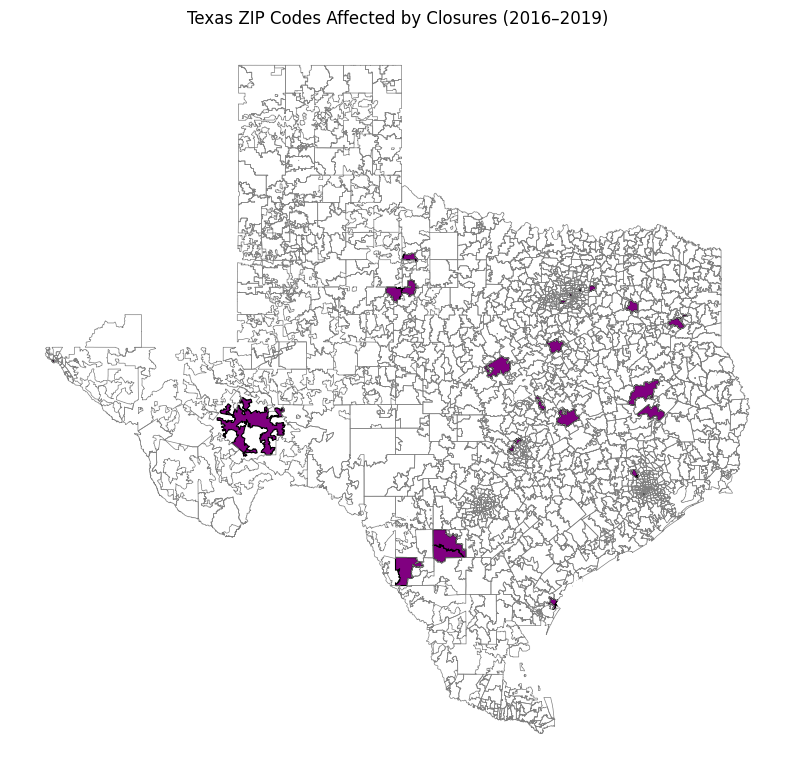

In [ ]:
# Convert ZIP_CD in closure_true_tx_df to strings, removing any decimals
closure_true_tx_df['ZIP_CD'] = closure_true_tx_df['ZIP_CD'].astype(int).astype(str)

# Convert ZCTA5 to string in census_tx for consistent comparison
census_tx['ZCTA5'] = census_tx['ZCTA5'].astype(str)

# Create the 'affected' column: 1 if in closure_true_tx_df['ZIP_CD'], otherwise 0
census_tx['affected'] = census_tx['ZCTA5'].isin(closure_true_tx_df['ZIP_CD']).astype(int)

# Step 3: Plot the choropleth of Texas ZIP codes with color only for affected areas
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# Plot affected areas in purple with borders
census_tx[census_tx['affected'] == 1].plot(color='purple', linewidth=0.8, edgecolor='black', ax=ax)

# Plot unaffected areas with no fill color, only borders
census_tx[census_tx['affected'] == 0].plot(color='none', edgecolor='grey', linewidth=0.5, ax=ax)

# Customize plot
ax.set_title("Texas ZIP Codes Affected by Closures (2016–2019)")
ax.set_axis_off()

plt.show()

In [ ]:
# Count the number of directly affected ZIP codes in Texas
num_directly_affected_zips = census_tx[census_tx['affected'] == 1]['ZCTA5'].nunique()
print("Number of directly affected ZIP codes in Texas:", num_directly_affected_zips)

Number of directly affected ZIP codes in Texas: 28


In [ ]:
print(census_tx.crs)

EPSG:4269


In [ ]:
census_tx = census_tx.to_crs(epsg=32614)
directly_affected_zips = census_tx[census_tx['affected'] == 1].copy()
directly_affected_zips['geometry'] = directly_affected_zips['geometry'].buffer(16093.4)
indirectly_affected_zips = gpd.sjoin(census_tx, directly_affected_zips[['geometry']], how='inner', predicate='intersects')
indirectly_affected_unique = indirectly_affected_zips[indirectly_affected_zips['affected'] == 0]['ZCTA5'].nunique()
print("Number of indirectly affected ZIP codes in Texas:", indirectly_affected_unique)

Number of indirectly affected ZIP codes in Texas: 527


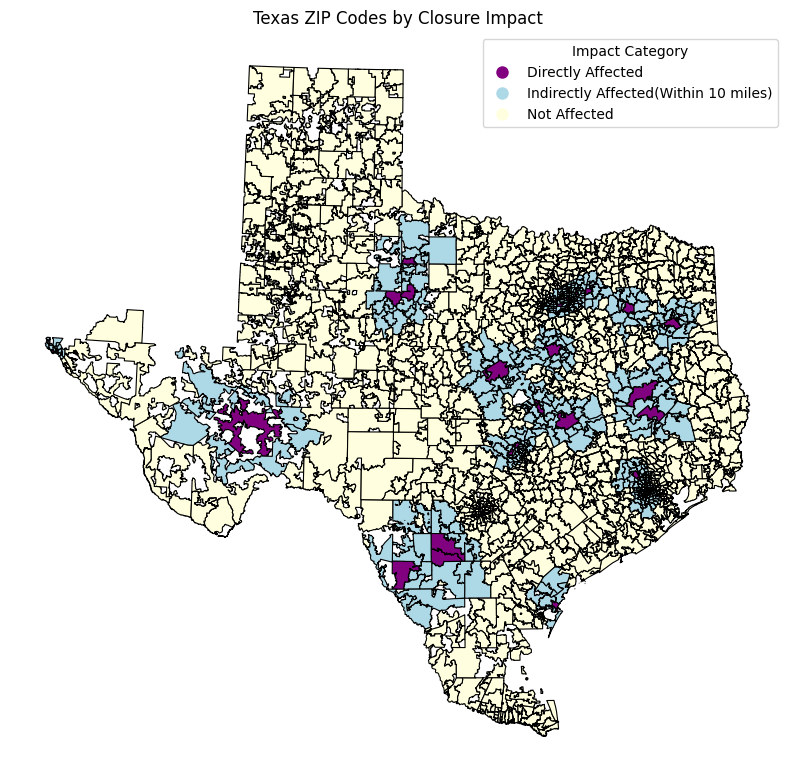

In [ ]:
# Mark directly affected ZIP codes
census_tx['category'] = 'Not Affected'

# Create 10-mile buffer and mark indirectly affected ZIP codes
census_tx.loc[indirectly_affected_zips.index, 'category'] = 'Indirectly Affected'

census_tx.loc[census_tx['affected'] == 1, 'category'] = 'Directly Affected'

# Define custom colors for the categories
category_colors = {'Directly Affected': 'purple', 'Indirectly Affected': 'lightblue', 'Not Affected': 'lightyellow'}
census_tx['color'] = census_tx['category'].map(category_colors)

# Plot the choropleth
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
census_tx.plot(color=census_tx['color'], linewidth=0.8, edgecolor='black', ax=ax)

# Add legend
handles = [
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='purple', markersize=10, label='Directly Affected'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='lightblue', markersize=10, label='Indirectly Affected(Within 10 miles)'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='lightyellow', markersize=10, label='Not Affected')
]
ax.legend(handles=handles, title="Impact Category")

ax.set_title("Texas ZIP Codes by Closure Impact")
ax.set_axis_off()

plt.show()

In [ ]:
active_short2016_df = df_short[(df_short['PGM_TRMNTN_CD'] == 0) & (df_short['YEAR'] == 2016)]
active_short2016 = active_short2016_df['PRVDR_NUM'].unique()

def find_closure_csm(active_short2016, df_short):
  closure_csm = []

  for csm in active_short2016:
    # Flag to stop searching once added to closure_csm
    added_to_closure = False

    # Retrieve 2016 ZIP code and facility name for fallback use
    info_2016 = df_short[(df_short['PRVDR_NUM'] == csm) & (df_short['YEAR'] == 2016)]
    zip_2016 = info_2016['ZIP_CD'].iloc[0] if not info_2016.empty else None
    fac_name_2016 = info_2016['FAC_NAME'].iloc[0] if not info_2016.empty else None

    for year in [2017,2018,2019]:
      year_check = df_short[(df_short['YEAR']==year)&(df_short['PRVDR_NUM']==csm)]

      # Check conditions:
      # 1. If the provider exists and PGM_TRMNTN_CD is not 0, add to closure_csm
      # 2. If the provider does not exist for this year, also add to closure_csm
      if not year_check.empty and (year_check['PGM_TRMNTN_CD'].iloc[0]!=0):
        closure_csm.append({
          'PRVDR_NUM':csm,
          'YEAR_CLO':year,
          'ZIP_CD':year_check['ZIP_CD'].values[0],
          'FAC_NAME':year_check['FAC_NAME'].values[0]
        })
        added_to_closure = False
        break

      elif year_check.empty:
        closure_csm.append({
            'PRVDR_NUM': csm,
            'YEAR_CLO': year,
            'ZIP_CD': zip_2016,
            'FAC_NAME': fac_name_2016
        })
        added_to_closure = True
        break

      if added_to_closure:
        continue

  return closure_csm

closure_csm = find_closure_csm(active_short2016, df_short)
print(f"There are {len(closure_csm)} hospitals suspected to close.")

There are 174 hospitals suspected to close.


In [ ]:
texas_hospitals_2016 = active_short2016_df[
    active_short2016_df['ZIP_CD'].astype(str).str[:3].isin(texas_zip_prefixes)
]

# Count the number of hospitals per zip code in Texas for 2016
hospital_counts = texas_hospitals_2016.groupby('ZIP_CD').size().reset_index(name='num_hospitals')

# Load a shapefile of Texas zip code areas for mapping (ensure the path is correct for your setup)
zip_code_shapefile = "path/to/texas_zip_shapefile.shp"
texas_zip_gdf = gpd.read_file(zip_code_shapefile)

# Merge the hospital counts with the Texas zip code shapefile data
texas_zip_hospitals = texas_zip_gdf.merge(hospital_counts, left_on='ZIPCODE', right_on='ZIP_CD', how='left')
texas_zip_hospitals['num_hospitals'] = texas_zip_hospitals['num_hospitals'].fillna(0)

# Plot the choropleth map
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
texas_zip_hospitals.plot(column='num_hospitals', cmap='OrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)
ax.set_title('Number of Hospitals per Zip Code in Texas (2016)', fontsize=15)
plt.axis('off')
plt.show()

DataSourceError: path/to/texas_zip_shapefile.shp: No such file or directory

In [ ]:
# Filter active_short2016_df for Texas zip codes in 2016 using prefixes
texas_hospitals_2016 = active_short2016_df[
    active_short2016_df['ZIP_CD'].astype(str).str[:3].isin(texas_zip_prefixes)
]

# Count the number of hospitals per zip code in Texas for 2016
hospital_counts = texas_hospitals_2016.groupby('ZIP_CD').size().reset_index(name='num_hospitals')

# Merge the hospital counts with the Texas zip code shapefile data in census_tx
texas_zip_hospitals = census_tx.merge(hospital_counts, left_on='ZIPCODE', right_on='ZIP_CD', how='left')
texas_zip_hospitals['num_hospitals'] = texas_zip_hospitals['num_hospitals'].fillna(0)

# Plot the choropleth map
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
texas_zip_hospitals.plot(column='num_hospitals', cmap='OrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)
ax.set_title('Number of Hospitals per Zip Code in Texas (2016)', fontsize=15)
plt.axis('off')
plt.show()

KeyError: 'ZIPCODE'

In [ ]:
# Filter active_short2016_df for Texas zip codes in 2016 using prefixes
texas_hospitals_2016 = active_short2016_df[
    active_short2016_df['ZIP_CD'].astype(str).str[:3].isin(texas_zip_prefixes)
]

# Count the number of hospitals per zip code in Texas for 2016
hospital_counts = texas_hospitals_2016.groupby('ZIP_CD').size().reset_index(name='num_hospitals')

# Merge the hospital counts with the Texas zip code shapefile data in census_tx
texas_zip_hospitals = census_tx.merge(hospital_counts, left_on='ZCTA5', right_on='ZIP_CD', how='left')
texas_zip_hospitals['num_hospitals'] = texas_zip_hospitals['num_hospitals'].fillna(0)

# Plot the choropleth map
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
texas_zip_hospitals.plot(column='num_hospitals', cmap='OrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)
ax.set_title('Number of Hospitals per Zip Code in Texas (2016)', fontsize=15)
plt.axis('off')
plt.show()

ValueError: You are trying to merge on object and float64 columns for key 'ZCTA5'. If you wish to proceed you should use pd.concat

In [ ]:
census_tx['ZCTA5'].type

AttributeError: 'Series' object has no attribute 'type'

In [ ]:
type(census_tx['ZCTA5'])

pandas.core.series.Series

In [ ]:
type(census_tx['ZCTA5'][0])

KeyError: 0

In [ ]:
type(census_tx['ZCTA5'][:0])

pandas.core.series.Series

In [ ]:
type(ctive_short2016_df['ZIP_CD'])

NameError: name 'ctive_short2016_df' is not defined

In [ ]:
type(active_short2016_df['ZIP_CD'])

pandas.core.series.Series

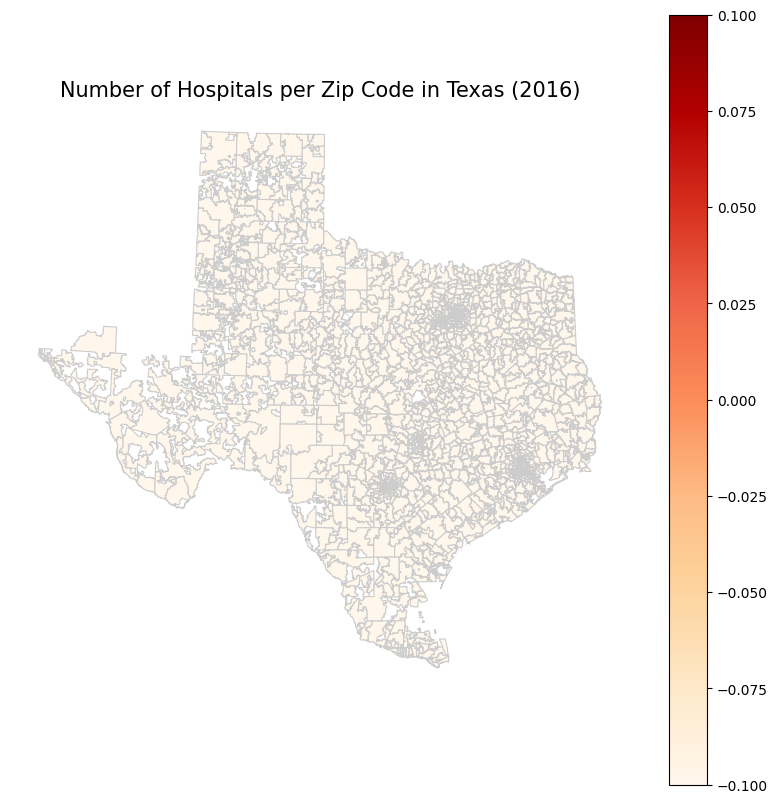

In [ ]:
# Filter active_short2016_df for Texas zip codes in 2016 using prefixes
texas_hospitals_2016 = active_short2016_df[
    active_short2016_df['ZIP_CD'].astype(str).str[:3].isin(texas_zip_prefixes)
]

# Count the number of hospitals per zip code in Texas for 2016
hospital_counts = texas_hospitals_2016.groupby('ZIP_CD').size().reset_index(name='num_hospitals')

hospital_counts['ZIP_CD'] = hospital_counts['ZIP_CD'].astype(str)

# Merge the hospital counts with the Texas zip code shapefile data in census_tx
texas_zip_hospitals = census_tx.merge(hospital_counts, left_on='ZCTA5', right_on='ZIP_CD', how='left')
texas_zip_hospitals['num_hospitals'] = texas_zip_hospitals['num_hospitals'].fillna(0)

# Plot the choropleth map
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
texas_zip_hospitals.plot(column='num_hospitals', cmap='OrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)
ax.set_title('Number of Hospitals per Zip Code in Texas (2016)', fontsize=15)
plt.axis('off')
plt.show()

In [ ]:
hospital_counts

,ZIP_CD,num_hospitals
0,733.0,2
1,780.0,1
2,785.0,2
3,791.0,2
4,792.0,1
...,...,...
273,79761.0,3
274,79902.0,4
275,79905.0,1
276,79936.0,1


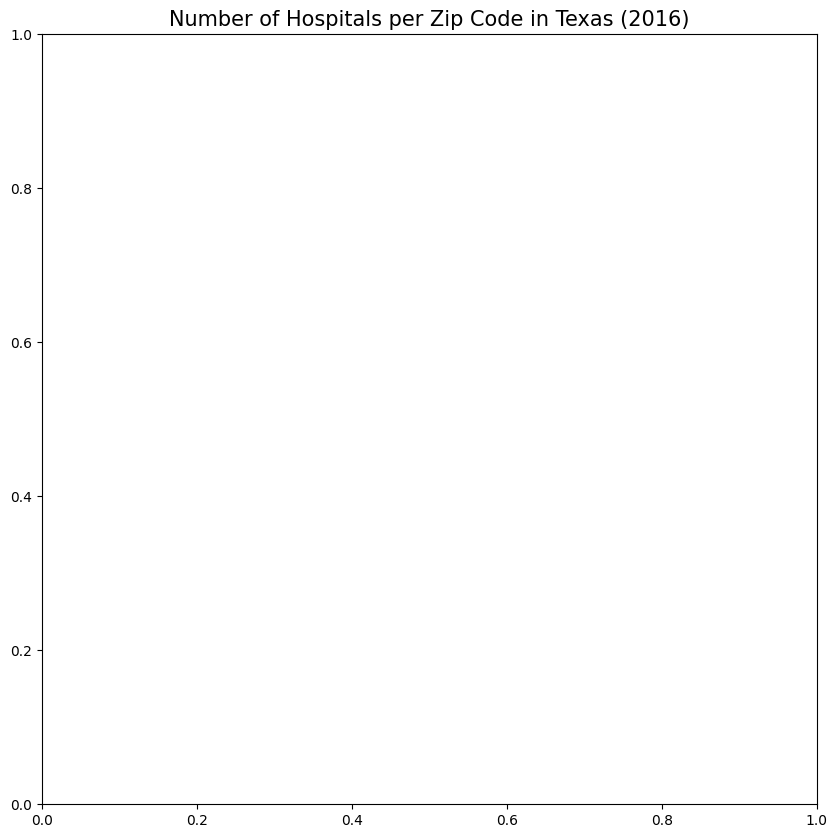

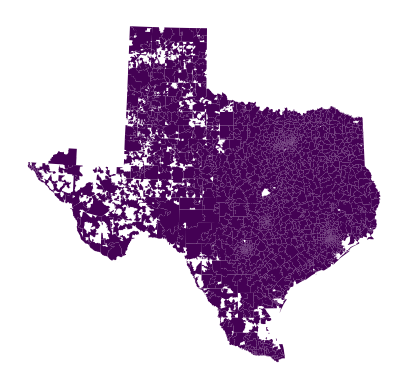

In [ ]:
# Filter active_short2016_df for Texas zip codes in 2016 using prefixes
texas_hospitals_2016 = active_short2016_df[
    active_short2016_df['ZIP_CD'].astype(str).str[:3].isin(texas_zip_prefixes)
]

# Count the number of hospitals per zip code in Texas for 2016
hospital_counts = texas_hospitals_2016.groupby('ZIP_CD').size().reset_index(name='num_hospitals')

hospital_counts['ZIP_CD'] = hospital_counts['ZIP_CD'].astype(str)

# Merge the hospital counts with the Texas zip code shapefile data in census_tx
texas_zip_hospitals = census_tx.merge(hospital_counts, left_on='ZCTA5', right_on='ZIP_CD', how='left')
texas_zip_hospitals['num_hospitals'] = texas_zip_hospitals['num_hospitals'].fillna(0)

# Plot the choropleth map
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
texas_zip_hospitals.plot(column='num_hospitals')
ax.set_title('Number of Hospitals per Zip Code in Texas (2016)', fontsize=15)
plt.axis('off')
plt.show()

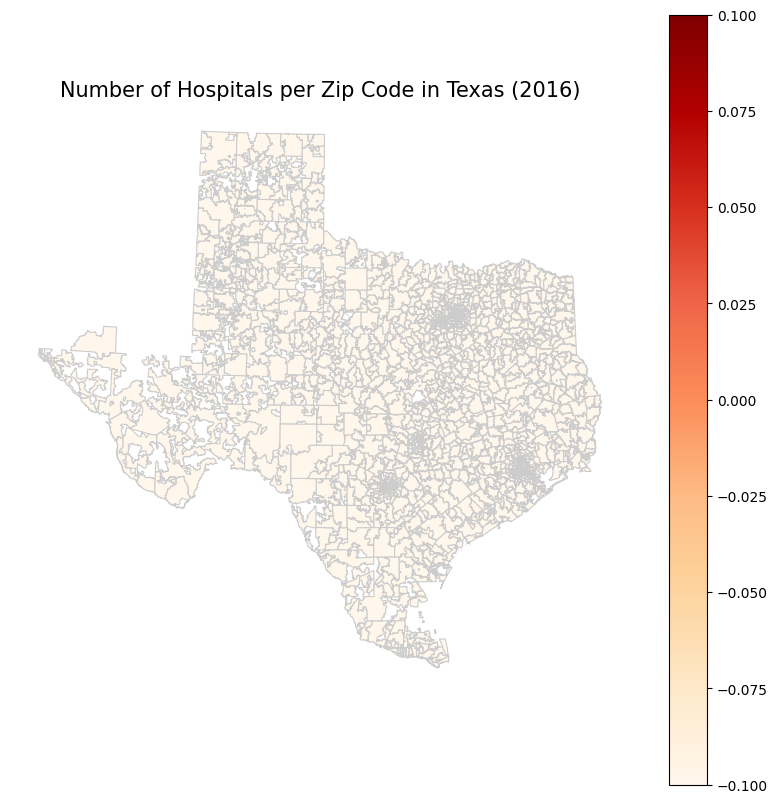

In [ ]:
# Filter active_short2016_df for Texas zip codes in 2016 using prefixes
texas_hospitals_2016 = active_short2016_df[
    active_short2016_df['ZIP_CD'].astype(str).str[:3].isin(texas_zip_prefixes)
]

# Count the number of hospitals per zip code in Texas for 2016
hospital_counts = texas_hospitals_2016.groupby('ZIP_CD').size().reset_index(name='num_hospitals')

hospital_counts['ZIP_CD'] = hospital_counts['ZIP_CD'].astype(str)

# Merge the hospital counts with the Texas zip code shapefile data in census_tx
texas_zip_hospitals = census_tx.merge(hospital_counts, left_on='ZCTA5', right_on='ZIP_CD', how='left')
texas_zip_hospitals['num_hospitals'] = texas_zip_hospitals['num_hospitals'].fillna(0)

# Plot the choropleth map
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
texas_zip_hospitals.plot(column='num_hospitals', cmap='OrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)
ax.set_title('Number of Hospitals per Zip Code in Texas (2016)', fontsize=15)
plt.axis('off')
plt.show()

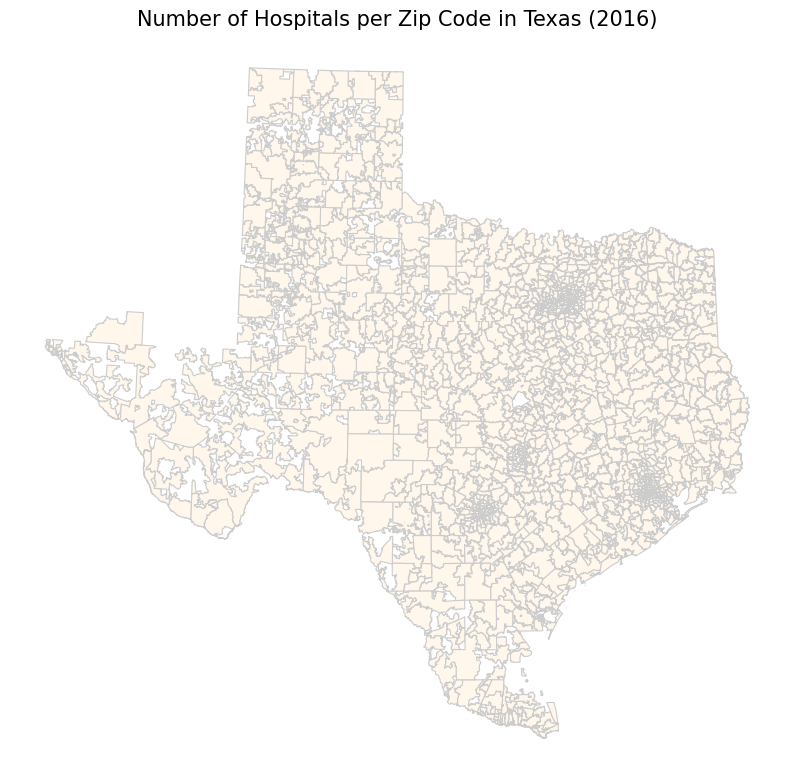

In [ ]:
# Filter active_short2016_df for Texas zip codes in 2016 using prefixes
texas_hospitals_2016 = active_short2016_df[
    active_short2016_df['ZIP_CD'].astype(str).str[:3].isin(texas_zip_prefixes)
]

# Count the number of hospitals per zip code in Texas for 2016
hospital_counts = texas_hospitals_2016.groupby('ZIP_CD').size().reset_index(name='num_hospitals')

hospital_counts['ZIP_CD'] = hospital_counts['ZIP_CD'].astype(str)

# Merge the hospital counts with the Texas zip code shapefile data in census_tx
texas_zip_hospitals = census_tx.merge(hospital_counts, left_on='ZCTA5', right_on='ZIP_CD', how='left')
texas_zip_hospitals['num_hospitals'] = texas_zip_hospitals['num_hospitals'].fillna(0)

# Plot the choropleth map
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
texas_zip_hospitals.plot(column='num_hospitals', cmap='OrRd', linewidth=0.8, ax=ax, edgecolor='0.8')
ax.set_title('Number of Hospitals per Zip Code in Texas (2016)', fontsize=15)
plt.axis('off')
plt.show()

ImportError: The 'mapclassify' package (>= 2.4.0) is required to use the 'scheme' keyword.

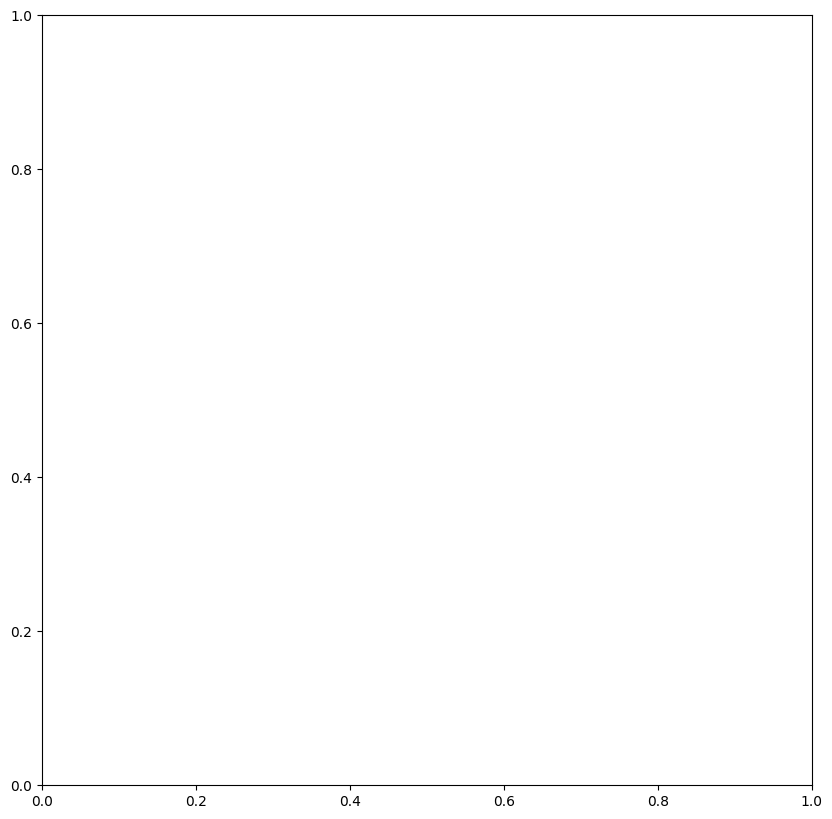

In [ ]:
# Filter active_short2016_df for Texas zip codes in 2016 using prefixes
texas_hospitals_2016 = active_short2016_df[
    active_short2016_df['ZIP_CD'].astype(str).str[:3].isin(texas_zip_prefixes)
]

# Count the number of hospitals per zip code in Texas for 2016
hospital_counts = texas_hospitals_2016.groupby('ZIP_CD').size().reset_index(name='num_hospitals')

hospital_counts['ZIP_CD'] = hospital_counts['ZIP_CD'].astype(str)

# Merge the hospital counts with the Texas zip code shapefile data in census_tx
texas_zip_hospitals = census_tx.merge(hospital_counts, left_on='ZCTA5', right_on='ZIP_CD', how='left')
texas_zip_hospitals['num_hospitals'] = texas_zip_hospitals['num_hospitals'].fillna(0)

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
choropleth = texas_zip_hospitals.plot(
    column='num_hospitals',
    cmap='OrRd',
    linewidth=0.8,
    ax=ax,
    edgecolor='0.8',
    legend=True,
    scheme="quantiles"
)

# Adjust the legend to display integers
legend = choropleth.get_legend()
legend.set_bbox_to_anchor((1, 0.5))
legend.set_title("Number of Hospitals")
for text in legend.get_texts():
    try:
        # Convert float label to integer for cleaner display
        text.set_text(str(int(float(text.get_text()))))
    except ValueError:
        pass  # Skip non-numeric labels

ax.set_title('Number of Hospitals per Zip Code in Texas (2016)', fontsize=15)
plt.axis('off')
plt.show()

ImportError: The 'mapclassify' package (>= 2.4.0) is required to use the 'scheme' keyword.

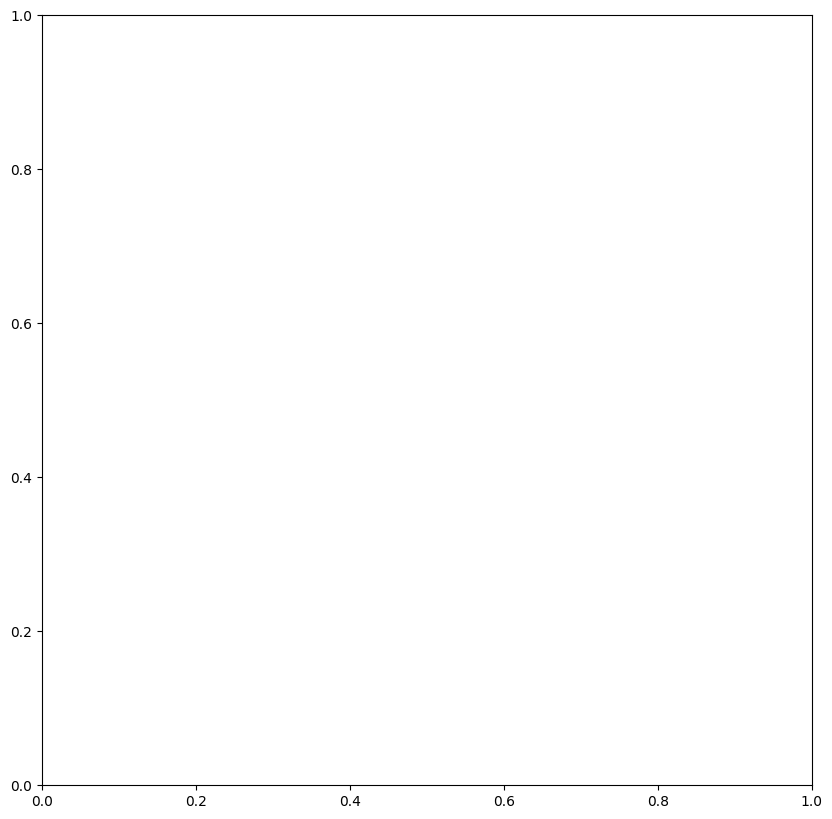

In [ ]:
# Filter active_short2016_df for Texas zip codes in 2016 using prefixes
texas_hospitals_2016 = active_short2016_df[
    active_short2016_df['ZIP_CD'].astype(str).str[:3].isin(texas_zip_prefixes)
]

# Count the number of hospitals per zip code in Texas for 2016
hospital_counts = texas_hospitals_2016.groupby('ZIP_CD').size().reset_index(name='num_hospitals')

hospital_counts['ZIP_CD'] = hospital_counts['ZIP_CD'].astype(str)

# Merge the hospital counts with the Texas zip code shapefile data in census_tx
texas_zip_hospitals = census_tx.merge(hospital_counts, left_on='ZCTA5', right_on='ZIP_CD', how='left')
texas_zip_hospitals['num_hospitals'] = texas_zip_hospitals['num_hospitals'].fillna(0)

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
choropleth = texas_zip_hospitals.plot(
    column='num_hospitals',
    cmap='OrRd',
    linewidth=0.8,
    ax=ax,
    edgecolor='0.8',
    legend=True,
    scheme="quantiles"
)

# Adjust the legend to display integers
legend = choropleth.get_legend()
legend.set_bbox_to_anchor((1, 0.5))
legend.set_title("Number of Hospitals")
plt.axis('off')
plt.show()

In [ ]:
texas_zip_hospitals

,GEO_ID,ZCTA5,NAME,LSAD,CENSUSAREA,geometry,affected,category,color,ZIP_CD,num_hospitals
0,8600000US78624,78624,78624,ZCTA5,708.041,"POLYGON ((503432.37 3374023.84, 503439.279 337...",0,Not Affected,lightyellow,NaN,0.0
1,8600000US78626,78626,78626,ZCTA5,93.046,"POLYGON ((633347.155 3382976.525, 632638.265 3...",0,Indirectly Affected,lightblue,NaN,0.0
2,8600000US78628,78628,78628,ZCTA5,73.382,"POLYGON ((625348.227 3382811.117, 625348.353 3...",0,Indirectly Affected,lightblue,NaN,0.0
3,8600000US78631,78631,78631,ZCTA5,325.074,"POLYGON ((487456.881 3359299.162, 487445.337 3...",0,Not Affected,lightyellow,NaN,0.0
4,8600000US78632,78632,78632,ZCTA5,96.278,"POLYGON ((653782.474 3293172.762, 653782.628 3...",0,Not Affected,lightyellow,NaN,0.0
...,...,...,...,...,...,...,...,...,...,...,...
1930,8600000US78261,78261,78261,ZCTA5,29.865,"POLYGON ((553805.529 3287826.749, 553811.843 3...",0,Not Affected,lightyellow,NaN,0.0
1931,8600000US78368,78368,78368,ZCTA5,216.341,"POLYGON ((612502.194 3126391.601, 612649.761 3...",0,Not Affected,lightyellow,NaN,0.0
1932,8600000US78412,78412,78412,ZCTA5,8.798,"POLYGON ((666800.553 3066210.622, 666799.892 3...",0,Not Affected,lightyellow,NaN,0.0
1933,8600000US78557,78557,78557,ZCTA5,11.653,"POLYGON ((579522.631 2883281.694, 579515.799 2...",0,Not Affected,lightyellow,NaN,0.0


In [ ]:
texas_zip_hospitals

,GEO_ID,ZCTA5,NAME,LSAD,CENSUSAREA,geometry,affected,category,color,ZIP_CD,num_hospitals
0,8600000US78624,78624,78624,ZCTA5,708.041,"POLYGON ((503432.37 3374023.84, 503439.279 337...",0,Not Affected,lightyellow,NaN,0.0
1,8600000US78626,78626,78626,ZCTA5,93.046,"POLYGON ((633347.155 3382976.525, 632638.265 3...",0,Indirectly Affected,lightblue,NaN,0.0
2,8600000US78628,78628,78628,ZCTA5,73.382,"POLYGON ((625348.227 3382811.117, 625348.353 3...",0,Indirectly Affected,lightblue,NaN,0.0
3,8600000US78631,78631,78631,ZCTA5,325.074,"POLYGON ((487456.881 3359299.162, 487445.337 3...",0,Not Affected,lightyellow,NaN,0.0
4,8600000US78632,78632,78632,ZCTA5,96.278,"POLYGON ((653782.474 3293172.762, 653782.628 3...",0,Not Affected,lightyellow,NaN,0.0
...,...,...,...,...,...,...,...,...,...,...,...
1930,8600000US78261,78261,78261,ZCTA5,29.865,"POLYGON ((553805.529 3287826.749, 553811.843 3...",0,Not Affected,lightyellow,NaN,0.0
1931,8600000US78368,78368,78368,ZCTA5,216.341,"POLYGON ((612502.194 3126391.601, 612649.761 3...",0,Not Affected,lightyellow,NaN,0.0
1932,8600000US78412,78412,78412,ZCTA5,8.798,"POLYGON ((666800.553 3066210.622, 666799.892 3...",0,Not Affected,lightyellow,NaN,0.0
1933,8600000US78557,78557,78557,ZCTA5,11.653,"POLYGON ((579522.631 2883281.694, 579515.799 2...",0,Not Affected,lightyellow,NaN,0.0


In [ ]:
# Filter active_short2016_df for Texas zip codes in 2016 using prefixes
texas_hospitals_2016 = active_short2016_df[
    active_short2016_df['ZIP_CD'].astype(str).str[:3].isin(texas_zip_prefixes)
]

# Count the number of hospitals per zip code in Texas for 2016
hospital_counts = texas_hospitals_2016.groupby('ZIP_CD').size().reset_index(name='num_hospitals')

hospital_counts['ZIP_CD'] = hospital_counts['ZIP_CD'].astype(str)

# Merge the hospital counts with the Texas zip code shapefile data in census_tx
texas_zip_hospitals = census_tx.merge(hospital_counts, left_on='ZCTA5', right_on='ZIP_CD', how='left')
texas_zip_hospitals['num_hospitals'] = texas_zip_hospitals['num_hospitals'].fillna(0)

In [ ]:
texas_zip_hospitals

,GEO_ID,ZCTA5,NAME,LSAD,CENSUSAREA,geometry,affected,category,color,ZIP_CD,num_hospitals
0,8600000US78624,78624,78624,ZCTA5,708.041,"POLYGON ((503432.37 3374023.84, 503439.279 337...",0,Not Affected,lightyellow,NaN,0.0
1,8600000US78626,78626,78626,ZCTA5,93.046,"POLYGON ((633347.155 3382976.525, 632638.265 3...",0,Indirectly Affected,lightblue,NaN,0.0
2,8600000US78628,78628,78628,ZCTA5,73.382,"POLYGON ((625348.227 3382811.117, 625348.353 3...",0,Indirectly Affected,lightblue,NaN,0.0
3,8600000US78631,78631,78631,ZCTA5,325.074,"POLYGON ((487456.881 3359299.162, 487445.337 3...",0,Not Affected,lightyellow,NaN,0.0
4,8600000US78632,78632,78632,ZCTA5,96.278,"POLYGON ((653782.474 3293172.762, 653782.628 3...",0,Not Affected,lightyellow,NaN,0.0
...,...,...,...,...,...,...,...,...,...,...,...
1930,8600000US78261,78261,78261,ZCTA5,29.865,"POLYGON ((553805.529 3287826.749, 553811.843 3...",0,Not Affected,lightyellow,NaN,0.0
1931,8600000US78368,78368,78368,ZCTA5,216.341,"POLYGON ((612502.194 3126391.601, 612649.761 3...",0,Not Affected,lightyellow,NaN,0.0
1932,8600000US78412,78412,78412,ZCTA5,8.798,"POLYGON ((666800.553 3066210.622, 666799.892 3...",0,Not Affected,lightyellow,NaN,0.0
1933,8600000US78557,78557,78557,ZCTA5,11.653,"POLYGON ((579522.631 2883281.694, 579515.799 2...",0,Not Affected,lightyellow,NaN,0.0


In [ ]:
hospital_counts

,ZIP_CD,num_hospitals
0,733.0,2
1,780.0,1
2,785.0,2
3,791.0,2
4,792.0,1
...,...,...
273,79761.0,3
274,79902.0,4
275,79905.0,1
276,79936.0,1


In [ ]:
active_short2016_df

,PRVDR_CTGRY_SBTYP_CD,PRVDR_CTGRY_CD,CITY_NAME,SSA_CNTY_CD,PRVDR_NUM,STATE_CD,SSA_STATE_CD,TRMNTN_EXPRTN_DT,ZIP_CD,GNRL_FAC_TYPE_CD,PSYCH_UNIT_TRMNTN_CD,FAC_NAME,PGM_TRMNTN_CD,YEAR
0,1.0,1.0,DOTHAN,340.0,10001.0,AL,1.0,NaN,36301.0,1.0,1.0,SOUTHEAST ALABAMA MEDICAL CENTER,0,2016
2,1.0,1.0,BOAZ,470.0,10005.0,AL,1.0,NaN,35957.0,1.0,NaN,MARSHALL MEDICAL CENTER SOUTH,0,2016
3,1.0,1.0,FLORENCE,380.0,10006.0,AL,1.0,NaN,35631.0,1.0,NaN,ELIZA COFFEE MEMORIAL HOSPITAL,0,2016
4,1.0,1.0,OPP,190.0,10007.0,AL,1.0,NaN,36467.0,1.0,0.0,MIZELL MEMORIAL HOSPITAL,0,2016
5,1.0,1.0,LUVERNE,200.0,10008.0,AL,1.0,NaN,36049.0,1.0,0.0,CRENSHAW COMMUNITY HOSPITAL,0,2016
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7240,1.0,1.0,WEIMAR,312.0,670114.0,TX,45.0,NaN,78962.0,1.0,NaN,WEIMAR MEDICAL CENTER,0,2016
7241,1.0,1.0,CLEVELAND,757.0,670115.0,TX,45.0,NaN,77327.0,1.0,NaN,CLEVELAND EMERGENCY HOSPTIAL,0,2016
7242,1.0,1.0,FORT WORTH,910.0,670116.0,TX,45.0,NaN,76177.0,1.0,NaN,WISE HEALTH SYSTEM,0,2016
7243,1.0,1.0,GRAND SALINE,947.0,670117.0,TX,45.0,NaN,75140.0,1.0,NaN,TEXAS GENERAL HOSPITAL- VZRMC LP,0,2016


In [ ]:
# Filter active_short2016_df for Texas zip codes in 2016 using prefixes
active_short2016_df['ZIP_CD'] = active_short2016_df['ZIP_CD'].astype(str)
texas_hospitals_2016 = active_short2016_df[
    active_short2016_df['ZIP_CD'].astype(str).str[:3].isin(texas_zip_prefixes)
]

# Count the number of hospitals per zip code in Texas for 2016
hospital_counts = texas_hospitals_2016.groupby('ZIP_CD').size().reset_index(name='num_hospitals')


# Merge the hospital counts with the Texas zip code shapefile data in census_tx
texas_zip_hospitals = census_tx.merge(hospital_counts, left_on='ZCTA5', right_on='ZIP_CD', how='left')
texas_zip_hospitals['num_hospitals'] = texas_zip_hospitals['num_hospitals'].fillna(0)

In [ ]:
exas_zip_hospitals

NameError: name 'exas_zip_hospitals' is not defined

In [ ]:
texas_zip_hospitals

,GEO_ID,ZCTA5,NAME,LSAD,CENSUSAREA,geometry,affected,category,color,ZIP_CD,num_hospitals
0,8600000US78624,78624,78624,ZCTA5,708.041,"POLYGON ((503432.37 3374023.84, 503439.279 337...",0,Not Affected,lightyellow,NaN,0.0
1,8600000US78626,78626,78626,ZCTA5,93.046,"POLYGON ((633347.155 3382976.525, 632638.265 3...",0,Indirectly Affected,lightblue,NaN,0.0
2,8600000US78628,78628,78628,ZCTA5,73.382,"POLYGON ((625348.227 3382811.117, 625348.353 3...",0,Indirectly Affected,lightblue,NaN,0.0
3,8600000US78631,78631,78631,ZCTA5,325.074,"POLYGON ((487456.881 3359299.162, 487445.337 3...",0,Not Affected,lightyellow,NaN,0.0
4,8600000US78632,78632,78632,ZCTA5,96.278,"POLYGON ((653782.474 3293172.762, 653782.628 3...",0,Not Affected,lightyellow,NaN,0.0
...,...,...,...,...,...,...,...,...,...,...,...
1930,8600000US78261,78261,78261,ZCTA5,29.865,"POLYGON ((553805.529 3287826.749, 553811.843 3...",0,Not Affected,lightyellow,NaN,0.0
1931,8600000US78368,78368,78368,ZCTA5,216.341,"POLYGON ((612502.194 3126391.601, 612649.761 3...",0,Not Affected,lightyellow,NaN,0.0
1932,8600000US78412,78412,78412,ZCTA5,8.798,"POLYGON ((666800.553 3066210.622, 666799.892 3...",0,Not Affected,lightyellow,NaN,0.0
1933,8600000US78557,78557,78557,ZCTA5,11.653,"POLYGON ((579522.631 2883281.694, 579515.799 2...",0,Not Affected,lightyellow,NaN,0.0


In [ ]:
hospital_counts

,ZIP_CD,num_hospitals
0,733.0,2
1,75001.0,1
2,75010.0,1
3,75013.0,1
4,75020.0,1
...,...,...
273,79761.0,3
274,79902.0,4
275,79905.0,1
276,79936.0,1


In [ ]:
texas_zip_prefixes

['750',
 '751',
 '752',
 '753',
 '754',
 '755',
 '756',
 '757',
 '758',
 '759',
 '760',
 '761',
 '762',
 '763',
 '764',
 '765',
 '766',
 '767',
 '768',
 '769',
 '770',
 '771',
 '772',
 '773',
 '774',
 '775',
 '776',
 '777',
 '778',
 '779',
 '780',
 '781',
 '782',
 '783',
 '784',
 '785',
 '786',
 '787',
 '788',
 '789',
 '790',
 '791',
 '792',
 '793',
 '794',
 '795',
 '796',
 '797',
 '798',
 '799',
 '733',
 '885']

In [ ]:
texas_hospitals_2016

,PRVDR_CTGRY_SBTYP_CD,PRVDR_CTGRY_CD,CITY_NAME,SSA_CNTY_CD,PRVDR_NUM,STATE_CD,SSA_STATE_CD,TRMNTN_EXPRTN_DT,ZIP_CD,GNRL_FAC_TYPE_CD,PSYCH_UNIT_TRMNTN_CD,FAC_NAME,PGM_TRMNTN_CD,YEAR
4023,1.0,1.0,HACKENSACK,100.0,310001.0,NJ,31.0,NaN,7601.0,1.0,0.0,HACKENSACK UNIVERSITY MEDICAL CENTER,0,2016
4028,1.0,1.0,TEANECK,100.0,310008.0,NJ,31.0,NaN,7666.0,1.0,0.0,HOLY NAME MEDICAL CENTER,0,2016
4035,1.0,1.0,MORRISTOWN,300.0,310015.0,NJ,31.0,NaN,7962.0,1.0,0.0,MORRISTOWN MEDICAL CENTER,0,2016
4039,1.0,1.0,PATERSON,320.0,310019.0,NJ,31.0,NaN,7503.0,1.0,NaN,ST JOSEPH'S REGIONAL MEDICAL CENTER,0,2016
4047,1.0,1.0,NEWTON,360.0,310028.0,NJ,31.0,NaN,7860.0,1.0,0.0,NEWTON MEDICAL CENTER,0,2016
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7240,1.0,1.0,WEIMAR,312.0,670114.0,TX,45.0,NaN,78962.0,1.0,NaN,WEIMAR MEDICAL CENTER,0,2016
7241,1.0,1.0,CLEVELAND,757.0,670115.0,TX,45.0,NaN,77327.0,1.0,NaN,CLEVELAND EMERGENCY HOSPTIAL,0,2016
7242,1.0,1.0,FORT WORTH,910.0,670116.0,TX,45.0,NaN,76177.0,1.0,NaN,WISE HEALTH SYSTEM,0,2016
7243,1.0,1.0,GRAND SALINE,947.0,670117.0,TX,45.0,NaN,75140.0,1.0,NaN,TEXAS GENERAL HOSPITAL- VZRMC LP,0,2016


In [ ]:
# df closure lists
closure_df = pd.DataFrame(closure_csm)
closure_df['ZIP_CD'] = closure_df['ZIP_CD'].astype(str).str.zfill(5)
# 'df_active' : filter out active short-term hospitals
df_active = df_short[(df_short['PGM_TRMNTN_CD'] == 0) & df_short['ZIP_CD'].isin(closure_df['ZIP_CD'])]

# 'zip_year' : get the counts of active hospitals in each zip code and year
zip_year = df_active.groupby(['ZIP_CD', 'YEAR']).size().reset_index(name='active')
zip_year = zip_year[['ZIP_CD', 'YEAR', 'active']]

closure_counts = closure_df[['ZIP_CD', 'YEAR_CLO', 'PRVDR_NUM']]

closure_counts = (
    closure_counts.groupby(['ZIP_CD', 'YEAR_CLO'])
    .agg(num_closure=('PRVDR_NUM', 'nunique'), PRVDR_NUM_list=('PRVDR_NUM', 'unique'))
    .reset_index()
)

# Rename 'YEAR_CLO' to 'YEAR' for consistency with zip_year
closure_counts = closure_counts.rename(columns={'YEAR_CLO': 'YEAR'})

# Merge closure_counts with zip_year on 'ZIP_CD' and 'YEAR'
zip_year = zip_year.merge(closure_counts, on=['ZIP_CD', 'YEAR'], how='left')

# Fill NaN values in 'num_closure' with 0 and convert to int
zip_year['num_closure'] = zip_year['num_closure'].fillna(0).astype(int)

# 'zip_year': contain num of closure, active, active last year for comparision in next step
zip_year['active_next_y'] = zip_year.groupby('ZIP_CD')['active'].shift(-1)

# 'zip_false_clo': filter for false closures where the number of active hospitals does not decrease in the following year
zip_false_clo = zip_year[
    (zip_year['num_closure'] != 0) &
    (zip_year['active'] <= zip_year['active_next_y'])
]

print(zip_false_clo.shape)
zip_false_clo

(0, 6)


,active,ZIP_CD,YEAR,num_closure,PRVDR_NUM_list,active_next_y


In [ ]:
# df closure lists
closure_df = pd.DataFrame(closure_csm)

# 'df_active' : filter out active short-term hospitals
df_active = df_short[(df_short['PGM_TRMNTN_CD'] == 0) & df_short['ZIP_CD'].isin(closure_df['ZIP_CD'])]

# 'zip_year' : get the counts of active hospitals in each zip code and year
zip_year = df_active.groupby(['ZIP_CD', 'YEAR']).size().reset_index(name='active')
zip_year = zip_year[['ZIP_CD', 'YEAR', 'active']]

closure_counts = closure_df[['ZIP_CD', 'YEAR_CLO', 'PRVDR_NUM']]

closure_counts = (
    closure_counts.groupby(['ZIP_CD', 'YEAR_CLO'])
    .agg(num_closure=('PRVDR_NUM', 'nunique'), PRVDR_NUM_list=('PRVDR_NUM', 'unique'))
    .reset_index()
)

# Rename 'YEAR_CLO' to 'YEAR' for consistency with zip_year
closure_counts = closure_counts.rename(columns={'YEAR_CLO': 'YEAR'})

# Merge closure_counts with zip_year on 'ZIP_CD' and 'YEAR'
zip_year = zip_year.merge(closure_counts, on=['ZIP_CD', 'YEAR'], how='left')

# Fill NaN values in 'num_closure' with 0 and convert to int
zip_year['num_closure'] = zip_year['num_closure'].fillna(0).astype(int)

# 'zip_year': contain num of closure, active, active last year for comparision in next step
zip_year['active_next_y'] = zip_year.groupby('ZIP_CD')['active'].shift(-1)

# 'zip_false_clo': filter for false closures where the number of active hospitals does not decrease in the following year
zip_false_clo = zip_year[
    (zip_year['num_closure'] != 0) &
    (zip_year['active'] <= zip_year['active_next_y'])
]

print(zip_false_clo.shape)
zip_false_clo

(27, 6)


,ZIP_CD,YEAR,active,num_closure,PRVDR_NUM_list,active_next_y
2,785.0,2017,1,1,[400009.0],1.0
6,928.0,2017,1,1,[400121.0],1.0
35,12208.0,2017,2,1,[330189.0],2.0
40,12601.0,2017,1,1,[330067.0],1.0
62,17901.0,2018,1,1,[390031.0],1.0
66,18017.0,2018,1,1,[390263.0],1.0
119,33407.0,2018,1,1,[100234.0],1.0
127,35611.0,2018,1,1,[10172.0],1.0
141,37404.0,2018,2,1,[440162.0],2.0
173,42003.0,2017,2,1,[180153.0],2.0


In [ ]:
# Sort the list by 'FAC_NAME'
closure_csm.sort(key=lambda x: x['FAC_NAME'])

# Print the first 10 items by 'FAC_NAME' and 'YEAR_CLO'
for entry in closure_csm[:10]:
    print(f"The facility named '{entry['FAC_NAME']}' was closed in {entry['YEAR_CLO']}.")

The facility named 'ABRAZO MARYVALE CAMPUS' was closed in 2017.
The facility named 'ADVENTIST MEDICAL CENTER - CENTRAL VALLEY' was closed in 2017.
The facility named 'AFFINITY MEDICAL CENTER' was closed in 2018.
The facility named 'ALBANY MEDICAL CENTER / SOUTH CLINICAL CAMPUS' was closed in 2017.
The facility named 'ALLEGIANCE SPECIALTY HOSPITAL OF KILGORE' was closed in 2017.
The facility named 'ALLIANCE LAIRD HOSPITAL' was closed in 2019.
The facility named 'ALLIANCEHEALTH DEACONESS' was closed in 2019.
The facility named 'ARKANSAS VALLEY REGIONAL MEDICAL CENTER' was closed in 2017.
The facility named 'ASCENSION NE WISCONSIN MERCY CAMPUS' was closed in 2018.
The facility named 'ATRIUM HEALTH KINGS MOUNTAIN' was closed in 2019.


In [ ]:
closure_csm

[{'PRVDR_NUM': 30001.0,
  'YEAR_CLO': 2017,
  'ZIP_CD': 85031.0,
  'FAC_NAME': 'ABRAZO MARYVALE CAMPUS'},
 {'PRVDR_NUM': 50196.0,
  'YEAR_CLO': 2017,
  'ZIP_CD': 93230.0,
  'FAC_NAME': 'ADVENTIST MEDICAL CENTER - CENTRAL VALLEY'},
 {'PRVDR_NUM': 360151.0,
  'YEAR_CLO': 2018,
  'ZIP_CD': 44646.0,
  'FAC_NAME': 'AFFINITY MEDICAL CENTER'},
 {'PRVDR_NUM': 330189.0,
  'YEAR_CLO': 2017,
  'ZIP_CD': 12208.0,
  'FAC_NAME': 'ALBANY MEDICAL CENTER / SOUTH CLINICAL CAMPUS'},
 {'PRVDR_NUM': 450488.0,
  'YEAR_CLO': 2017,
  'ZIP_CD': 75662.0,
  'FAC_NAME': 'ALLEGIANCE SPECIALTY HOSPITAL OF KILGORE'},
 {'PRVDR_NUM': 250159.0,
  'YEAR_CLO': 2019,
  'ZIP_CD': 39365.0,
  'FAC_NAME': 'ALLIANCE LAIRD HOSPITAL'},
 {'PRVDR_NUM': 370032.0,
  'YEAR_CLO': 2019,
  'ZIP_CD': 73112.0,
  'FAC_NAME': 'ALLIANCEHEALTH DEACONESS'},
 {'PRVDR_NUM': 60036.0,
  'YEAR_CLO': 2017,
  'ZIP_CD': 81050.0,
  'FAC_NAME': 'ARKANSAS VALLEY REGIONAL MEDICAL CENTER'},
 {'PRVDR_NUM': 520048.0,
  'YEAR_CLO': 2018,
  'ZIP_CD': 54904.0,


In [ ]:
# df closure lists
closure_df = pd.DataFrame(closure_csm)
closure_df['ZIP_CD'] = closure_df['ZIP_CD'].astype(str).str.split('.').str[0].str.zfill(5)

# 'df_active' : filter out active short-term hospitals
df_active = df_short[(df_short['PGM_TRMNTN_CD'] == 0) & df_short['ZIP_CD'].isin(closure_df['ZIP_CD'])]

# 'zip_year' : get the counts of active hospitals in each zip code and year
zip_year = df_active.groupby(['ZIP_CD', 'YEAR']).size().reset_index(name='active')
zip_year = zip_year[['ZIP_CD', 'YEAR', 'active']]

closure_counts = closure_df[['ZIP_CD', 'YEAR_CLO', 'PRVDR_NUM']]

closure_counts = (
    closure_counts.groupby(['ZIP_CD', 'YEAR_CLO'])
    .agg(num_closure=('PRVDR_NUM', 'nunique'), PRVDR_NUM_list=('PRVDR_NUM', 'unique'))
    .reset_index()
)

# Rename 'YEAR_CLO' to 'YEAR' for consistency with zip_year
closure_counts = closure_counts.rename(columns={'YEAR_CLO': 'YEAR'})

# Merge closure_counts with zip_year on 'ZIP_CD' and 'YEAR'
zip_year = zip_year.merge(closure_counts, on=['ZIP_CD', 'YEAR'], how='left')

# Fill NaN values in 'num_closure' with 0 and convert to int
zip_year['num_closure'] = zip_year['num_closure'].fillna(0).astype(int)

# 'zip_year': contain num of closure, active, active last year for comparision in next step
zip_year['active_next_y'] = zip_year.groupby('ZIP_CD')['active'].shift(-1)

# 'zip_false_clo': filter for false closures where the number of active hospitals does not decrease in the following year
zip_false_clo = zip_year[
    (zip_year['num_closure'] != 0) &
    (zip_year['active'] <= zip_year['active_next_y'])
]

print(zip_false_clo.shape)
zip_false_clo

(0, 6)


,active,ZIP_CD,YEAR,num_closure,PRVDR_NUM_list,active_next_y


In [ ]:
closure_df

,PRVDR_NUM,YEAR_CLO,ZIP_CD,FAC_NAME
0,30001.0,2017,85031,ABRAZO MARYVALE CAMPUS
1,50196.0,2017,93230,ADVENTIST MEDICAL CENTER - CENTRAL VALLEY
2,360151.0,2018,44646,AFFINITY MEDICAL CENTER
3,330189.0,2017,12208,ALBANY MEDICAL CENTER / SOUTH CLINICAL CAMPUS
4,450488.0,2017,75662,ALLEGIANCE SPECIALTY HOSPITAL OF KILGORE
...,...,...,...,...
169,670092.0,2017,75231,WALNUT HILL MEDICAL CENTER
170,100234.0,2018,33407,WEST PALM HOSPITAL
171,520204.0,2018,53132,WHEATON FRANCISCAN HEALTHCARE FRANKLIN
172,190236.0,2018,71111,WILLIS KNIGHTON BOSSIER HEALTH CENTER


In [ ]:
# append datset
df_short_pos2016['YEAR'] = 2016
df_short = pd.concat([df_short_pos2016] + list(data_frames.values()), ignore_index=True)
df_short['ZIP_CD'] = df_short['ZIP_CD'].astype(str).str
df_short.head(3)

TypeError: object of type 'StringMethods' has no len()

In [ ]:
# append datset
df_short_pos2016['YEAR'] = 2016
df_short = pd.concat([df_short_pos2016] + list(data_frames.values()), ignore_index=True)
df_short['ZIP_CD'] = df_short['ZIP_CD'].astype(str)
df_short.head(3)

,PRVDR_CTGRY_SBTYP_CD,PRVDR_CTGRY_CD,CITY_NAME,SSA_CNTY_CD,PRVDR_NUM,STATE_CD,SSA_STATE_CD,TRMNTN_EXPRTN_DT,ZIP_CD,GNRL_FAC_TYPE_CD,PSYCH_UNIT_TRMNTN_CD,FAC_NAME,PGM_TRMNTN_CD,YEAR
0,1.0,1.0,DOTHAN,340.0,10001.0,AL,1.0,NaN,36301.0,1.0,1.0,SOUTHEAST ALABAMA MEDICAL CENTER,0,2016
1,1.0,1.0,BRIDGEPORT,350.0,10004.0,AL,1.0,20010831.0,35740.0,1.0,NaN,NORTH JACKSON HOSPITAL,1,2016
2,1.0,1.0,BOAZ,470.0,10005.0,AL,1.0,NaN,35957.0,1.0,NaN,MARSHALL MEDICAL CENTER SOUTH,0,2016


In [ ]:
# append datset
df_short_pos2016['YEAR'] = 2016
df_short = pd.concat([df_short_pos2016] + list(data_frames.values()), ignore_index=True)
df_short['ZIP_CD'] = df_short['ZIP_CD'].astype(str).str.zfill(5)
df_short.head(3)

,PRVDR_CTGRY_SBTYP_CD,PRVDR_CTGRY_CD,CITY_NAME,SSA_CNTY_CD,PRVDR_NUM,STATE_CD,SSA_STATE_CD,TRMNTN_EXPRTN_DT,ZIP_CD,GNRL_FAC_TYPE_CD,PSYCH_UNIT_TRMNTN_CD,FAC_NAME,PGM_TRMNTN_CD,YEAR
0,1.0,1.0,DOTHAN,340.0,10001.0,AL,1.0,NaN,36301.0,1.0,1.0,SOUTHEAST ALABAMA MEDICAL CENTER,0,2016
1,1.0,1.0,BRIDGEPORT,350.0,10004.0,AL,1.0,20010831.0,35740.0,1.0,NaN,NORTH JACKSON HOSPITAL,1,2016
2,1.0,1.0,BOAZ,470.0,10005.0,AL,1.0,NaN,35957.0,1.0,NaN,MARSHALL MEDICAL CENTER SOUTH,0,2016


In [ ]:
# append datset
df_short_pos2016['YEAR'] = 2016
df_short = pd.concat([df_short_pos2016] + list(data_frames.values()), ignore_index=True)
df_short['ZIP_CD'] = df_short['ZIP_CD'].astype(int).astype(str).str.zfill(5)
df_short.head(3)

,PRVDR_CTGRY_SBTYP_CD,PRVDR_CTGRY_CD,CITY_NAME,SSA_CNTY_CD,PRVDR_NUM,STATE_CD,SSA_STATE_CD,TRMNTN_EXPRTN_DT,ZIP_CD,GNRL_FAC_TYPE_CD,PSYCH_UNIT_TRMNTN_CD,FAC_NAME,PGM_TRMNTN_CD,YEAR
0,1.0,1.0,DOTHAN,340.0,10001.0,AL,1.0,NaN,36301,1.0,1.0,SOUTHEAST ALABAMA MEDICAL CENTER,0,2016
1,1.0,1.0,BRIDGEPORT,350.0,10004.0,AL,1.0,20010831.0,35740,1.0,NaN,NORTH JACKSON HOSPITAL,1,2016
2,1.0,1.0,BOAZ,470.0,10005.0,AL,1.0,NaN,35957,1.0,NaN,MARSHALL MEDICAL CENTER SOUTH,0,2016


In [ ]:
obs_year = df_short.groupby('YEAR')['PRVDR_NUM'].count().reset_index()
obs_year.rename(columns={'PRVDR_NUM':'NUM_HOS'},inplace=True)

bar_obs = alt.Chart(obs_year).mark_bar(color='#9966CC').encode(
  x = alt.X('YEAR:O',title='Year'),
  y = alt.Y('NUM_HOS:Q',title='Count of Observations'),
  tooltip=['YEAR','NUM_HOS']
)

text_obs = bar_obs.mark_text(
    align='center',
    baseline='bottom',
    dy=-5
).encode(
    text='NUM_HOS:Q'
)
chart_obs = (bar_obs+text_obs).properties(
  title = 'Plot 1:Numbers of Short-term Hospitals by Year',
  width='container',
  height=400
)
chart_obs

alt.LayerChart(...)

In [ ]:
obs_year_unique = df_short.groupby('YEAR')['PRVDR_NUM'].nunique().reset_index()
obs_year_unique.rename(columns={'PRVDR_NUM':'NUM_HOS_UQ'},inplace=True)

bar_obs_unique = alt.Chart(obs_year_unique).mark_bar(color='#9966CC').encode(
  x = alt.X('YEAR:O',title='Year'),
  y = alt.Y('NUM_HOS_UQ:Q',title='Unique Count of Observations'),
  tooltip=['YEAR','NUM_HOS_UQ']
)

text_obs_unique = bar_obs_unique.mark_text(
    align='center',
    baseline='bottom',
    dy=-5
).encode(
    text='NUM_HOS_UQ:Q'
)
chart_obs_unique = (bar_obs_unique+text_obs_unique).properties(
  title = 'Plot 1:Unique Numbers of Short-term Hospitals by Year',
  width='container',
  height=400
)
chart_obs_unique

alt.LayerChart(...)

In [ ]:
active_short2016_df = df_short[(df_short['PGM_TRMNTN_CD'] == 0) & (df_short['YEAR'] == 2016)]
active_short2016 = active_short2016_df['PRVDR_NUM'].unique()

def find_closure_csm(active_short2016, df_short):
  closure_csm = []

  for csm in active_short2016:
    # Flag to stop searching once added to closure_csm
    added_to_closure = False

    # Retrieve 2016 ZIP code and facility name for fallback use
    info_2016 = df_short[(df_short['PRVDR_NUM'] == csm) & (df_short['YEAR'] == 2016)]
    zip_2016 = info_2016['ZIP_CD'].iloc[0] if not info_2016.empty else None
    fac_name_2016 = info_2016['FAC_NAME'].iloc[0] if not info_2016.empty else None

    for year in [2017,2018,2019]:
      year_check = df_short[(df_short['YEAR']==year)&(df_short['PRVDR_NUM']==csm)]

      # Check conditions:
      # 1. If the provider exists and PGM_TRMNTN_CD is not 0, add to closure_csm
      # 2. If the provider does not exist for this year, also add to closure_csm
      if not year_check.empty and (year_check['PGM_TRMNTN_CD'].iloc[0]!=0):
        closure_csm.append({
          'PRVDR_NUM':csm,
          'YEAR_CLO':year,
          'ZIP_CD':year_check['ZIP_CD'].values[0],
          'FAC_NAME':year_check['FAC_NAME'].values[0]
        })
        added_to_closure = False
        break

      elif year_check.empty:
        closure_csm.append({
            'PRVDR_NUM': csm,
            'YEAR_CLO': year,
            'ZIP_CD': zip_2016,
            'FAC_NAME': fac_name_2016
        })
        added_to_closure = True
        break

      if added_to_closure:
        continue

  return closure_csm

closure_csm = find_closure_csm(active_short2016, df_short)
print(f"There are {len(closure_csm)} hospitals suspected to close.")

There are 174 hospitals suspected to close.


In [ ]:
# Sort the list by 'FAC_NAME'
closure_csm.sort(key=lambda x: x['FAC_NAME'])

# Print the first 10 items by 'FAC_NAME' and 'YEAR_CLO'
for entry in closure_csm[:10]:
    print(f"The facility named '{entry['FAC_NAME']}' was closed in {entry['YEAR_CLO']}.")

The facility named 'ABRAZO MARYVALE CAMPUS' was closed in 2017.
The facility named 'ADVENTIST MEDICAL CENTER - CENTRAL VALLEY' was closed in 2017.
The facility named 'AFFINITY MEDICAL CENTER' was closed in 2018.
The facility named 'ALBANY MEDICAL CENTER / SOUTH CLINICAL CAMPUS' was closed in 2017.
The facility named 'ALLEGIANCE SPECIALTY HOSPITAL OF KILGORE' was closed in 2017.
The facility named 'ALLIANCE LAIRD HOSPITAL' was closed in 2019.
The facility named 'ALLIANCEHEALTH DEACONESS' was closed in 2019.
The facility named 'ARKANSAS VALLEY REGIONAL MEDICAL CENTER' was closed in 2017.
The facility named 'ASCENSION NE WISCONSIN MERCY CAMPUS' was closed in 2018.
The facility named 'ATRIUM HEALTH KINGS MOUNTAIN' was closed in 2019.


In [ ]:
# df closure lists
closure_df = pd.DataFrame(closure_csm)
# 'df_active' : filter out active short-term hospitals
df_active = df_short[(df_short['PGM_TRMNTN_CD'] == 0) & df_short['ZIP_CD'].isin(closure_df['ZIP_CD'])]

# 'zip_year' : get the counts of active hospitals in each zip code and year
zip_year = df_active.groupby(['ZIP_CD', 'YEAR']).size().reset_index(name='active')
zip_year = zip_year[['ZIP_CD', 'YEAR', 'active']]

closure_counts = closure_df[['ZIP_CD', 'YEAR_CLO', 'PRVDR_NUM']]

closure_counts = (
    closure_counts.groupby(['ZIP_CD', 'YEAR_CLO'])
    .agg(num_closure=('PRVDR_NUM', 'nunique'), PRVDR_NUM_list=('PRVDR_NUM', 'unique'))
    .reset_index()
)

# Rename 'YEAR_CLO' to 'YEAR' for consistency with zip_year
closure_counts = closure_counts.rename(columns={'YEAR_CLO': 'YEAR'})

# Merge closure_counts with zip_year on 'ZIP_CD' and 'YEAR'
zip_year = zip_year.merge(closure_counts, on=['ZIP_CD', 'YEAR'], how='left')

# Fill NaN values in 'num_closure' with 0 and convert to int
zip_year['num_closure'] = zip_year['num_closure'].fillna(0).astype(int)

# 'zip_year': contain num of closure, active, active last year for comparision in next step
zip_year['active_next_y'] = zip_year.groupby('ZIP_CD')['active'].shift(-1)

# 'zip_false_clo': filter for false closures where the number of active hospitals does not decrease in the following year
zip_false_clo = zip_year[
    (zip_year['num_closure'] != 0) &
    (zip_year['active'] <= zip_year['active_next_y'])
]

print(zip_false_clo.shape)
zip_false_clo

(27, 6)


,ZIP_CD,YEAR,active,num_closure,PRVDR_NUM_list,active_next_y
2,00785,2017,1,1,[400009.0],1.0
6,00928,2017,1,1,[400121.0],1.0
35,12208,2017,2,1,[330189.0],2.0
40,12601,2017,1,1,[330067.0],1.0
62,17901,2018,1,1,[390031.0],1.0
66,18017,2018,1,1,[390263.0],1.0
119,33407,2018,1,1,[100234.0],1.0
127,35611,2018,1,1,[10172.0],1.0
141,37404,2018,2,1,[440162.0],2.0
173,42003,2017,2,1,[180153.0],2.0


In [ ]:
# df closure lists
closure_df = pd.DataFrame(closure_csm)
# 'df_active' : filter out active short-term hospitals
df_active = df_short[(df_short['PGM_TRMNTN_CD'] == 0) & df_short['ZIP_CD'].isin(closure_df['ZIP_CD'])]

# 'zip_year' : get the counts of active hospitals in each zip code and year
zip_year = df_active.groupby(['ZIP_CD', 'YEAR']).size().reset_index(name='active')
zip_year = zip_year[['ZIP_CD', 'YEAR', 'active']]

closure_counts = closure_df[['ZIP_CD', 'YEAR_CLO', 'PRVDR_NUM']]
closure_counts = (
    closure_counts.groupby(['ZIP_CD', 'YEAR_CLO'])
    .agg(num_closure=('PRVDR_NUM', 'nunique'), PRVDR_NUM_list=('PRVDR_NUM', lambda x: list(set(x))))
    .reset_index()
)

closure_counts['PRVDR_NUM_list'] = closure_counts['PRVDR_NUM_list'].apply(lambda lst: [str(int(float(num))) for num in lst])

# Rename 'YEAR_CLO' to 'YEAR' for consistency with zip_year
closure_counts = closure_counts.rename(columns={'YEAR_CLO': 'YEAR'})

# Merge closure_counts with zip_year on 'ZIP_CD' and 'YEAR'
zip_year = zip_year.merge(closure_counts, on=['ZIP_CD', 'YEAR'], how='left')

# Fill NaN values in 'num_closure' with 0 and convert to int
zip_year['num_closure'] = zip_year['num_closure'].fillna(0).astype(int)

# 'zip_year': contain num of closure, active, active last year for comparision in next step
zip_year['active_next_y'] = zip_year.groupby('ZIP_CD')['active'].shift(-1)

# 'zip_false_clo': filter for false closures where the number of active hospitals does not decrease in the following year
zip_false_clo = zip_year[
    (zip_year['num_closure'] != 0) &
    (zip_year['active'] <= zip_year['active_next_y'])
]

print(zip_false_clo.shape)
zip_false_clo

(27, 6)


,ZIP_CD,YEAR,active,num_closure,PRVDR_NUM_list,active_next_y
2,00785,2017,1,1,[400009],1.0
6,00928,2017,1,1,[400121],1.0
35,12208,2017,2,1,[330189],2.0
40,12601,2017,1,1,[330067],1.0
62,17901,2018,1,1,[390031],1.0
66,18017,2018,1,1,[390263],1.0
119,33407,2018,1,1,[100234],1.0
127,35611,2018,1,1,[10172],1.0
141,37404,2018,2,1,[440162],2.0
173,42003,2017,2,1,[180153],2.0


In [ ]:
# Count the unique PRVDR_NUM in zip_false_clo
unique_prvdr_num_count = set([prvdr_num for sublist in zip_false_clo['PRVDR_NUM_list'].dropna() for prvdr_num in sublist]).__len__()
print(f"The count of hospitals of false closure in is  {unique_prvdr_num_count}")

# Create a set of (YEAR, PRVDR_NUM) pairs from zip_false_clo to remove
remove_pairs = set(
    (year, prvdr_num)
    for year, prvdr_num_list in zip(zip_false_clo['YEAR'], zip_false_clo['PRVDR_NUM_list'])
    for prvdr_num in prvdr_num_list
)

# Filter closure_csm to exclude entries with matching (YEAR_CLO, PRVDR_NUM) in remove_pairs
closure_csm_true = [
    entry for entry in closure_csm
    if (entry['YEAR_CLO'], entry['PRVDR_NUM']) not in remove_pairs
]

# closure_csm_true now contains only the entries that don’t match the specified (YEAR, PRVDR_NUM) pairs
print(f"Filtered closure_csm length: {len(closure_csm_true)}")

closure_csm_true

The count of hospitals of false closure in is  27
Filtered closure_csm length: 174


[{'PRVDR_NUM': 30001.0,
  'YEAR_CLO': 2017,
  'ZIP_CD': '85031',
  'FAC_NAME': 'ABRAZO MARYVALE CAMPUS'},
 {'PRVDR_NUM': 50196.0,
  'YEAR_CLO': 2017,
  'ZIP_CD': '93230',
  'FAC_NAME': 'ADVENTIST MEDICAL CENTER - CENTRAL VALLEY'},
 {'PRVDR_NUM': 360151.0,
  'YEAR_CLO': 2018,
  'ZIP_CD': '44646',
  'FAC_NAME': 'AFFINITY MEDICAL CENTER'},
 {'PRVDR_NUM': 330189.0,
  'YEAR_CLO': 2017,
  'ZIP_CD': '12208',
  'FAC_NAME': 'ALBANY MEDICAL CENTER / SOUTH CLINICAL CAMPUS'},
 {'PRVDR_NUM': 450488.0,
  'YEAR_CLO': 2017,
  'ZIP_CD': '75662',
  'FAC_NAME': 'ALLEGIANCE SPECIALTY HOSPITAL OF KILGORE'},
 {'PRVDR_NUM': 250159.0,
  'YEAR_CLO': 2019,
  'ZIP_CD': '39365',
  'FAC_NAME': 'ALLIANCE LAIRD HOSPITAL'},
 {'PRVDR_NUM': 370032.0,
  'YEAR_CLO': 2019,
  'ZIP_CD': '73112',
  'FAC_NAME': 'ALLIANCEHEALTH DEACONESS'},
 {'PRVDR_NUM': 60036.0,
  'YEAR_CLO': 2017,
  'ZIP_CD': '81050',
  'FAC_NAME': 'ARKANSAS VALLEY REGIONAL MEDICAL CENTER'},
 {'PRVDR_NUM': 520048.0,
  'YEAR_CLO': 2018,
  'ZIP_CD': '54904',


In [ ]:
# append datset
df_short_pos2016['YEAR'] = 2016
df_short = pd.concat([df_short_pos2016] + list(data_frames.values()), ignore_index=True)
df_short['ZIP_CD'] = df_short['ZIP_CD'].astype(int).astype(str).str.zfill(5)
df_short['PRVDR_NUM'] = df_short['PRVDR_NUM'].astype(int).astype(str)
df_short.head(3)

,PRVDR_CTGRY_SBTYP_CD,PRVDR_CTGRY_CD,CITY_NAME,SSA_CNTY_CD,PRVDR_NUM,STATE_CD,SSA_STATE_CD,TRMNTN_EXPRTN_DT,ZIP_CD,GNRL_FAC_TYPE_CD,PSYCH_UNIT_TRMNTN_CD,FAC_NAME,PGM_TRMNTN_CD,YEAR
0,1.0,1.0,DOTHAN,340.0,10001,AL,1.0,NaN,36301,1.0,1.0,SOUTHEAST ALABAMA MEDICAL CENTER,0,2016
1,1.0,1.0,BRIDGEPORT,350.0,10004,AL,1.0,20010831.0,35740,1.0,NaN,NORTH JACKSON HOSPITAL,1,2016
2,1.0,1.0,BOAZ,470.0,10005,AL,1.0,NaN,35957,1.0,NaN,MARSHALL MEDICAL CENTER SOUTH,0,2016


In [ ]:
obs_year = df_short.groupby('YEAR')['PRVDR_NUM'].count().reset_index()
obs_year.rename(columns={'PRVDR_NUM':'NUM_HOS'},inplace=True)

bar_obs = alt.Chart(obs_year).mark_bar(color='#9966CC').encode(
  x = alt.X('YEAR:O',title='Year'),
  y = alt.Y('NUM_HOS:Q',title='Count of Observations'),
  tooltip=['YEAR','NUM_HOS']
)

text_obs = bar_obs.mark_text(
    align='center',
    baseline='bottom',
    dy=-5
).encode(
    text='NUM_HOS:Q'
)
chart_obs = (bar_obs+text_obs).properties(
  title = 'Plot 1:Numbers of Short-term Hospitals by Year',
  width='container',
  height=400
)
chart_obs

alt.LayerChart(...)

In [ ]:
obs_year_unique = df_short.groupby('YEAR')['PRVDR_NUM'].nunique().reset_index()
obs_year_unique.rename(columns={'PRVDR_NUM':'NUM_HOS_UQ'},inplace=True)

bar_obs_unique = alt.Chart(obs_year_unique).mark_bar(color='#9966CC').encode(
  x = alt.X('YEAR:O',title='Year'),
  y = alt.Y('NUM_HOS_UQ:Q',title='Unique Count of Observations'),
  tooltip=['YEAR','NUM_HOS_UQ']
)

text_obs_unique = bar_obs_unique.mark_text(
    align='center',
    baseline='bottom',
    dy=-5
).encode(
    text='NUM_HOS_UQ:Q'
)
chart_obs_unique = (bar_obs_unique+text_obs_unique).properties(
  title = 'Plot 1:Unique Numbers of Short-term Hospitals by Year',
  width='container',
  height=400
)
chart_obs_unique

alt.LayerChart(...)

In [ ]:
active_short2016_df = df_short[(df_short['PGM_TRMNTN_CD'] == 0) & (df_short['YEAR'] == 2016)]
active_short2016 = active_short2016_df['PRVDR_NUM'].unique()

def find_closure_csm(active_short2016, df_short):
  closure_csm = []

  for csm in active_short2016:
    # Flag to stop searching once added to closure_csm
    added_to_closure = False

    # Retrieve 2016 ZIP code and facility name for fallback use
    info_2016 = df_short[(df_short['PRVDR_NUM'] == csm) & (df_short['YEAR'] == 2016)]
    zip_2016 = info_2016['ZIP_CD'].iloc[0] if not info_2016.empty else None
    fac_name_2016 = info_2016['FAC_NAME'].iloc[0] if not info_2016.empty else None

    for year in [2017,2018,2019]:
      year_check = df_short[(df_short['YEAR']==year)&(df_short['PRVDR_NUM']==csm)]

      # Check conditions:
      # 1. If the provider exists and PGM_TRMNTN_CD is not 0, add to closure_csm
      # 2. If the provider does not exist for this year, also add to closure_csm
      if not year_check.empty and (year_check['PGM_TRMNTN_CD'].iloc[0]!=0):
        closure_csm.append({
          'PRVDR_NUM':csm,
          'YEAR_CLO':year,
          'ZIP_CD':year_check['ZIP_CD'].values[0],
          'FAC_NAME':year_check['FAC_NAME'].values[0]
        })
        added_to_closure = False
        break

      elif year_check.empty:
        closure_csm.append({
            'PRVDR_NUM': csm,
            'YEAR_CLO': year,
            'ZIP_CD': zip_2016,
            'FAC_NAME': fac_name_2016
        })
        added_to_closure = True
        break

      if added_to_closure:
        continue

  return closure_csm

closure_csm = find_closure_csm(active_short2016, df_short)
print(f"There are {len(closure_csm)} hospitals suspected to close.")

There are 174 hospitals suspected to close.


In [ ]:
# Sort the list by 'FAC_NAME'
closure_csm.sort(key=lambda x: x['FAC_NAME'])

# Print the first 10 items by 'FAC_NAME' and 'YEAR_CLO'
for entry in closure_csm[:10]:
    print(f"The facility named '{entry['FAC_NAME']}' was closed in {entry['YEAR_CLO']}.")

The facility named 'ABRAZO MARYVALE CAMPUS' was closed in 2017.
The facility named 'ADVENTIST MEDICAL CENTER - CENTRAL VALLEY' was closed in 2017.
The facility named 'AFFINITY MEDICAL CENTER' was closed in 2018.
The facility named 'ALBANY MEDICAL CENTER / SOUTH CLINICAL CAMPUS' was closed in 2017.
The facility named 'ALLEGIANCE SPECIALTY HOSPITAL OF KILGORE' was closed in 2017.
The facility named 'ALLIANCE LAIRD HOSPITAL' was closed in 2019.
The facility named 'ALLIANCEHEALTH DEACONESS' was closed in 2019.
The facility named 'ARKANSAS VALLEY REGIONAL MEDICAL CENTER' was closed in 2017.
The facility named 'ASCENSION NE WISCONSIN MERCY CAMPUS' was closed in 2018.
The facility named 'ATRIUM HEALTH KINGS MOUNTAIN' was closed in 2019.


In [ ]:
# df closure lists
closure_df = pd.DataFrame(closure_csm)
# 'df_active' : filter out active short-term hospitals
df_active = df_short[(df_short['PGM_TRMNTN_CD'] == 0) & df_short['ZIP_CD'].isin(closure_df['ZIP_CD'])]

# 'zip_year' : get the counts of active hospitals in each zip code and year
zip_year = df_active.groupby(['ZIP_CD', 'YEAR']).size().reset_index(name='active')
zip_year = zip_year[['ZIP_CD', 'YEAR', 'active']]

closure_counts = closure_df[['ZIP_CD', 'YEAR_CLO', 'PRVDR_NUM']]
closure_counts = (
    closure_counts.groupby(['ZIP_CD', 'YEAR_CLO'])
    .agg(num_closure=('PRVDR_NUM', 'nunique'), PRVDR_NUM_list=('PRVDR_NUM', lambda x: list(set(x))))
    .reset_index()
)

closure_counts['PRVDR_NUM_list'] = closure_counts['PRVDR_NUM_list'].apply(lambda lst: [str(int(float(num))) for num in lst])

# Rename 'YEAR_CLO' to 'YEAR' for consistency with zip_year
closure_counts = closure_counts.rename(columns={'YEAR_CLO': 'YEAR'})

# Merge closure_counts with zip_year on 'ZIP_CD' and 'YEAR'
zip_year = zip_year.merge(closure_counts, on=['ZIP_CD', 'YEAR'], how='left')

# Fill NaN values in 'num_closure' with 0 and convert to int
zip_year['num_closure'] = zip_year['num_closure'].fillna(0).astype(int)

# 'zip_year': contain num of closure, active, active last year for comparision in next step
zip_year['active_next_y'] = zip_year.groupby('ZIP_CD')['active'].shift(-1)

# 'zip_false_clo': filter for false closures where the number of active hospitals does not decrease in the following year
zip_false_clo = zip_year[
    (zip_year['num_closure'] != 0) &
    (zip_year['active'] <= zip_year['active_next_y'])
]

print(zip_false_clo.shape)
zip_false_clo

(27, 6)


,ZIP_CD,YEAR,active,num_closure,PRVDR_NUM_list,active_next_y
2,00785,2017,1,1,[400009],1.0
6,00928,2017,1,1,[400121],1.0
35,12208,2017,2,1,[330189],2.0
40,12601,2017,1,1,[330067],1.0
62,17901,2018,1,1,[390031],1.0
66,18017,2018,1,1,[390263],1.0
119,33407,2018,1,1,[100234],1.0
127,35611,2018,1,1,[10172],1.0
141,37404,2018,2,1,[440162],2.0
173,42003,2017,2,1,[180153],2.0


In [ ]:
# Sort the list by 'FAC_NAME'
closure_csm_true.sort(key=lambda x: x['FAC_NAME'])

# Print the first 10 items by 'FAC_NAME' and 'YEAR_CLO'
for entry in closure_csm_true[:10]:
    print(f"The facility named '{entry['FAC_NAME']}' was truely closed in {entry['YEAR_CLO']}.")

The facility named 'ABRAZO MARYVALE CAMPUS' was truely closed in 2017.
The facility named 'ADVENTIST MEDICAL CENTER - CENTRAL VALLEY' was truely closed in 2017.
The facility named 'AFFINITY MEDICAL CENTER' was truely closed in 2018.
The facility named 'ALBANY MEDICAL CENTER / SOUTH CLINICAL CAMPUS' was truely closed in 2017.
The facility named 'ALLEGIANCE SPECIALTY HOSPITAL OF KILGORE' was truely closed in 2017.
The facility named 'ALLIANCE LAIRD HOSPITAL' was truely closed in 2019.
The facility named 'ALLIANCEHEALTH DEACONESS' was truely closed in 2019.
The facility named 'ARKANSAS VALLEY REGIONAL MEDICAL CENTER' was truely closed in 2017.
The facility named 'ASCENSION NE WISCONSIN MERCY CAMPUS' was truely closed in 2018.
The facility named 'ATRIUM HEALTH KINGS MOUNTAIN' was truely closed in 2019.


In [ ]:
# import cencus data
cencus_path = os.path.join(base_path, 'gz_2010_us_860_00_500k/gz_2010_us_860_00_500k.shp')
print(cencus_path)
census_data = gpd.read_file(cencus_path)
census_data.head(3)

/Users/nancy/Documents/Document/U.S/class/fall 2024/dap2/homework/problem-set-4-y/data/gz_2010_us_860_00_500k/gz_2010_us_860_00_500k.shp


DataSourceError: '/Users/nancy/Documents/Document/U.S/class/fall 2024/dap2/homework/problem-set-4-y/data/gz_2010_us_860_00_500k/gz_2010_us_860_00_500k.shp' not recognized as being in a supported file format. It might help to specify the correct driver explicitly by prefixing the file path with '<DRIVER>:', e.g. 'CSV:path'.

In [ ]:
# import cencus data
cencus_path = os.path.join(base_path, 'gz_2010_us_860_00_500k/gz_2010_us_860_00_500k.shp')
print(cencus_path)
census_data = gpd.read_file(cencus_path)
census_data.head(3)

/Users/nancy/Documents/Document/U.S/class/fall 2024/dap2/homework/problem-set-4-y/data/gz_2010_us_860_00_500k/gz_2010_us_860_00_500k.shp


DataSourceError: '/Users/nancy/Documents/Document/U.S/class/fall 2024/dap2/homework/problem-set-4-y/data/gz_2010_us_860_00_500k/gz_2010_us_860_00_500k.shp' not recognized as being in a supported file format. It might help to specify the correct driver explicitly by prefixing the file path with '<DRIVER>:', e.g. 'CSV:path'.

In [ ]:
census_data

,GEO_ID,ZCTA5,NAME,LSAD,CENSUSAREA,geometry
0,8600000US01040,01040,01040,ZCTA5,21.281,"POLYGON ((-72.62734 42.16203, -72.62764 42.162..."
1,8600000US01050,01050,01050,ZCTA5,38.329,"POLYGON ((-72.95393 42.34379, -72.95385 42.343..."
2,8600000US01053,01053,01053,ZCTA5,5.131,"POLYGON ((-72.68286 42.37002, -72.68287 42.369..."
3,8600000US01056,01056,01056,ZCTA5,27.205,"POLYGON ((-72.39529 42.18476, -72.39653 42.183..."
4,8600000US01057,01057,01057,ZCTA5,44.907,"MULTIPOLYGON (((-72.39191 42.08066, -72.39077 ..."
...,...,...,...,...,...,...
33115,8600000US57340,57340,57340,ZCTA5,79.952,"POLYGON ((-97.76724 43.90034, -97.75081 43.900..."
33116,8600000US59910,59910,59910,ZCTA5,55.396,"MULTIPOLYGON (((-114.19828 47.8025, -114.1986 ..."
33117,8600000US60004,60004,60004,ZCTA5,11.082,"POLYGON ((-87.98511 42.14212, -87.98511 42.141..."
33118,8600000US60048,60048,60048,ZCTA5,27.528,"MULTIPOLYGON (((-87.95979 42.34804, -87.95935 ..."


In [ ]:
# extract Texas cencus data
texas_zip_prefixes = [str(i) for i in range(750,800)] + ['733', '885']

census_tx = census_data[census_data['ZCTA5'].str[:3].isin(texas_zip_prefixes)]

census_tx.head(3)

,GEO_ID,ZCTA5,NAME,LSAD,CENSUSAREA,geometry
9207,8600000US78624,78624,78624,ZCTA5,708.041,"POLYGON ((-98.96423 30.49848, -98.96416 30.498..."
9208,8600000US78626,78626,78626,ZCTA5,93.046,"POLYGON ((-97.60944 30.57185, -97.61688 30.568..."
9209,8600000US78628,78628,78628,ZCTA5,73.382,"POLYGON ((-97.69285 30.57122, -97.69286 30.571..."


In [ ]:
# Filter active_short2016_df for Texas zip codes in 2016 using prefixes
active_short2016_df['ZIP_CD'] = active_short2016_df['ZIP_CD'].astype(str).str.zfill(5)
texas_hospitals_2016 = active_short2016_df[
    active_short2016_df['ZIP_CD'].astype(str).str[:3].isin(texas_zip_prefixes)
]

# Count the number of hospitals per zip code in Texas for 2016
hospital_counts = texas_hospitals_2016.groupby('ZIP_CD').size().reset_index(name='num_hospitals')


# Merge the hospital counts with the Texas zip code shapefile data in census_tx
texas_zip_hospitals = census_tx.merge(hospital_counts, left_on='ZCTA5', right_on='ZIP_CD', how='left')
texas_zip_hospitals['num_hospitals'] = texas_zip_hospitals['num_hospitals'].fillna(0)

In [ ]:
texas_hospitals_2016

,PRVDR_CTGRY_SBTYP_CD,PRVDR_CTGRY_CD,CITY_NAME,SSA_CNTY_CD,PRVDR_NUM,STATE_CD,SSA_STATE_CD,TRMNTN_EXPRTN_DT,ZIP_CD,GNRL_FAC_TYPE_CD,PSYCH_UNIT_TRMNTN_CD,FAC_NAME,PGM_TRMNTN_CD,YEAR
5911,1.0,1.0,EL PASO,480.0,450002,TX,45.0,NaN,79902,1.0,0.0,PROVIDENCE MEMORIAL HOSPITAL,0,2016
5914,1.0,1.0,KERRVILLE,734.0,450007,TX,45.0,NaN,78028,1.0,NaN,PETERSON REGIONAL MEDICAL CENTER,0,2016
5915,1.0,1.0,TEMPLE,120.0,450008,TX,45.0,NaN,76502,1.0,1.0,CHILDREN'S HOSPITAL -SCOTT & WHITE HEALTHCARE,0,2016
5916,1.0,1.0,WICHITA FALLS,960.0,450010,TX,45.0,NaN,76301,1.0,1.0,UNITED REGIONAL HEALTH CARE SYSTEM,0,2016
5917,1.0,1.0,BRYAN,190.0,450011,TX,45.0,NaN,77802,1.0,1.0,ST JOSEPH REGIONAL HEALTH CENTER,0,2016
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7240,1.0,1.0,WEIMAR,312.0,670114,TX,45.0,NaN,78962,1.0,NaN,WEIMAR MEDICAL CENTER,0,2016
7241,1.0,1.0,CLEVELAND,757.0,670115,TX,45.0,NaN,77327,1.0,NaN,CLEVELAND EMERGENCY HOSPTIAL,0,2016
7242,1.0,1.0,FORT WORTH,910.0,670116,TX,45.0,NaN,76177,1.0,NaN,WISE HEALTH SYSTEM,0,2016
7243,1.0,1.0,GRAND SALINE,947.0,670117,TX,45.0,NaN,75140,1.0,NaN,TEXAS GENERAL HOSPITAL- VZRMC LP,0,2016


In [ ]:
# Create a GeoDataFrame with centroids
zips_all_centroids = census_data.copy()
zips_all_centroids['geometry'] = census_data['geometry'].centroid

# Display the dimensions of the GeoDataFrame
dimensions = zips_all_centroids.shape
dimensions

# Display columns and first few rows to understand what each column represents
zips_all_centroids.head()

,GEO_ID,ZCTA5,NAME,LSAD,CENSUSAREA,geometry
0,8600000US01040,01040,01040,ZCTA5,21.281,POINT (-72.64107 42.21257)
1,8600000US01050,01050,01050,ZCTA5,38.329,POINT (-72.86985 42.28786)
2,8600000US01053,01053,01053,ZCTA5,5.131,POINT (-72.71162 42.35349)
3,8600000US01056,01056,01056,ZCTA5,27.205,POINT (-72.45805 42.19215)
4,8600000US01057,01057,01057,ZCTA5,44.907,POINT (-72.3243 42.09165)


In [ ]:
# Subset of ZIP code centroids for Texas
zips_texas_centroids = zips_all_centroids[zips_all_centroids['ZCTA5'].str[:3].isin(texas_zip_prefixes)]

# Define ZIP code prefixes for Texas and bordering states
bordering_state_prefixes = texas_zip_prefixes + [str(i) for i in range(700, 740)] + [str(i) for i in range(870, 880)]
zips_texas_borderstates_centroids = zips_all_centroids[zips_all_centroids['ZCTA5'].str[:3].isin(bordering_state_prefixes)]

# Count unique ZIP codes in each subset
num_unique_texas_zips = zips_texas_centroids['ZCTA5'].nunique()
num_unique_borderstate_zips = zips_texas_borderstates_centroids['ZCTA5'].nunique()

# Display results
print("Unique ZIP codes in Texas:", num_unique_texas_zips)
print("Unique ZIP codes in Texas and bordering states:", num_unique_borderstate_zips)

Unique ZIP codes in Texas: 1935
Unique ZIP codes in Texas and bordering states: 3585


In [ ]:
# Combine Texas ZIP code polygons into one polygon
texas_polygon = zips_texas_centroids.unary_union  # Creates a single combined polygon for all Texas ZIP codes

def polygons_intersect(poly1: Polygon, poly2: Polygon) -> bool:
    """Returns True if two polygons intersect, False otherwise."""
    return poly1.intersects(poly2)

bordering_polygons = zips_texas_borderstates_centroids.unary_union  # Combines all ZIP codes in bordering states

# Check if the bordering state polygons intersect with the Texas polygon
is_bordering = polygons_intersect(texas_polygon, bordering_polygons)
print("Do Texas ZIP codes intersect with bordering states' ZIP codes?", is_bordering)

Do Texas ZIP codes intersect with bordering states' ZIP codes? True


In [ ]:
closure_true_tx = [entry for entry in closure_csm_true if str(entry['ZIP_CD'])[:3] in texas_zip_prefixes]
closure_true_tx_df = pd.DataFrame(closure_true_tx)

print(closure_true_tx_df.shape)

zip_code_closures = closure_true_tx_df.groupby('ZIP_CD').size().reset_index(name='number_of_closures')

print(tabulate(zip_code_closures, headers="keys", tablefmt="grid"))

(33, 4)
+----+----------+----------------------+
|    |   ZIP_CD |   number_of_closures |
+====+==========+======================+
|  0 |    75042 |                    1 |
+----+----------+----------------------+
|  1 |    75051 |                    1 |
+----+----------+----------------------+
|  2 |    75087 |                    1 |
+----+----------+----------------------+
|  3 |    75140 |                    1 |
+----+----------+----------------------+
|  4 |    75231 |                    1 |
+----+----------+----------------------+
|  5 |    75235 |                    1 |
+----+----------+----------------------+
|  6 |    75390 |                    1 |
+----+----------+----------------------+
|  7 |    75601 |                    1 |
+----+----------+----------------------+
|  8 |    75662 |                    1 |
+----+----------+----------------------+
|  9 |    75835 |                    1 |
+----+----------+----------------------+
| 10 |    75862 |                    1 |
+----+--

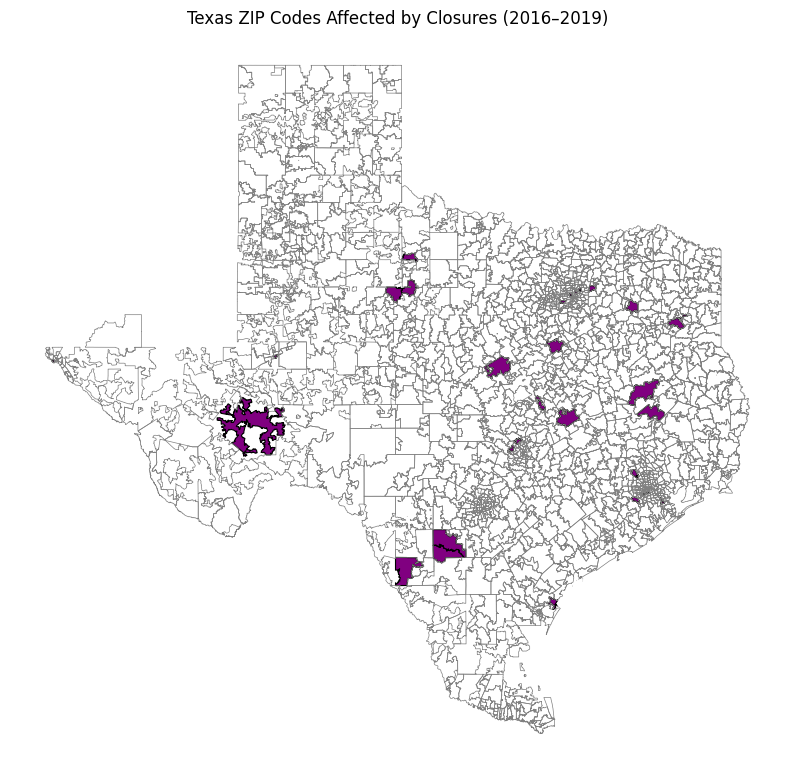

In [ ]:
# Convert ZIP_CD in closure_true_tx_df to strings, removing any decimals
closure_true_tx_df['ZIP_CD'] = closure_true_tx_df['ZIP_CD'].astype(int).astype(str)

# Convert ZCTA5 to string in census_tx for consistent comparison
census_tx['ZCTA5'] = census_tx['ZCTA5'].astype(str)

# Create the 'affected' column: 1 if in closure_true_tx_df['ZIP_CD'], otherwise 0
census_tx['affected'] = census_tx['ZCTA5'].isin(closure_true_tx_df['ZIP_CD']).astype(int)

# Step 3: Plot the choropleth of Texas ZIP codes with color only for affected areas
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# Plot affected areas in purple with borders
census_tx[census_tx['affected'] == 1].plot(color='purple', linewidth=0.8, edgecolor='black', ax=ax)

# Plot unaffected areas with no fill color, only borders
census_tx[census_tx['affected'] == 0].plot(color='none', edgecolor='grey', linewidth=0.5, ax=ax)

# Customize plot
ax.set_title("Texas ZIP Codes Affected by Closures (2016–2019)")
ax.set_axis_off()

plt.show()

In [ ]:
# Count the number of directly affected ZIP codes in Texas
num_directly_affected_zips = census_tx[census_tx['affected'] == 1]['ZCTA5'].nunique()
print("Number of directly affected ZIP codes in Texas:", num_directly_affected_zips)

Number of directly affected ZIP codes in Texas: 33


In [ ]:
census_tx = census_tx.to_crs(epsg=32614)
directly_affected_zips = census_tx[census_tx['affected'] == 1].copy()
directly_affected_zips['geometry'] = directly_affected_zips['geometry'].buffer(16093.4)
indirectly_affected_zips = gpd.sjoin(census_tx, directly_affected_zips[['geometry']], how='inner', predicate='intersects')
indirectly_affected_unique = indirectly_affected_zips[indirectly_affected_zips['affected'] == 0]['ZCTA5'].nunique()
print("Number of indirectly affected ZIP codes in Texas:", indirectly_affected_unique)

Number of indirectly affected ZIP codes in Texas: 576


In [ ]:
# df closure lists
closure_df = pd.DataFrame(closure_csm)
# 'df_active' : filter out active short-term hospitals
df_active = df_short[(df_short['PGM_TRMNTN_CD'] == 0) & df_short['ZIP_CD'].isin(closure_df['ZIP_CD'])]

# 'zip_year' : get the counts of active hospitals in each zip code and year
zip_year = df_active.groupby(['ZIP_CD', 'YEAR']).size().reset_index(name='active')
zip_year = zip_year[['ZIP_CD', 'YEAR', 'active']]

closure_counts = closure_df[['ZIP_CD', 'YEAR_CLO', 'PRVDR_NUM']]
closure_counts = (
    closure_counts.groupby(['ZIP_CD', 'YEAR_CLO'])
    .agg(num_closure=('PRVDR_NUM', 'nunique'), PRVDR_NUM_list=('PRVDR_NUM', lambda x: list(set(x))))
    .reset_index()
)

closure_counts['PRVDR_NUM_list'] = closure_counts['PRVDR_NUM_list'].apply(lambda lst: [str(int(float(num))) for num in lst])

# Rename 'YEAR_CLO' to 'YEAR' for consistency with zip_year
closure_counts = closure_counts.rename(columns={'YEAR_CLO': 'YEAR'})

# Merge closure_counts with zip_year on 'ZIP_CD' and 'YEAR'
zip_year = zip_year.merge(closure_counts, on=['ZIP_CD', 'YEAR'], how='left')

# Fill NaN values in 'num_closure' with 0 and convert to int
zip_year['num_closure'] = zip_year['num_closure'].fillna(0).astype(int)

# 'zip_year': contain num of closure, active, active last year for comparision in next step
zip_year['active_next_y'] = zip_year.groupby('ZIP_CD')['active'].shift(-1)

# 'zip_false_clo': filter for false closures where the number of active hospitals does not decrease in the following year
zip_false_clo = zip_year[
    (zip_year['num_closure'] != 0) &
    (zip_year['active'] <= zip_year['active_next_y'])
]

print(zip_false_clo.shape)
zip_false_clo

(27, 6)


,ZIP_CD,YEAR,active,num_closure,PRVDR_NUM_list,active_next_y
2,00785,2017,1,1,[400009],1.0
6,00928,2017,1,1,[400121],1.0
35,12208,2017,2,1,[330189],2.0
40,12601,2017,1,1,[330067],1.0
62,17901,2018,1,1,[390031],1.0
66,18017,2018,1,1,[390263],1.0
119,33407,2018,1,1,[100234],1.0
127,35611,2018,1,1,[10172],1.0
141,37404,2018,2,1,[440162],2.0
173,42003,2017,2,1,[180153],2.0


In [ ]:
# Count the unique PRVDR_NUM in zip_false_clo
unique_prvdr_num_count = set([prvdr_num for sublist in zip_false_clo['PRVDR_NUM_list'].dropna() for prvdr_num in sublist]).__len__()
print(f"The count of hospitals of false closure in is  {unique_prvdr_num_count}")

# Create a set of (YEAR, PRVDR_NUM) pairs from zip_false_clo to remove
remove_pairs = set(
    (year, prvdr_num)
    for year, prvdr_num_list in zip(zip_false_clo['YEAR'], zip_false_clo['PRVDR_NUM_list'])
    for prvdr_num in prvdr_num_list
)

# Filter closure_csm to exclude entries with matching (YEAR_CLO, PRVDR_NUM) in remove_pairs
closure_csm_true = [
    entry for entry in closure_csm
    if (entry['YEAR_CLO'], entry['PRVDR_NUM']) not in remove_pairs
]

# closure_csm_true now contains only the entries that don’t match the specified (YEAR, PRVDR_NUM) pairs
print(f"Filtered closure_csm length: {len(closure_csm_true)}")

closure_csm_true

The count of hospitals of false closure in is  27
Filtered closure_csm length: 147


[{'PRVDR_NUM': '30001',
  'YEAR_CLO': 2017,
  'ZIP_CD': '85031',
  'FAC_NAME': 'ABRAZO MARYVALE CAMPUS'},
 {'PRVDR_NUM': '360151',
  'YEAR_CLO': 2018,
  'ZIP_CD': '44646',
  'FAC_NAME': 'AFFINITY MEDICAL CENTER'},
 {'PRVDR_NUM': '450488',
  'YEAR_CLO': 2017,
  'ZIP_CD': '75662',
  'FAC_NAME': 'ALLEGIANCE SPECIALTY HOSPITAL OF KILGORE'},
 {'PRVDR_NUM': '250159',
  'YEAR_CLO': 2019,
  'ZIP_CD': '39365',
  'FAC_NAME': 'ALLIANCE LAIRD HOSPITAL'},
 {'PRVDR_NUM': '370032',
  'YEAR_CLO': 2019,
  'ZIP_CD': '73112',
  'FAC_NAME': 'ALLIANCEHEALTH DEACONESS'},
 {'PRVDR_NUM': '60036',
  'YEAR_CLO': 2017,
  'ZIP_CD': '81050',
  'FAC_NAME': 'ARKANSAS VALLEY REGIONAL MEDICAL CENTER'},
 {'PRVDR_NUM': '340037',
  'YEAR_CLO': 2019,
  'ZIP_CD': '28086',
  'FAC_NAME': 'ATRIUM HEALTH KINGS MOUNTAIN'},
 {'PRVDR_NUM': '290006',
  'YEAR_CLO': 2017,
  'ZIP_CD': '89406',
  'FAC_NAME': 'BANNER CHURCHILL COMMUNITY HOSPITAL'},
 {'PRVDR_NUM': '30033',
  'YEAR_CLO': 2018,
  'ZIP_CD': '85541',
  'FAC_NAME': 'BANNER P

In [ ]:
# Filter active_short2016_df for Texas zip codes in 2016 using prefixes
texas_hospitals_2016 = active_short2016_df[
    active_short2016_df['ZIP_CD'].astype(str).str[:3].isin(texas_zip_prefixes)
]

# Count the number of hospitals per zip code in Texas for 2016
hospital_counts = texas_hospitals_2016.groupby('ZIP_CD').size().reset_index(name='num_hospitals')


# Merge the hospital counts with the Texas zip code shapefile data in census_tx
texas_zip_hospitals = census_tx.merge(hospital_counts, left_on='ZCTA5', right_on='ZIP_CD', how='left')
texas_zip_hospitals['num_hospitals'] = texas_zip_hospitals['num_hospitals'].fillna(0)

In [ ]:
texas_hospitals_2016

,PRVDR_CTGRY_SBTYP_CD,PRVDR_CTGRY_CD,CITY_NAME,SSA_CNTY_CD,PRVDR_NUM,STATE_CD,SSA_STATE_CD,TRMNTN_EXPRTN_DT,ZIP_CD,GNRL_FAC_TYPE_CD,PSYCH_UNIT_TRMNTN_CD,FAC_NAME,PGM_TRMNTN_CD,YEAR
5911,1.0,1.0,EL PASO,480.0,450002,TX,45.0,NaN,79902,1.0,0.0,PROVIDENCE MEMORIAL HOSPITAL,0,2016
5914,1.0,1.0,KERRVILLE,734.0,450007,TX,45.0,NaN,78028,1.0,NaN,PETERSON REGIONAL MEDICAL CENTER,0,2016
5915,1.0,1.0,TEMPLE,120.0,450008,TX,45.0,NaN,76502,1.0,1.0,CHILDREN'S HOSPITAL -SCOTT & WHITE HEALTHCARE,0,2016
5916,1.0,1.0,WICHITA FALLS,960.0,450010,TX,45.0,NaN,76301,1.0,1.0,UNITED REGIONAL HEALTH CARE SYSTEM,0,2016
5917,1.0,1.0,BRYAN,190.0,450011,TX,45.0,NaN,77802,1.0,1.0,ST JOSEPH REGIONAL HEALTH CENTER,0,2016
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7240,1.0,1.0,WEIMAR,312.0,670114,TX,45.0,NaN,78962,1.0,NaN,WEIMAR MEDICAL CENTER,0,2016
7241,1.0,1.0,CLEVELAND,757.0,670115,TX,45.0,NaN,77327,1.0,NaN,CLEVELAND EMERGENCY HOSPTIAL,0,2016
7242,1.0,1.0,FORT WORTH,910.0,670116,TX,45.0,NaN,76177,1.0,NaN,WISE HEALTH SYSTEM,0,2016
7243,1.0,1.0,GRAND SALINE,947.0,670117,TX,45.0,NaN,75140,1.0,NaN,TEXAS GENERAL HOSPITAL- VZRMC LP,0,2016


In [ ]:
hospital_counts

,ZIP_CD,num_hospitals
0,75001,1
1,75010,1
2,75013,1
3,75020,1
4,75028,1
...,...,...
252,79761,3
253,79902,4
254,79905,1
255,79936,1


In [ ]:
texas_zip_hospitals

,GEO_ID,ZCTA5,NAME,LSAD,CENSUSAREA,geometry,affected,ZIP_CD,num_hospitals
0,8600000US78624,78624,78624,ZCTA5,708.041,"POLYGON ((503432.37 3374023.84, 503439.279 337...",0,78624,1.0
1,8600000US78626,78626,78626,ZCTA5,93.046,"POLYGON ((633347.155 3382976.525, 632638.265 3...",0,NaN,0.0
2,8600000US78628,78628,78628,ZCTA5,73.382,"POLYGON ((625348.227 3382811.117, 625348.353 3...",0,NaN,0.0
3,8600000US78631,78631,78631,ZCTA5,325.074,"POLYGON ((487456.881 3359299.162, 487445.337 3...",0,NaN,0.0
4,8600000US78632,78632,78632,ZCTA5,96.278,"POLYGON ((653782.474 3293172.762, 653782.628 3...",0,NaN,0.0
...,...,...,...,...,...,...,...,...,...
1930,8600000US78261,78261,78261,ZCTA5,29.865,"POLYGON ((553805.529 3287826.749, 553811.843 3...",0,NaN,0.0
1931,8600000US78368,78368,78368,ZCTA5,216.341,"POLYGON ((612502.194 3126391.601, 612649.761 3...",0,NaN,0.0
1932,8600000US78412,78412,78412,ZCTA5,8.798,"POLYGON ((666800.553 3066210.622, 666799.892 3...",0,78412,1.0
1933,8600000US78557,78557,78557,ZCTA5,11.653,"POLYGON ((579522.631 2883281.694, 579515.799 2...",0,NaN,0.0


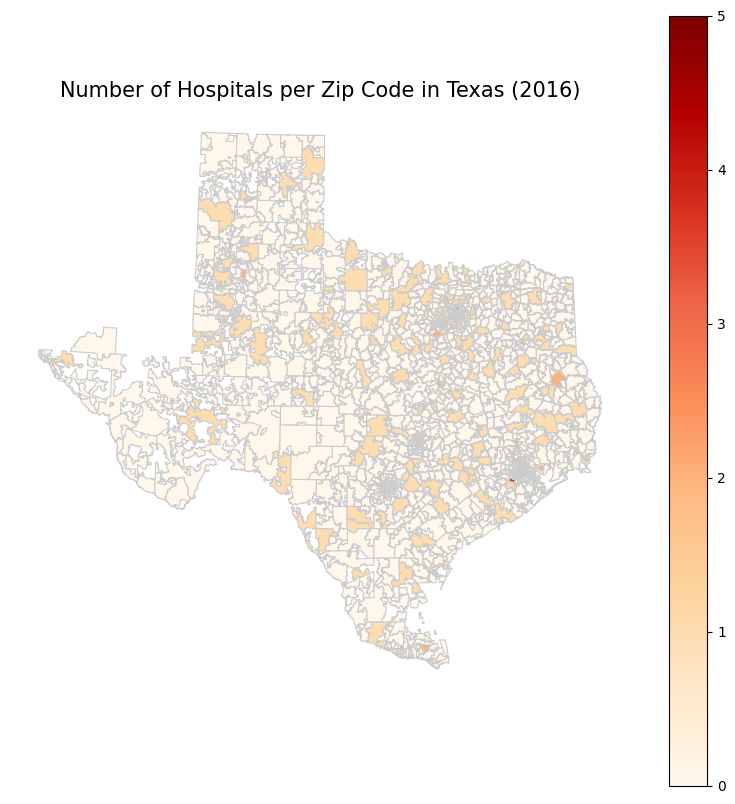

In [ ]:
# Filter active_short2016_df for Texas zip codes in 2016 using prefixes
texas_hospitals_2016 = active_short2016_df[
    active_short2016_df['ZIP_CD'].astype(str).str[:3].isin(texas_zip_prefixes)
]

# Count the number of hospitals per zip code in Texas for 2016
hospital_counts = texas_hospitals_2016.groupby('ZIP_CD').size().reset_index(name='num_hospitals')


# Merge the hospital counts with the Texas zip code shapefile data in census_tx
texas_zip_hospitals = census_tx.merge(hospital_counts, left_on='ZCTA5', right_on='ZIP_CD', how='left')
texas_zip_hospitals['num_hospitals'] = texas_zip_hospitals['num_hospitals'].fillna(0)

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
texas_zip_hospitals.plot(column='num_hospitals', cmap='OrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)
ax.set_title('Number of Hospitals per Zip Code in Texas (2016)', fontsize=15)
plt.axis('off')
plt.show()

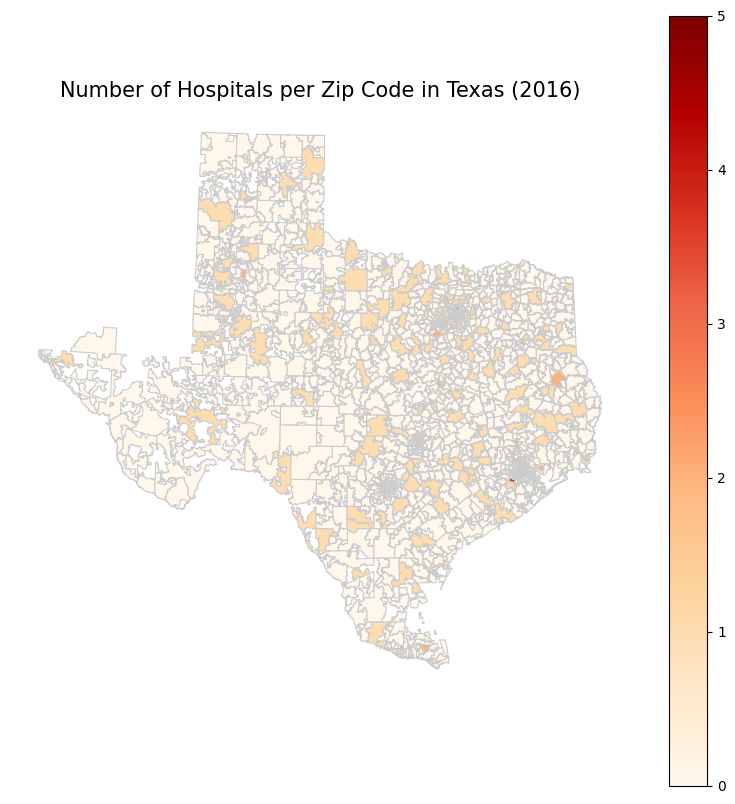

In [ ]:
# Filter active_short2016_df for Texas zip codes in 2016 using prefixes
texas_hospitals_2016 = active_short2016_df[
    active_short2016_df['ZIP_CD'].astype(str).str[:3].isin(texas_zip_prefixes)
]

# Count the number of hospitals per zip code in Texas for 2016
hospital_counts = texas_hospitals_2016.groupby('ZIP_CD').size().reset_index(name='num_hospitals')


# Merge the hospital counts with the Texas zip code shapefile data in census_tx
texas_zip_hospitals = census_tx.merge(hospital_counts, left_on='ZCTA5', right_on='ZIP_CD', how='left')
texas_zip_hospitals['num_hospitals'] = texas_zip_hospitals['num_hospitals'].fillna(0)

fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# Set a color map that better reflects the range of values
choropleth = texas_zip_hospitals.plot(
    column='num_hospitals', 
    cmap='OrRd', 
    linewidth=0.8, 
    ax=ax, 
    edgecolor='0.8', 
    legend=True,
    vmin=0,  # Set minimum value for color scaling
    vmax=5   # Adjust based on the maximum count of hospitals in any ZIP code
)

# Customize the legend to limit the number of ticks and display integer values only
legend = choropleth.get_legend()
if legend:
    legend.set_bbox_to_anchor((1, 0.5))
    legend.set_title("Number of Hospitals")
    legend.ax.yaxis.set_major_locator(ticker.MaxNLocator(integer=True))  # Set integer ticks
    legend.ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%d'))  # Remove decimal places

ax.set_title('Number of Hospitals per Zip Code in Texas (2016)', fontsize=15)
plt.axis('off')
plt.show()

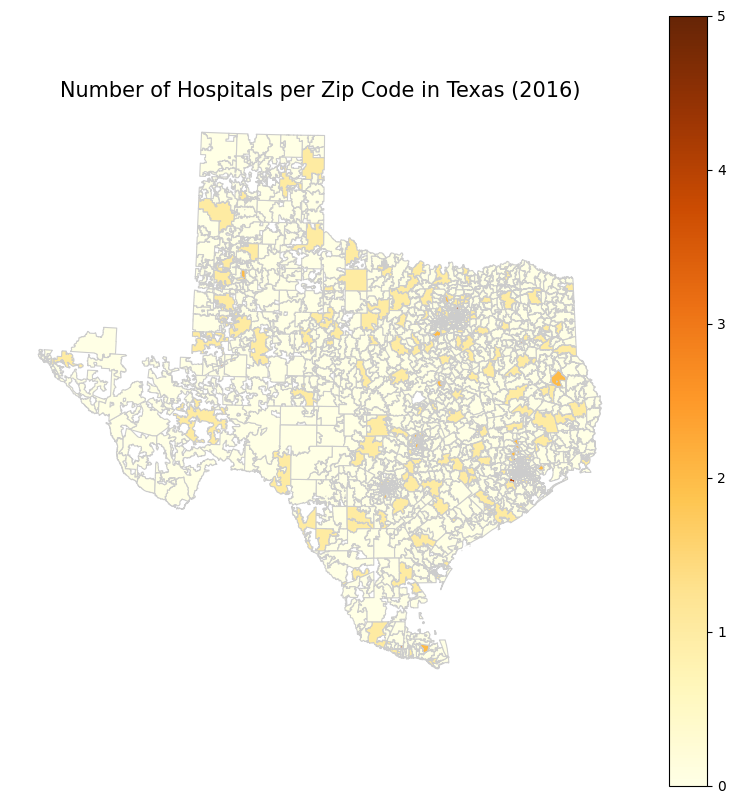

In [ ]:
# Filter active_short2016_df for Texas zip codes in 2016 using prefixes
texas_hospitals_2016 = active_short2016_df[
    active_short2016_df['ZIP_CD'].astype(str).str[:3].isin(texas_zip_prefixes)
]

# Count the number of hospitals per zip code in Texas for 2016
hospital_counts = texas_hospitals_2016.groupby('ZIP_CD').size().reset_index(name='num_hospitals')


# Merge the hospital counts with the Texas zip code shapefile data in census_tx
texas_zip_hospitals = census_tx.merge(hospital_counts, left_on='ZCTA5', right_on='ZIP_CD', how='left')
texas_zip_hospitals['num_hospitals'] = texas_zip_hospitals['num_hospitals'].fillna(0)

fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# Use 'YlOrBr' color map for a warm gradient
choropleth = texas_zip_hospitals.plot(
    column='num_hospitals', 
    cmap='YlOrBr', 
    linewidth=0.8, 
    ax=ax, 
    edgecolor='0.8', 
    legend=True,
    vmin=0,  # Set minimum value for color scaling
    vmax=5   # Adjust based on the maximum count of hospitals in any ZIP code
)

# Customize the legend to limit the number of ticks and display integer values only
legend = choropleth.get_legend()
if legend:
    legend.set_bbox_to_anchor((1, 0.5))
    legend.set_title("Number of Hospitals")
    legend.ax.yaxis.set_major_locator(ticker.MaxNLocator(integer=True))  # Set integer ticks
    legend.ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%d'))  # Remove decimal places

ax.set_title('Number of Hospitals per Zip Code in Texas (2016)', fontsize=15)
plt.axis('off')
plt.show()

ImportError: The 'mapclassify' package (>= 2.4.0) is required to use the 'scheme' keyword.

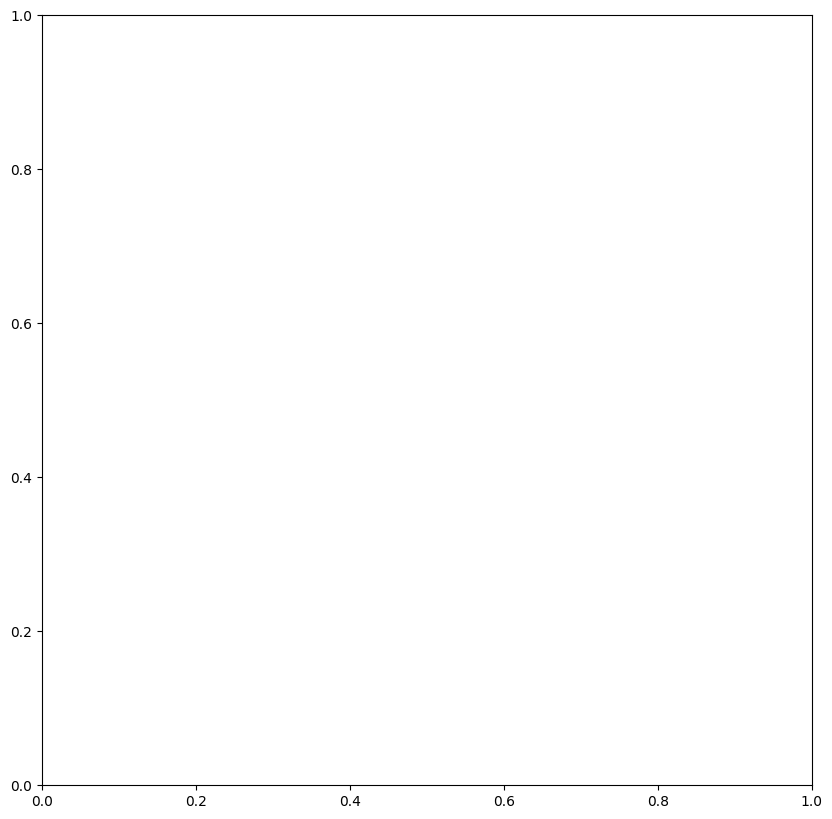

In [ ]:
# Filter active_short2016_df for Texas zip codes in 2016 using prefixes
texas_hospitals_2016 = active_short2016_df[
    active_short2016_df['ZIP_CD'].astype(str).str[:3].isin(texas_zip_prefixes)
]

# Count the number of hospitals per zip code in Texas for 2016
hospital_counts = texas_hospitals_2016.groupby('ZIP_CD').size().reset_index(name='num_hospitals')


# Merge the hospital counts with the Texas zip code shapefile data in census_tx
texas_zip_hospitals = census_tx.merge(hospital_counts, left_on='ZCTA5', right_on='ZIP_CD', how='left')
texas_zip_hospitals['num_hospitals'] = texas_zip_hospitals['num_hospitals'].fillna(0)

fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# Use a discrete color map with fewer bins
choropleth = texas_zip_hospitals.plot(
    column='num_hospitals', 
    cmap='YlOrBr',         # Color map choice (can experiment with others like 'OrRd', 'Purples')
    linewidth=0.8, 
    ax=ax, 
    edgecolor='0.8', 
    legend=True,
    scheme="EqualInterval",  # Use EqualInterval or Quantiles for discrete color bins
    k=5                      # Set the number of bins (discrete colors) to 5
)

# Customize the legend to display clear, discrete ticks
legend = choropleth.get_legend()
if legend:
    legend.set_bbox_to_anchor((1, 0.5))
    legend.set_title("Number of Hospitals")
    legend.ax.yaxis.set_major_locator(ticker.MaxNLocator(integer=True))  # Show only integer ticks
    legend.ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%d')) # Format without decimal places

ax.set_title('Number of Hospitals per Zip Code in Texas (2016)', fontsize=15)
plt.axis('off')
plt.show()

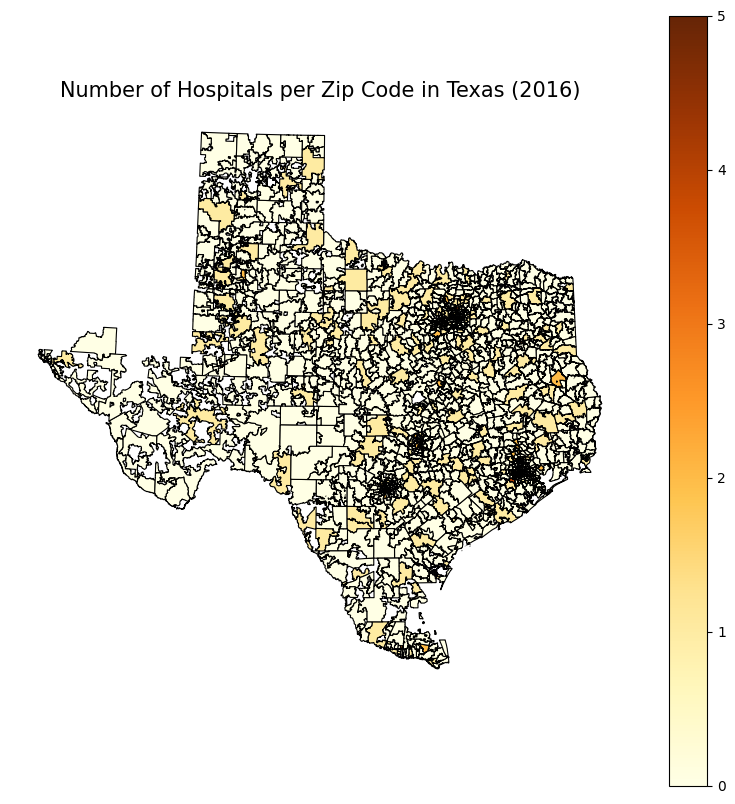

In [ ]:
# Filter active_short2016_df for Texas zip codes in 2016 using prefixes
texas_hospitals_2016 = active_short2016_df[
    active_short2016_df['ZIP_CD'].astype(str).str[:3].isin(texas_zip_prefixes)
]

# Count the number of hospitals per zip code in Texas for 2016
hospital_counts = texas_hospitals_2016.groupby('ZIP_CD').size().reset_index(name='num_hospitals')


# Merge the hospital counts with the Texas zip code shapefile data in census_tx
texas_zip_hospitals = census_tx.merge(hospital_counts, left_on='ZCTA5', right_on='ZIP_CD', how='left')
texas_zip_hospitals['num_hospitals'] = texas_zip_hospitals['num_hospitals'].fillna(0)

fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# Use 'YlOrBr' color map for a warm gradient
choropleth = texas_zip_hospitals.plot(
    column='num_hospitals', 
    cmap='YlOrBr', 
    linewidth=0.8, 
    ax=ax, 
    edgecolor='black', 
    legend=True,
    vmin=0,  # Set minimum value for color scaling
    vmax=5   # Adjust based on the maximum count of hospitals in any ZIP code
)

# Customize the legend to limit the number of ticks and display integer values only
legend = choropleth.get_legend()
if legend:
    legend.set_bbox_to_anchor((1, 0.5))
    legend.set_title("Number of Hospitals")
    legend.ax.yaxis.set_major_locator(ticker.MaxNLocator(integer=True))  # Set integer ticks
    legend.ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%d'))  # Remove decimal places

ax.set_title('Number of Hospitals per Zip Code in Texas (2016)', fontsize=15)
plt.axis('off')
plt.show()

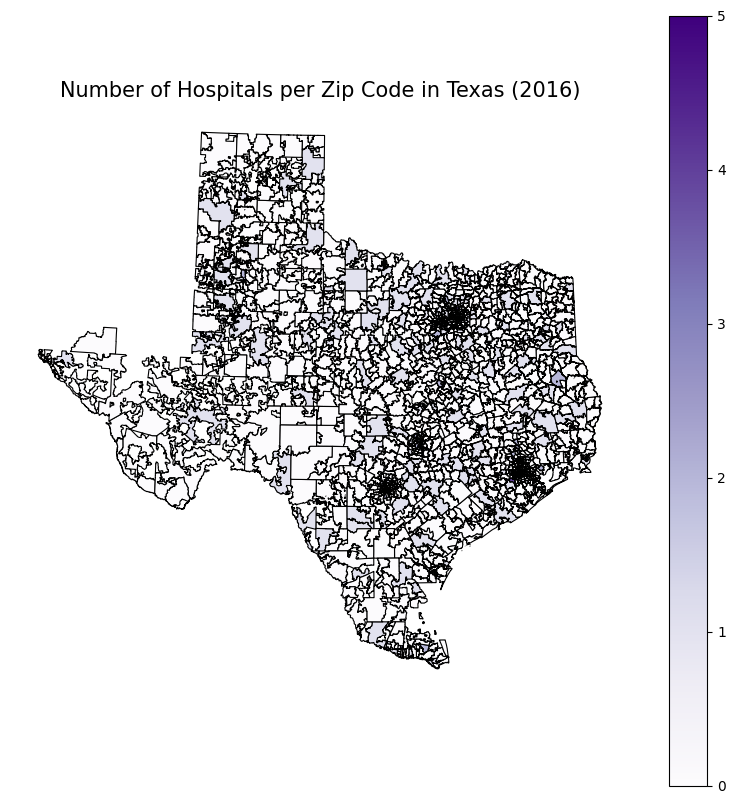

In [ ]:
# Filter active_short2016_df for Texas zip codes in 2016 using prefixes
texas_hospitals_2016 = active_short2016_df[
    active_short2016_df['ZIP_CD'].astype(str).str[:3].isin(texas_zip_prefixes)
]

# Count the number of hospitals per zip code in Texas for 2016
hospital_counts = texas_hospitals_2016.groupby('ZIP_CD').size().reset_index(name='num_hospitals')


# Merge the hospital counts with the Texas zip code shapefile data in census_tx
texas_zip_hospitals = census_tx.merge(hospital_counts, left_on='ZCTA5', right_on='ZIP_CD', how='left')
texas_zip_hospitals['num_hospitals'] = texas_zip_hospitals['num_hospitals'].fillna(0)

fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# Use 'YlOrBr' color map for a warm gradient
choropleth = texas_zip_hospitals.plot(
    column='num_hospitals', 
    cmap='Purples', 
    linewidth=0.8, 
    ax=ax, 
    edgecolor='black', 
    legend=True,
    vmin=0,  # Set minimum value for color scaling
    vmax=5   # Adjust based on the maximum count of hospitals in any ZIP code
)

# Customize the legend to limit the number of ticks and display integer values only
legend = choropleth.get_legend()
if legend:
    legend.set_bbox_to_anchor((1, 0.5))
    legend.set_title("Number of Hospitals")
    legend.ax.yaxis.set_major_locator(ticker.MaxNLocator(integer=True))  # Set integer ticks
    legend.ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%d'))  # Remove decimal places

ax.set_title('Number of Hospitals per Zip Code in Texas (2016)', fontsize=15)
plt.axis('off')
plt.show()

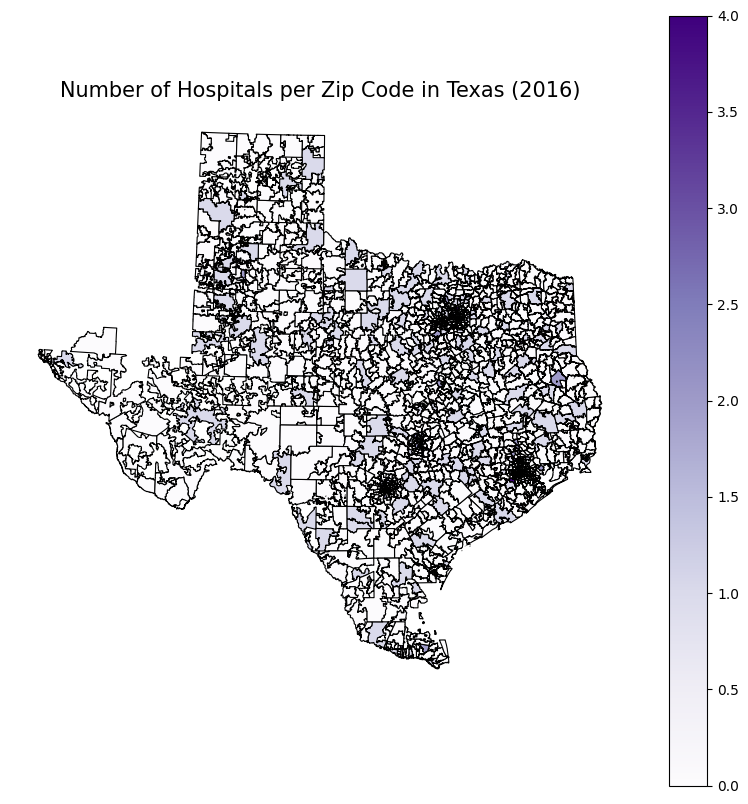

In [ ]:
# Filter active_short2016_df for Texas zip codes in 2016 using prefixes
texas_hospitals_2016 = active_short2016_df[
    active_short2016_df['ZIP_CD'].astype(str).str[:3].isin(texas_zip_prefixes)
]

# Count the number of hospitals per zip code in Texas for 2016
hospital_counts = texas_hospitals_2016.groupby('ZIP_CD').size().reset_index(name='num_hospitals')


# Merge the hospital counts with the Texas zip code shapefile data in census_tx
texas_zip_hospitals = census_tx.merge(hospital_counts, left_on='ZCTA5', right_on='ZIP_CD', how='left')
texas_zip_hospitals['num_hospitals'] = texas_zip_hospitals['num_hospitals'].fillna(0)

fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# Use 'YlOrBr' color map for a warm gradient
choropleth = texas_zip_hospitals.plot(
    column='num_hospitals', 
    cmap='Purples', 
    linewidth=0.8, 
    ax=ax, 
    edgecolor='black', 
    legend=True,
    vmin=0,  # Set minimum value for color scaling
    vmax=4   # Adjust based on the maximum count of hospitals in any ZIP code
)

# Customize the legend to limit the number of ticks and display integer values only
legend = choropleth.get_legend()
if legend:
    legend.set_bbox_to_anchor((1, 0.5))
    legend.set_title("Number of Hospitals")
    legend.ax.yaxis.set_major_locator(ticker.MaxNLocator(integer=True))  # Set integer ticks
    legend.ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%d'))  # Remove decimal places

ax.set_title('Number of Hospitals per Zip Code in Texas (2016)', fontsize=15)
plt.axis('off')
plt.show()

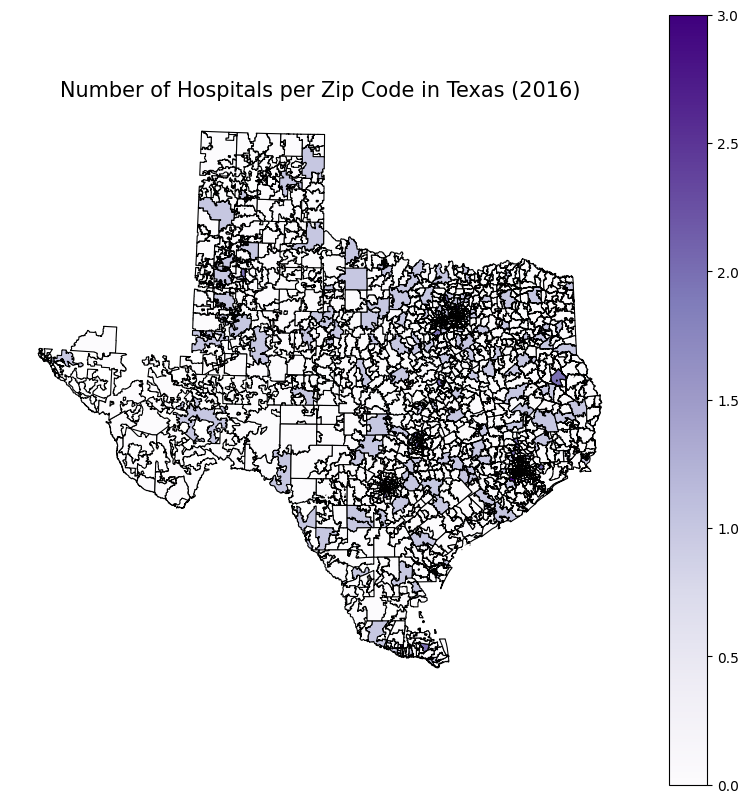

In [ ]:
# Filter active_short2016_df for Texas zip codes in 2016 using prefixes
texas_hospitals_2016 = active_short2016_df[
    active_short2016_df['ZIP_CD'].astype(str).str[:3].isin(texas_zip_prefixes)
]

# Count the number of hospitals per zip code in Texas for 2016
hospital_counts = texas_hospitals_2016.groupby('ZIP_CD').size().reset_index(name='num_hospitals')


# Merge the hospital counts with the Texas zip code shapefile data in census_tx
texas_zip_hospitals = census_tx.merge(hospital_counts, left_on='ZCTA5', right_on='ZIP_CD', how='left')
texas_zip_hospitals['num_hospitals'] = texas_zip_hospitals['num_hospitals'].fillna(0)

fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# Use 'YlOrBr' color map for a warm gradient
choropleth = texas_zip_hospitals.plot(
    column='num_hospitals', 
    cmap='Purples', 
    linewidth=0.8, 
    ax=ax, 
    edgecolor='black', 
    legend=True,
    vmin=0,  # Set minimum value for color scaling
    vmax=3   # Adjust based on the maximum count of hospitals in any ZIP code
)

# Customize the legend to limit the number of ticks and display integer values only
legend = choropleth.get_legend()
if legend:
    legend.set_bbox_to_anchor((1, 0.5))
    legend.set_title("Number of Hospitals")
    legend.ax.yaxis.set_major_locator(ticker.MaxNLocator(integer=True))  # Set integer ticks
    legend.ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%d'))  # Remove decimal places

ax.set_title('Number of Hospitals per Zip Code in Texas (2016)', fontsize=15)
plt.axis('off')
plt.show()

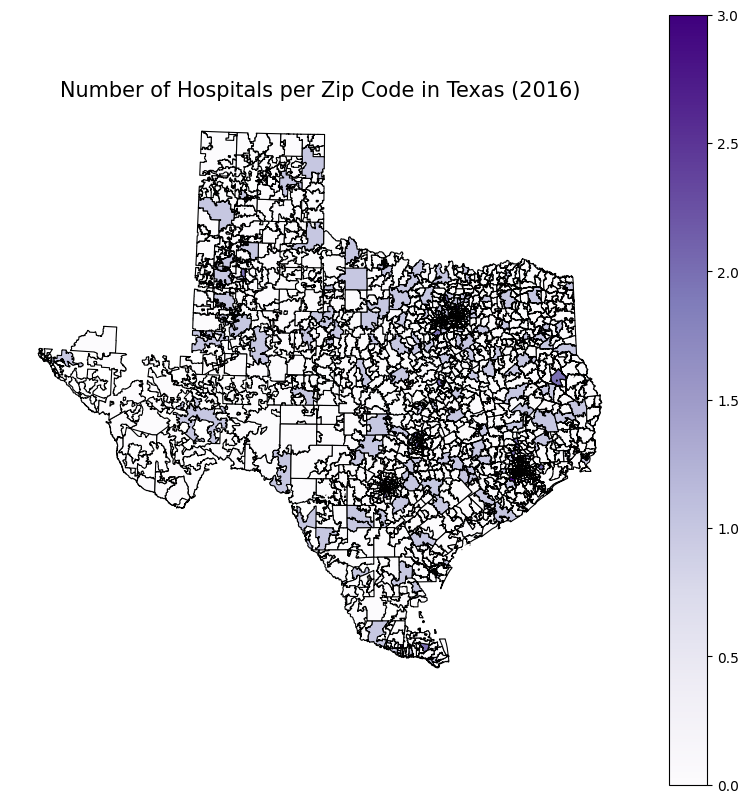

In [ ]:
# Filter active_short2016_df for Texas zip codes in 2016 using prefixes
texas_hospitals_2016 = active_short2016_df[
    active_short2016_df['ZIP_CD'].astype(str).str[:3].isin(texas_zip_prefixes)
]

# Count the number of hospitals per zip code in Texas for 2016
hospital_counts = texas_hospitals_2016.groupby('ZIP_CD').size().reset_index(name='num_hospitals')


# Merge the hospital counts with the Texas zip code shapefile data in census_tx
texas_zip_hospitals = census_tx.merge(hospital_counts, left_on='ZCTA5', right_on='ZIP_CD', how='left')
texas_zip_hospitals['num_hospitals'] = texas_zip_hospitals['num_hospitals'].fillna(0)

fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# Use 'YlOrBr' color map for a warm gradient
choropleth = texas_zip_hospitals.plot(
    column='num_hospitals', 
    cmap='Purples', 
    linewidth=0.8, 
    ax=ax, 
    edgecolor='black', 
    legend=True,
    vmin=0,  # Set minimum value for color scaling
    vmax=3   # Adjust based on the maximum count of hospitals in any ZIP code
)

# Customize the legend to limit the number of ticks and display integer values only
legend = choropleth.get_legend()
if legend:
    legend.set_bbox_to_anchor((1, 1))
    legend.set_title("Number of Hospitals")
    legend.ax.yaxis.set_major_locator(ticker.MaxNLocator(integer=True))  # Set integer ticks
    legend.ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%d'))  # Remove decimal places

ax.set_title('Number of Hospitals per Zip Code in Texas (2016)', fontsize=15)
plt.axis('off')
plt.show()

In [ ]:
# Filter active_short2016_df for Texas zip codes in 2016 using prefixes
texas_hospitals_2016 = active_short2016_df[
    active_short2016_df['ZIP_CD'].astype(str).str[:3].isin(texas_zip_prefixes)
]

# Count the number of hospitals per zip code in Texas for 2016
hospital_counts = texas_hospitals_2016.groupby('ZIP_CD').size().reset_index(name='num_hospitals')


# Merge the hospital counts with the Texas zip code shapefile data in census_tx
texas_zip_hospitals = census_tx.merge(hospital_counts, left_on='ZCTA5', right_on='ZIP_CD', how='left')
texas_zip_hospitals['num_hospitals'] = texas_zip_hospitals['num_hospitals'].fillna(0)

range(texas_zip_hospitals['num_hospitals'])

TypeError: 'Series' object cannot be interpreted as an integer

In [ ]:
# Filter active_short2016_df for Texas zip codes in 2016 using prefixes
texas_hospitals_2016 = active_short2016_df[
    active_short2016_df['ZIP_CD'].astype(str).str[:3].isin(texas_zip_prefixes)
]

# Count the number of hospitals per zip code in Texas for 2016
hospital_counts = texas_hospitals_2016.groupby('ZIP_CD').size().reset_index(name='num_hospitals')


# Merge the hospital counts with the Texas zip code shapefile data in census_tx
texas_zip_hospitals = census_tx.merge(hospital_counts, left_on='ZCTA5', right_on='ZIP_CD', how='left')
texas_zip_hospitals['num_hospitals'] = texas_zip_hospitals['num_hospitals'].fillna(0)

texas_zip_hospitals['num_hospitals']

0       1.0
1       0.0
2       0.0
3       0.0
4       0.0
       ... 
1930    0.0
1931    0.0
1932    1.0
1933    0.0
1934    0.0
Name: num_hospitals, Length: 1935, dtype: float64

In [ ]:
# Filter active_short2016_df for Texas zip codes in 2016 using prefixes
texas_hospitals_2016 = active_short2016_df[
    active_short2016_df['ZIP_CD'].astype(str).str[:3].isin(texas_zip_prefixes)
]

# Count the number of hospitals per zip code in Texas for 2016
hospital_counts = texas_hospitals_2016.groupby('ZIP_CD').size().reset_index(name='num_hospitals')


# Merge the hospital counts with the Texas zip code shapefile data in census_tx
texas_zip_hospitals = census_tx.merge(hospital_counts, left_on='ZCTA5', right_on='ZIP_CD', how='left')
texas_zip_hospitals['num_hospitals'] = texas_zip_hospitals['num_hospitals'].fillna(0)

texas_zip_hospitals['num_hospitals'].max

<bound method Series.max of 0       1.0
1       0.0
2       0.0
3       0.0
4       0.0
       ... 
1930    0.0
1931    0.0
1932    1.0
1933    0.0
1934    0.0
Name: num_hospitals, Length: 1935, dtype: float64>

In [ ]:
# Filter active_short2016_df for Texas zip codes in 2016 using prefixes
texas_hospitals_2016 = active_short2016_df[
    active_short2016_df['ZIP_CD'].astype(str).str[:3].isin(texas_zip_prefixes)
]

# Count the number of hospitals per zip code in Texas for 2016
hospital_counts = texas_hospitals_2016.groupby('ZIP_CD').size().reset_index(name='num_hospitals')


# Merge the hospital counts with the Texas zip code shapefile data in census_tx
texas_zip_hospitals = census_tx.merge(hospital_counts, left_on='ZCTA5', right_on='ZIP_CD', how='left')
texas_zip_hospitals['num_hospitals'] = texas_zip_hospitals['num_hospitals'].fillna(0)

texas_zip_hospitals['num_hospitals'].max()

5.0

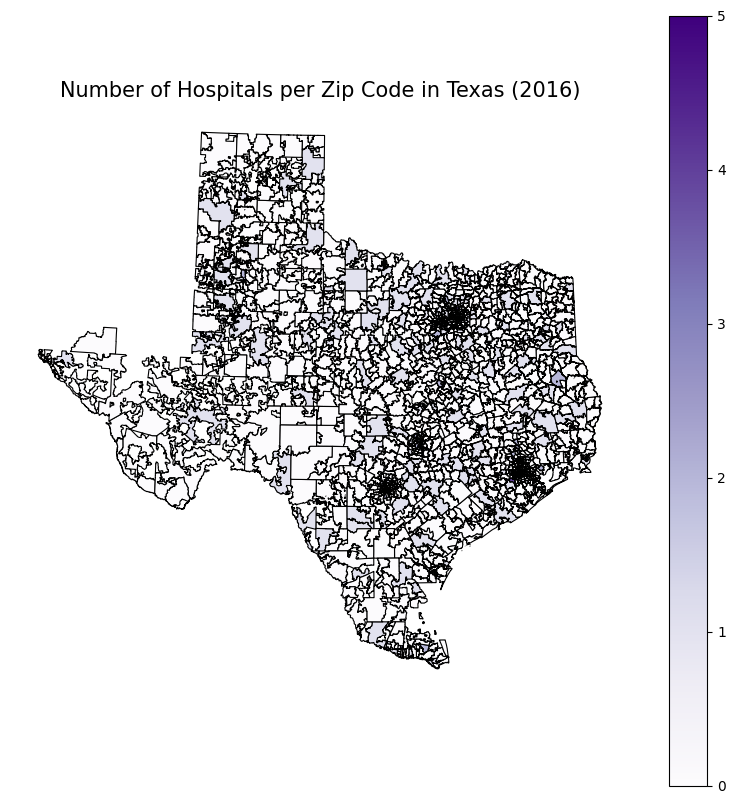

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# Use 'YlOrBr' color map for a warm gradient
choropleth = texas_zip_hospitals.plot(
    column='num_hospitals', 
    cmap='Purples', 
    linewidth=0.8, 
    ax=ax, 
    edgecolor='black', 
    legend=True,
    vmin=0,  # Set minimum value for color scaling
    vmax=5   # Adjust based on the maximum count of hospitals in any ZIP code
)

# Customize the legend to limit the number of ticks and display integer values only
legend = choropleth.get_legend()
if legend:
    legend.set_bbox_to_anchor((1, 1))
    legend.set_title("Number of Hospitals")
    legend.ax.yaxis.set_major_locator(ticker.MaxNLocator(integer=True))  # Set integer ticks
    legend.ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%d'))  # Remove decimal places

ax.set_title('Number of Hospitals per Zip Code in Texas (2016)', fontsize=15)
plt.axis('off')
plt.show()

In [ ]:
# Filter active_short2016_df for Texas zip codes in 2016 using prefixes
texas_hospitals_2016 = active_short2016_df[
    active_short2016_df['ZIP_CD'].astype(str).str[:3].isin(texas_zip_prefixes)
]

# Count the number of hospitals per zip code in Texas for 2016
hospital_counts = texas_hospitals_2016.groupby('ZIP_CD').size().reset_index(name='num_hospitals')


# Merge the hospital counts with the Texas zip code shapefile data in census_tx
texas_zip_hospitals = census_tx.merge(hospital_counts, left_on='ZCTA5', right_on='ZIP_CD', how='left')
texas_zip_hospitals['num_hospitals'] = texas_zip_hospitals['num_hospitals'].fillna(0)

texas_zip_hospitals['num_hospitals'].range()

AttributeError: 'Series' object has no attribute 'range'

In [ ]:
texas_zip_hospitals[texas_zip_hospitals['num_hospitals'] == 5]

,GEO_ID,ZCTA5,NAME,LSAD,CENSUSAREA,geometry,affected,ZIP_CD,num_hospitals
472,8600000US77030,77030,77030,ZCTA5,2.521,"POLYGON ((846997.035 3290311.715, 846950.629 3...",0,77030,5.0


In [ ]:
discrete_colors = ListedColormap(['#f2e6ff', '#d9b3ff', '#b266ff', '#8c1aff', '#4d0099'])
# '#f2e6ff' is very light, moving to darker purple shades

fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# Use the discrete color map
choropleth = texas_zip_hospitals.plot(
    column='num_hospitals', 
    cmap=discrete_colors,   # Use the discrete color map
    linewidth=0.8, 
    ax=ax, 
    edgecolor='black', 
    legend=True,
    vmin=0,  # Set minimum value for color scaling
    vmax=5   # Set the maximum value to align with the number of color steps
)

# Customize the legend to have integer values only
legend = choropleth.get_legend()
if legend:
    legend.set_bbox_to_anchor((1, 0.5))
    legend.set_title("Number of Hospitals")
    legend.ax.yaxis.set_major_locator(ticker.MultipleLocator(1))  # Set integer ticks with interval 1
    legend.ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%d'))  # Remove decimal places

ax.set_title('Number of Hospitals per Zip Code in Texas (2016)', fontsize=15)
plt.axis('off')
plt.show()

NameError: name 'ListedColormap' is not defined

In [ ]:
import pandas as pd
import altair as alt
import time
import os
from tabulate import tabulate
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib.colors import ListedColormap
from shapely.geometry import Polygon

import warnings 
warnings.filterwarnings('ignore')

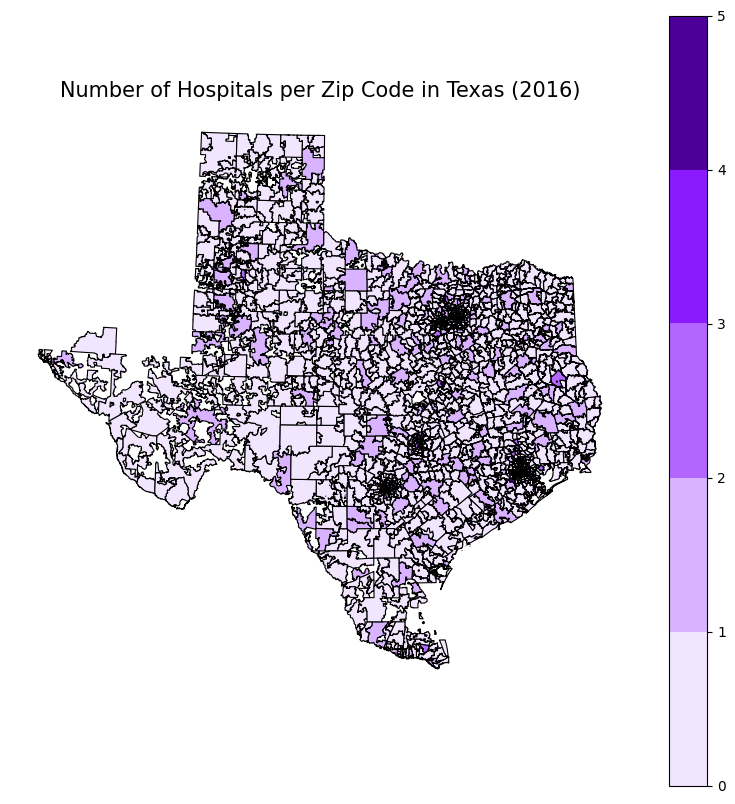

In [ ]:
discrete_colors = ListedColormap(['#f2e6ff', '#d9b3ff', '#b266ff', '#8c1aff', '#4d0099'])
# '#f2e6ff' is very light, moving to darker purple shades

fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# Use the discrete color map
choropleth = texas_zip_hospitals.plot(
    column='num_hospitals', 
    cmap=discrete_colors,   # Use the discrete color map
    linewidth=0.8, 
    ax=ax, 
    edgecolor='black', 
    legend=True,
    vmin=0,  # Set minimum value for color scaling
    vmax=5   # Set the maximum value to align with the number of color steps
)

# Customize the legend to have integer values only
legend = choropleth.get_legend()
if legend:
    legend.set_bbox_to_anchor((1, 0.5))
    legend.set_title("Number of Hospitals")
    legend.ax.yaxis.set_major_locator(ticker.MultipleLocator(1))  # Set integer ticks with interval 1
    legend.ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%d'))  # Remove decimal places

ax.set_title('Number of Hospitals per Zip Code in Texas (2016)', fontsize=15)
plt.axis('off')
plt.show()

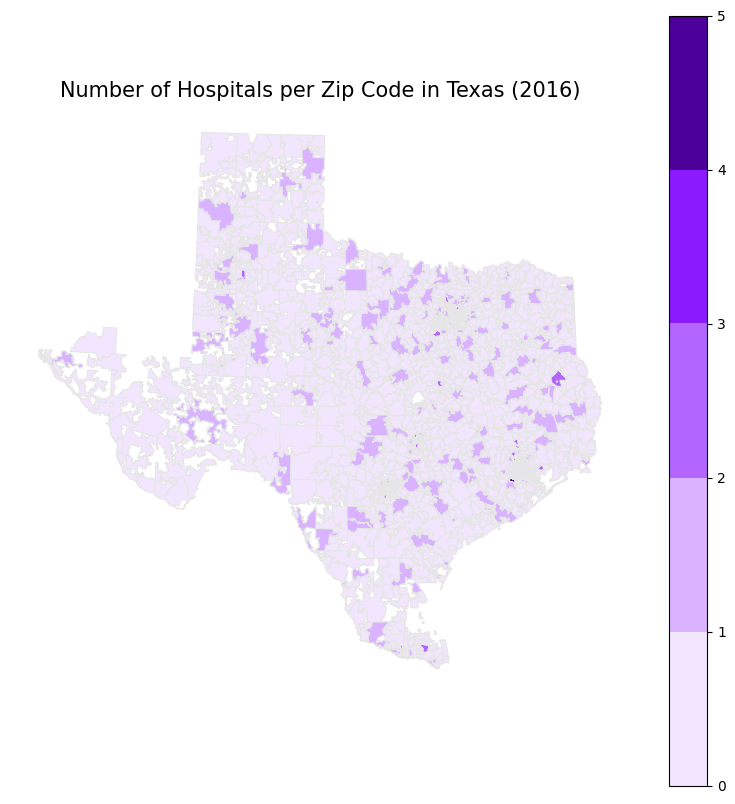

In [ ]:
discrete_colors = ListedColormap(['#f2e6ff', '#d9b3ff', '#b266ff', '#8c1aff', '#4d0099'])
# '#f2e6ff' is very light, moving to darker purple shades

fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# Use the discrete color map
choropleth = texas_zip_hospitals.plot(
    column='num_hospitals', 
    cmap=discrete_colors,   # Use the discrete color map
    linewidth=0.8, 
    ax=ax, 
    edgecolor='0.9', 
    legend=True,
    vmin=0,  # Set minimum value for color scaling
    vmax=5   # Set the maximum value to align with the number of color steps
)

# Customize the legend to have integer values only
legend = choropleth.get_legend()
if legend:
    legend.set_bbox_to_anchor((1, 0.5))
    legend.set_title("Number of Hospitals")
    legend.ax.yaxis.set_major_locator(ticker.MultipleLocator(1))  # Set integer ticks with interval 1
    legend.ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%d'))  # Remove decimal places

ax.set_title('Number of Hospitals per Zip Code in Texas (2016)', fontsize=15)
plt.axis('off')
plt.show()

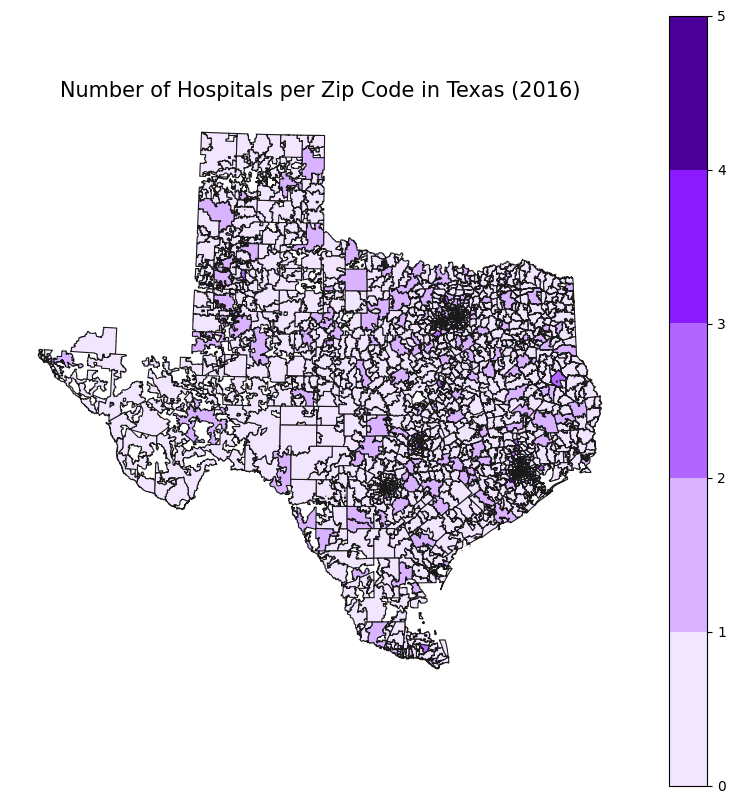

In [ ]:
discrete_colors = ListedColormap(['#f2e6ff', '#d9b3ff', '#b266ff', '#8c1aff', '#4d0099'])
# '#f2e6ff' is very light, moving to darker purple shades

fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# Use the discrete color map
choropleth = texas_zip_hospitals.plot(
    column='num_hospitals', 
    cmap=discrete_colors,   # Use the discrete color map
    linewidth=0.8, 
    ax=ax, 
    edgecolor='0.1', 
    legend=True,
    vmin=0,  # Set minimum value for color scaling
    vmax=5   # Set the maximum value to align with the number of color steps
)

# Customize the legend to have integer values only
legend = choropleth.get_legend()
if legend:
    legend.set_bbox_to_anchor((1, 0.5))
    legend.set_title("Number of Hospitals")
    legend.ax.yaxis.set_major_locator(ticker.MultipleLocator(1))  # Set integer ticks with interval 1
    legend.ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%d'))  # Remove decimal places

ax.set_title('Number of Hospitals per Zip Code in Texas (2016)', fontsize=15)
plt.axis('off')
plt.show()

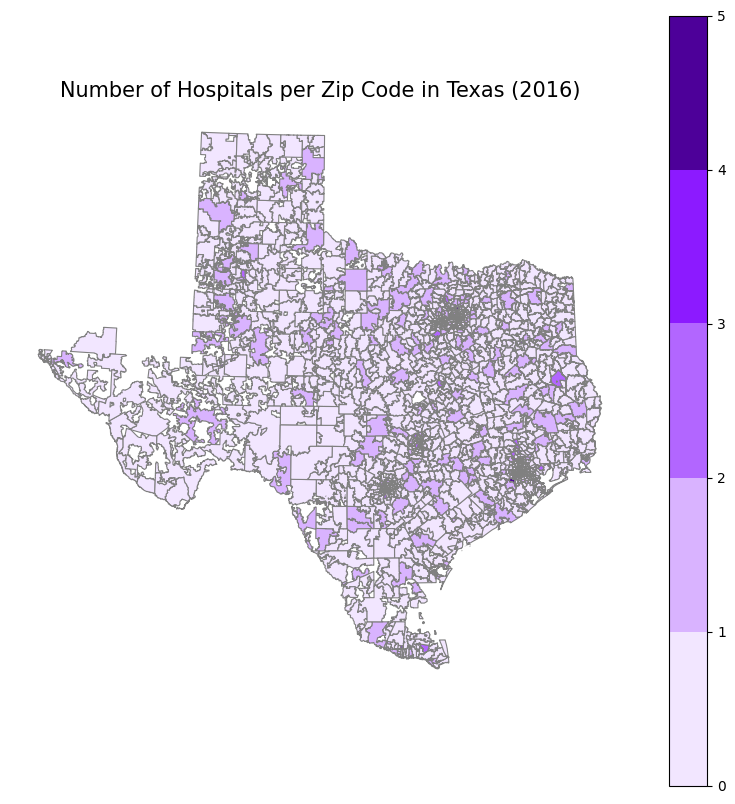

In [ ]:
discrete_colors = ListedColormap(['#f2e6ff', '#d9b3ff', '#b266ff', '#8c1aff', '#4d0099'])
# '#f2e6ff' is very light, moving to darker purple shades

fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# Use the discrete color map
choropleth = texas_zip_hospitals.plot(
    column='num_hospitals', 
    cmap=discrete_colors,   # Use the discrete color map
    linewidth=0.8, 
    ax=ax, 
    edgecolor='0.5', 
    legend=True,
    vmin=0,  # Set minimum value for color scaling
    vmax=5   # Set the maximum value to align with the number of color steps
)

# Customize the legend to have integer values only
legend = choropleth.get_legend()
if legend:
    legend.set_bbox_to_anchor((1, 0.5))
    legend.set_title("Number of Hospitals")
    legend.ax.yaxis.set_major_locator(ticker.MultipleLocator(1))  # Set integer ticks with interval 1
    legend.ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%d'))  # Remove decimal places

ax.set_title('Number of Hospitals per Zip Code in Texas (2016)', fontsize=15)
plt.axis('off')
plt.show()

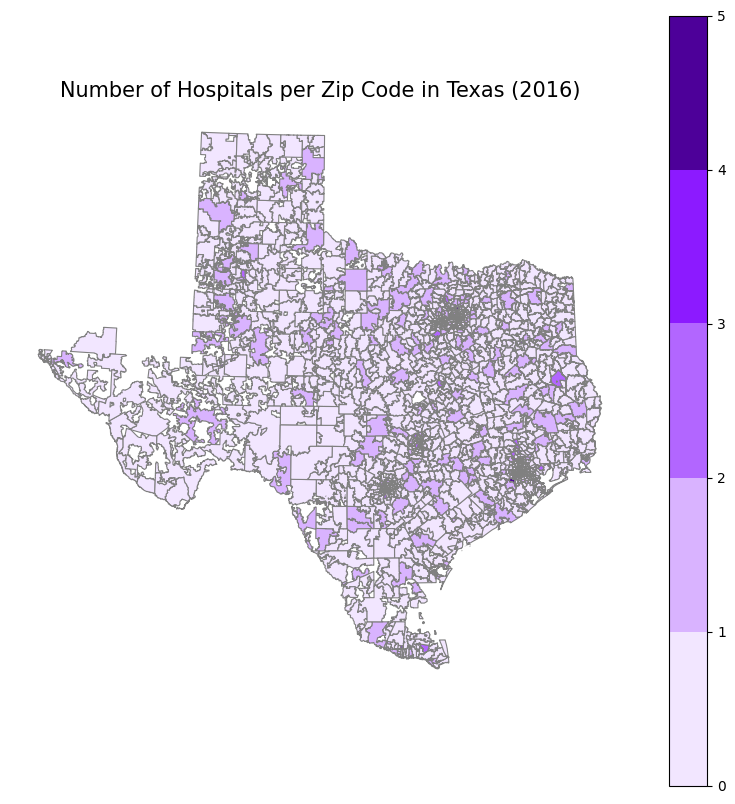

In [ ]:
discrete_colors = ListedColormap(['#f2e6ff', '#d9b3ff', '#b266ff', '#8c1aff', '#4d0099'])
# '#f2e6ff' is very light, moving to darker purple shades

fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# Use the discrete color map
choropleth = texas_zip_hospitals.plot(
    column='num_hospitals', 
    cmap=discrete_colors,   # Use the discrete color map
    linewidth=0.8, 
    ax=ax, 
    edgecolor='grey', 
    legend=True,
    vmin=0,  # Set minimum value for color scaling
    vmax=5   # Set the maximum value to align with the number of color steps
)

# Customize the legend to have integer values only
legend = choropleth.get_legend()
if legend:
    legend.set_bbox_to_anchor((1, 0.5))
    legend.set_title("Number of Hospitals")
    legend.ax.yaxis.set_major_locator(ticker.MultipleLocator(1))  # Set integer ticks with interval 1
    legend.ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%d'))  # Remove decimal places

ax.set_title('Number of Hospitals per Zip Code in Texas (2016)', fontsize=15)
plt.axis('off')
plt.show()

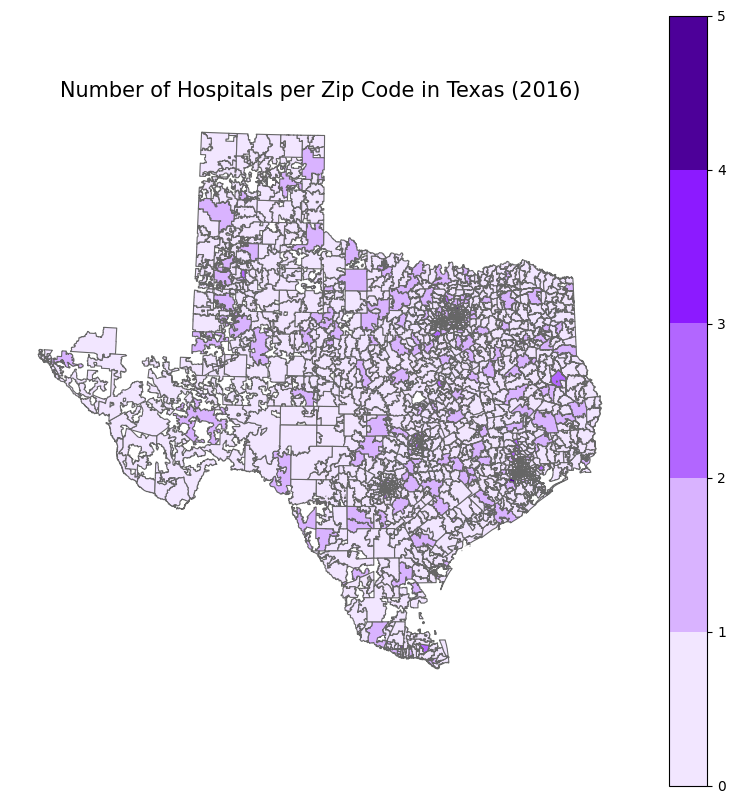

In [ ]:
discrete_colors = ListedColormap(['#f2e6ff', '#d9b3ff', '#b266ff', '#8c1aff', '#4d0099'])
# '#f2e6ff' is very light, moving to darker purple shades

fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# Use the discrete color map
choropleth = texas_zip_hospitals.plot(
    column='num_hospitals', 
    cmap=discrete_colors,   # Use the discrete color map
    linewidth=0.8, 
    ax=ax, 
    edgecolor='0.4', 
    legend=True,
    vmin=0,  # Set minimum value for color scaling
    vmax=5   # Set the maximum value to align with the number of color steps
)

# Customize the legend to have integer values only
legend = choropleth.get_legend()
if legend:
    legend.set_bbox_to_anchor((1, 0.5))
    legend.set_title("Number of Hospitals")
    legend.ax.yaxis.set_major_locator(ticker.MultipleLocator(1))  # Set integer ticks with interval 1
    legend.ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%d'))  # Remove decimal places

ax.set_title('Number of Hospitals per Zip Code in Texas (2016)', fontsize=15)
plt.axis('off')
plt.show()

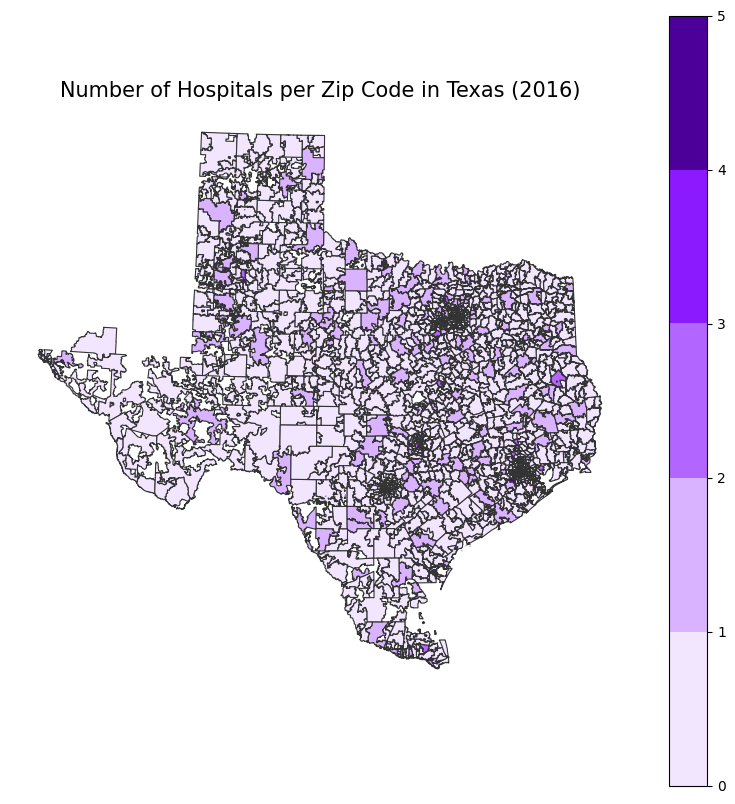

In [ ]:
discrete_colors = ListedColormap(['#f2e6ff', '#d9b3ff', '#b266ff', '#8c1aff', '#4d0099'])
# '#f2e6ff' is very light, moving to darker purple shades

fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# Use the discrete color map
choropleth = texas_zip_hospitals.plot(
    column='num_hospitals', 
    cmap=discrete_colors,   # Use the discrete color map
    linewidth=0.8, 
    ax=ax, 
    edgecolor='0.2', 
    legend=True,
    vmin=0,  # Set minimum value for color scaling
    vmax=5   # Set the maximum value to align with the number of color steps
)

# Customize the legend to have integer values only
legend = choropleth.get_legend()
if legend:
    legend.set_bbox_to_anchor((1, 0.5))
    legend.set_title("Number of Hospitals")
    legend.ax.yaxis.set_major_locator(ticker.MultipleLocator(1))  # Set integer ticks with interval 1
    legend.ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%d'))  # Remove decimal places

ax.set_title('Number of Hospitals per Zip Code in Texas (2016)', fontsize=15)
plt.axis('off')
plt.show()

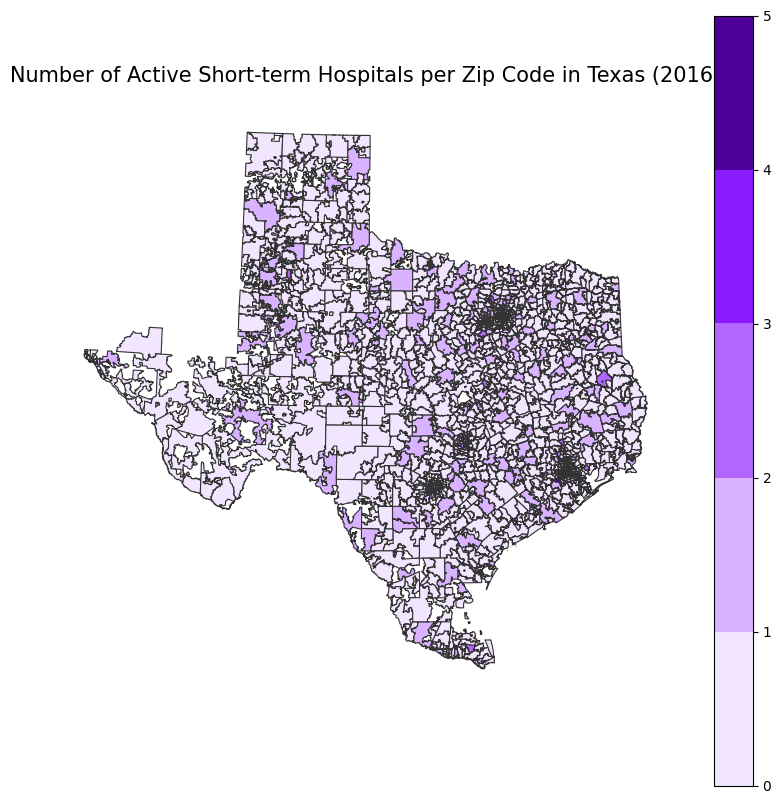

In [ ]:
discrete_colors = ListedColormap(['#f2e6ff', '#d9b3ff', '#b266ff', '#8c1aff', '#4d0099'])
# '#f2e6ff' is very light, moving to darker purple shades

fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# Use the discrete color map
choropleth = texas_zip_hospitals.plot(
    column='num_hospitals', 
    cmap=discrete_colors,   # Use the discrete color map
    linewidth=0.8, 
    ax=ax, 
    edgecolor='0.2', 
    legend=True,
    vmin=0,  # Set minimum value for color scaling
    vmax=5   # Set the maximum value to align with the number of color steps
)

# Customize the legend to have integer values only
legend = choropleth.get_legend()
if legend:
    legend.set_bbox_to_anchor((1, 0.5))
    legend.set_title("Number of Hospitals")
    legend.ax.yaxis.set_major_locator(ticker.MultipleLocator(1))  # Set integer ticks with interval 1
    legend.ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%d'))  # Remove decimal places

ax.set_title('Number of Active Short-term Hospitals per Zip Code in Texas (2016)', fontsize=15)
plt.axis('off')
plt.show()

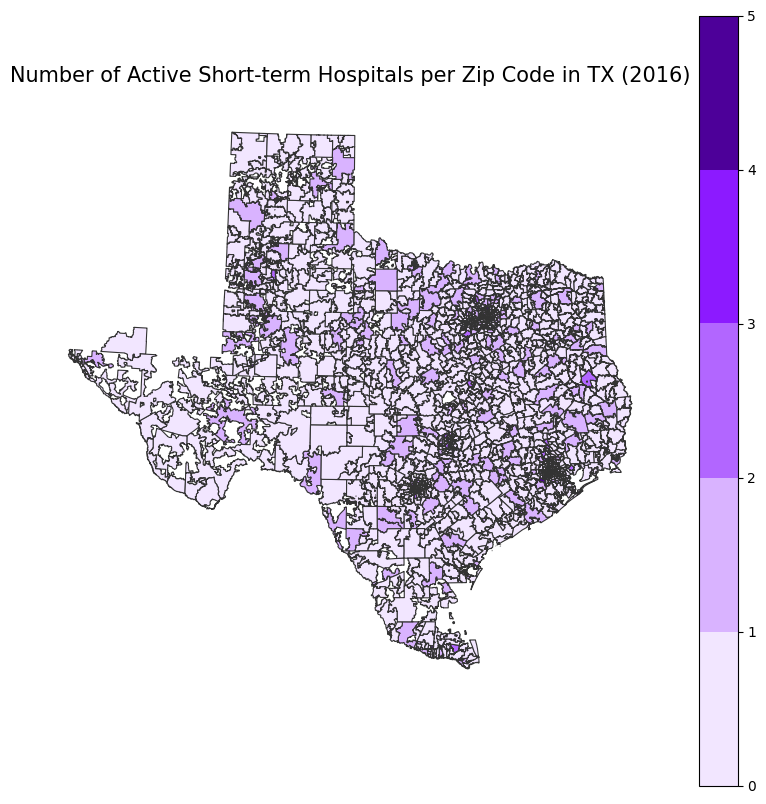

In [ ]:
discrete_colors = ListedColormap(['#f2e6ff', '#d9b3ff', '#b266ff', '#8c1aff', '#4d0099'])
# '#f2e6ff' is very light, moving to darker purple shades

fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# Use the discrete color map
choropleth = texas_zip_hospitals.plot(
    column='num_hospitals', 
    cmap=discrete_colors,   # Use the discrete color map
    linewidth=0.8, 
    ax=ax, 
    edgecolor='0.2', 
    legend=True,
    vmin=0,  # Set minimum value for color scaling
    vmax=5   # Set the maximum value to align with the number of color steps
)

# Customize the legend to have integer values only
legend = choropleth.get_legend()
if legend:
    legend.set_bbox_to_anchor((1, 0.5))
    legend.set_title("Number of Hospitals")
    legend.ax.yaxis.set_major_locator(ticker.MultipleLocator(1))  # Set integer ticks with interval 1
    legend.ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%d'))  # Remove decimal places

ax.set_title('Number of Active Short-term Hospitals per Zip Code in TX (2016)', fontsize=15)
plt.axis('off')
plt.show()

In [ ]:
# import cencus data
cencus_path = os.path.join(base_path, 'gz_2010_us_860_00_500k/gz_2010_us_860_00_500k.shp')
print(cencus_path)
census_data = gpd.read_file(cencus_path)
census_data.head(3)

/Users/nancy/Documents/Document/U.S/class/fall 2024/dap2/homework/problem-set-4-y/data/gz_2010_us_860_00_500k/gz_2010_us_860_00_500k.shp


,GEO_ID,ZCTA5,NAME,LSAD,CENSUSAREA,geometry
0,8600000US01040,01040,01040,ZCTA5,21.281,"POLYGON ((-72.62734 42.16203, -72.62764 42.162..."
1,8600000US01050,01050,01050,ZCTA5,38.329,"POLYGON ((-72.95393 42.34379, -72.95385 42.343..."
2,8600000US01053,01053,01053,ZCTA5,5.131,"POLYGON ((-72.68286 42.37002, -72.68287 42.369..."


In [ ]:
census_data['centroid'] = census_data.geometry.centroid

In [ ]:
zip_with_hospitals_2016 = active_short2016_df.groupby('ZIP_CD')['PRVDR_NUM'].nunique()

# Filter ZIP codes with at least one unique hospital provider
zip_with_hospitals_2016 = zip_with_hospitals_2016[zip_with_hospitals_2016 >= 1]

# Display the resulting ZIP codes and the number of unique hospitals in each
zip_with_hospitals_2016 = zip_with_hospitals_2016.reset_index()
zip_with_hospitals_2016.columns = ['ZIP_CD', 'Unique_Hospitals']
zip_with_hospitals_2016.head()

,ZIP_CD,Unique_Hospitals
0,00603,1
1,00613,1
2,00614,1
3,00631,1
4,00641,1


In [ ]:
active_short2016_df

,PRVDR_CTGRY_SBTYP_CD,PRVDR_CTGRY_CD,CITY_NAME,SSA_CNTY_CD,PRVDR_NUM,STATE_CD,SSA_STATE_CD,TRMNTN_EXPRTN_DT,ZIP_CD,GNRL_FAC_TYPE_CD,PSYCH_UNIT_TRMNTN_CD,FAC_NAME,PGM_TRMNTN_CD,YEAR
0,1.0,1.0,DOTHAN,340.0,10001,AL,1.0,NaN,36301,1.0,1.0,SOUTHEAST ALABAMA MEDICAL CENTER,0,2016
2,1.0,1.0,BOAZ,470.0,10005,AL,1.0,NaN,35957,1.0,NaN,MARSHALL MEDICAL CENTER SOUTH,0,2016
3,1.0,1.0,FLORENCE,380.0,10006,AL,1.0,NaN,35631,1.0,NaN,ELIZA COFFEE MEMORIAL HOSPITAL,0,2016
4,1.0,1.0,OPP,190.0,10007,AL,1.0,NaN,36467,1.0,0.0,MIZELL MEMORIAL HOSPITAL,0,2016
5,1.0,1.0,LUVERNE,200.0,10008,AL,1.0,NaN,36049,1.0,0.0,CRENSHAW COMMUNITY HOSPITAL,0,2016
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7240,1.0,1.0,WEIMAR,312.0,670114,TX,45.0,NaN,78962,1.0,NaN,WEIMAR MEDICAL CENTER,0,2016
7241,1.0,1.0,CLEVELAND,757.0,670115,TX,45.0,NaN,77327,1.0,NaN,CLEVELAND EMERGENCY HOSPTIAL,0,2016
7242,1.0,1.0,FORT WORTH,910.0,670116,TX,45.0,NaN,76177,1.0,NaN,WISE HEALTH SYSTEM,0,2016
7243,1.0,1.0,GRAND SALINE,947.0,670117,TX,45.0,NaN,75140,1.0,NaN,TEXAS GENERAL HOSPITAL- VZRMC LP,0,2016


In [ ]:
zip_with_hospitals_2016 = texas_hospitals_2016.groupby('ZIP_CD')['PRVDR_NUM'].nunique()

# Filter ZIP codes with at least one unique hospital provider
zip_with_hospitals_2016 = zip_with_hospitals_2016[zip_with_hospitals_2016 >= 1]

# Display the resulting ZIP codes and the number of unique hospitals in each
zip_with_hospitals_2016 = zip_with_hospitals_2016.reset_index()
zip_with_hospitals_2016.columns = ['ZIP_CD', 'Unique_Hospitals']
zip_with_hospitals_2016.head()

,ZIP_CD,Unique_Hospitals
0,75001,1
1,75010,1
2,75013,1
3,75020,1
4,75028,1


In [ ]:
texas_hospitals_2016

,PRVDR_CTGRY_SBTYP_CD,PRVDR_CTGRY_CD,CITY_NAME,SSA_CNTY_CD,PRVDR_NUM,STATE_CD,SSA_STATE_CD,TRMNTN_EXPRTN_DT,ZIP_CD,GNRL_FAC_TYPE_CD,PSYCH_UNIT_TRMNTN_CD,FAC_NAME,PGM_TRMNTN_CD,YEAR
5911,1.0,1.0,EL PASO,480.0,450002,TX,45.0,NaN,79902,1.0,0.0,PROVIDENCE MEMORIAL HOSPITAL,0,2016
5914,1.0,1.0,KERRVILLE,734.0,450007,TX,45.0,NaN,78028,1.0,NaN,PETERSON REGIONAL MEDICAL CENTER,0,2016
5915,1.0,1.0,TEMPLE,120.0,450008,TX,45.0,NaN,76502,1.0,1.0,CHILDREN'S HOSPITAL -SCOTT & WHITE HEALTHCARE,0,2016
5916,1.0,1.0,WICHITA FALLS,960.0,450010,TX,45.0,NaN,76301,1.0,1.0,UNITED REGIONAL HEALTH CARE SYSTEM,0,2016
5917,1.0,1.0,BRYAN,190.0,450011,TX,45.0,NaN,77802,1.0,1.0,ST JOSEPH REGIONAL HEALTH CENTER,0,2016
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7240,1.0,1.0,WEIMAR,312.0,670114,TX,45.0,NaN,78962,1.0,NaN,WEIMAR MEDICAL CENTER,0,2016
7241,1.0,1.0,CLEVELAND,757.0,670115,TX,45.0,NaN,77327,1.0,NaN,CLEVELAND EMERGENCY HOSPTIAL,0,2016
7242,1.0,1.0,FORT WORTH,910.0,670116,TX,45.0,NaN,76177,1.0,NaN,WISE HEALTH SYSTEM,0,2016
7243,1.0,1.0,GRAND SALINE,947.0,670117,TX,45.0,NaN,75140,1.0,NaN,TEXAS GENERAL HOSPITAL- VZRMC LP,0,2016


In [ ]:
# 2016 texas hospitals per zip code
zip_with_hospitals_2016 = texas_hospitals_2016.groupby('ZIP_CD')['PRVDR_NUM'].nunique()

# Filter ZIP codes with at least one unique hospital provider
zip_with_hospitals_2016 = zip_with_hospitals_2016[zip_with_hospitals_2016 >= 1]

# Display the resulting ZIP codes and the number of unique hospitals in each
zip_with_hospitals_2016 = zip_with_hospitals_2016.reset_index()
zip_with_hospitals_2016.columns = ['ZIP_CD', 'Unique_Hospitals']
zip_with_hospitals_2016.head()

,ZIP_CD,Unique_Hospitals
0,75001,1
1,75010,1
2,75013,1
3,75020,1
4,75028,1


In [ ]:
zips_texas_borderstates_centroids = zips_texas_borderstates_centroids.rename(columns={'ZCTA5': 'ZIP_CD'})

# Merge the centroids GeoDataFrame with the DataFrame of ZIP codes with hospitals
zips_withhospital_centroids = zips_texas_borderstates_centroids.merge(
    zip_with_hospitals_2016, 
    on='ZIP_CD', 
    how='inner'
)

In [ ]:
import pandas as pd
import altair as alt
import time
import os
from tabulate import tabulate
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib.colors import ListedColormap
from shapely.geometry import Polygon
import time
from shapely.ops import nearest_points

import warnings 
warnings.filterwarnings('ignore')

In [ ]:
start_time = time.time()
distances = []

for idx, row in sample_zips.iterrows():
    # Find the nearest point in zips_withhospital_centroids for each zip in sample_zips
    nearest_geom = zips_withhospital_centroids.distance(row['geometry']).idxmin()
    nearest_distance = row['geometry'].distance(zips_withhospital_centroids.loc[nearest_geom, 'geometry'])
    distances.append(nearest_distance)

end_time = time.time()
sample_duration = end_time - start_time
print("Time taken for sample of 10 ZIP codes:", sample_duration, "seconds")

NameError: name 'sample_zips' is not defined

In [ ]:
sample_zips = zips_texas_centroids.sample(10)
start_time = time.time()
distances = []

for idx, row in sample_zips.iterrows():
    # Find the nearest point in zips_withhospital_centroids for each zip in sample_zips
    nearest_geom = zips_withhospital_centroids.distance(row['geometry']).idxmin()
    nearest_distance = row['geometry'].distance(zips_withhospital_centroids.loc[nearest_geom, 'geometry'])
    distances.append(nearest_distance)

end_time = time.time()
sample_duration = end_time - start_time
print("Time taken for sample of 10 ZIP codes:", sample_duration, "seconds")

Time taken for sample of 10 ZIP codes: 0.510765790939331 seconds


In [ ]:
sample_zips = zips_texas_centroids.sample(10)
start_time = time.time()
distances = []

for idx, row in sample_zips.iterrows():
    # Find the nearest point in zips_withhospital_centroids for each zip in sample_zips
    nearest_geom = zips_withhospital_centroids.distance(row['geometry']).idxmin()
    nearest_distance = row['geometry'].distance(zips_withhospital_centroids.loc[nearest_geom, 'geometry'])
    distances.append(nearest_distance)

end_time = time.time()
sample_duration = end_time - start_time
print("Time taken for sample of 10 ZIP codes:", sample_duration, "seconds")

total_rows = len(zips_texas_centroids)
estimated_time = (sample_duration / 10) * total_rows
print("Estimated time for full calculation:", estimated_time, "seconds")

Time taken for sample of 10 ZIP codes: 0.2589242458343506 seconds
Estimated time for full calculation: 50.10184156894684 seconds


In [ ]:
start_time_full = time.time()
full_distances = []

for idx, row in zips_texas_centroids.iterrows():
    nearest_geom = zips_withhospital_centroids.distance(row['geometry']).idxmin()
    nearest_distance = row['geometry'].distance(zips_withhospital_centroids.loc[nearest_geom, 'geometry'])
    full_distances.append(nearest_distance)

end_time_full = time.time()
actual_time = end_time_full - start_time_full
print("Actual time for full calculation:", actual_time, "seconds")
print("Estimated vs. Actual:", estimated_time, "vs.", actual_time)

Actual time for full calculation: 37.80817103385925 seconds
Estimated vs. Actual: 50.10184156894684 vs. 37.80817103385925


In [ ]:
distances = []
for idx, row in zips_texas_centroids.iterrows():
    # Find the nearest hospital ZIP code's geometry
    nearest_geom = zips_withhospital_centroids.distance(row['geometry']).idxmin()
    # Calculate the distance
    nearest_distance = row['geometry'].distance(zips_withhospital_centroids.loc[nearest_geom, 'geometry'])
    distances.append(nearest_distance)

# Add the distances as a new column in the GeoDataFrame
zips_texas_centroids['distance_to_hospital'] = distances

In [ ]:
# Convert the distances to miles
zips_texas_centroids['distance_to_hospital_miles'] = zips_texas_centroids['distance_to_hospital'] / 1609.34

In [ ]:
average_distance_miles = zips_texas_centroids['distance_to_hospital_miles'].mean()
print("Average distance to the nearest hospital in miles:", average_distance_miles)

Average distance to the nearest hospital in miles: 0.00013274894875503357
